In [1]:
import numpy as np
import datetime
import pandas as pd
import pandas_profiling
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
import random
import math, warnings
import statistics 
from collections import defaultdict
import pyodbc

%matplotlib inline
sns.set(style="darkgrid")

In [145]:
Connection = pyodbc.connect(
driver='{ODBC Driver 17 for SQL Server}',
server="Cloud08.solvoyo.com",
database="a101_repl_buyukcekmece",
uid='sa',
pwd='admin12!'
)

df_buyukcekmece = pd.read_sql_query("select * from a101_repl_buyukcekmece.dbo.cus_A101_SATIS_NEW where fkdat >= '2017-01-01' and werks = '4749'",Connection)
df_buyukcekmece

,GSBER,WERKS,FKDAT,MATNR,FKIMG,VRKME,NETWR,WAERK,FKIM1,VRKM1,NETW1,WAER1,CIScenarioID,Deleted,MWSBP,MWSB1
0,9934,4749,2017-01-01,000000000011000035,1.0,ST,5.97,TRY,0.0,ST,0.0,TRY,1,None,NaN,NaN
1,9934,4749,2017-01-01,000000000011000311,2.0,ST,11.39,TRY,0.0,ST,0.0,TRY,1,None,NaN,NaN
2,9934,4749,2017-01-01,000000000011000312,3.0,ST,10.97,TRY,0.0,ST,0.0,TRY,1,None,NaN,NaN
3,9934,4749,2017-01-01,000000000011000313,1.0,ST,2.55,TRY,0.0,ST,0.0,TRY,1,None,NaN,NaN
4,9934,4749,2017-01-01,000000000011000314,5.0,ST,17.82,TRY,0.0,ST,0.0,TRY,1,None,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
883396,9934,4749,2020-02-04,000000000031000036,1.0,ST,16.00,TRY,0.0,ST,0.0,TRY,4,False,0.0,0.0
883397,9934,4749,2020-02-04,000000000031000037,1.0,ST,18.50,TRY,0.0,ST,0.0,TRY,4,False,0.0,0.0
883398,9934,4749,2020-02-04,000000000031000044,1.0,ST,14.50,TRY,0.0,ST,0.0,TRY,4,False,0.0,0.0
883399,9934,4749,2020-02-04,000000000031000046,2.0,ST,23.00,TRY,0.0,ST,0.0,TRY,4,False,0.0,0.0


In [7]:
Connection = pyodbc.connect(
driver='{ODBC Driver 17 for SQL Server}',
server="Cloud08.solvoyo.com",
database="a101_repl_buyukcekmece",
uid='sa',
pwd='admin12!'
)

df_buyukcekmece_mat = pd.read_sql_query("select * from a101_repl_buyukcekmece.dbo.cus_A101_MALZEME_TOGO where malzeme_aile_kodu in ('1202','120201','120202','120203','120204','120301','1203')",Connection)
df_buyukcekmece_mat

,MALZEME_KODU,MALZEME_ADI,MALZEME_AILE_KODU,MALZEME_AILE,MALZEME_ALT_GRUP_KODU,MALZEME_ALT_GRUP,MALZEME_ANA_GRUP_KODU,MALZEME_ANA_GRUP,MALZEME_BIRIM_1,MALZEME_BIRIM_2,MALZEME_BIRIM_2_CARPANI,MALZEME_BIRIM_3,MALZEME_BIRIM_3_CARPANI,MALZEME_RAF_OMRU,MALZEME_RAF_OMRU_KALAN,MALZEME_DIREKT,MALZEME_NITELIK,CIScenarioID,Deleted,INCLUDE
0,000000000012000014,YOGURT 3 KG BIRSAH,120201,HOMOJENIZE YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,6.0,PAL,0.0,21.0,18.0,,DL,0,0,NaN
1,000000000012000015,YOGURT 500 G DANONE,120201,HOMOJENIZE YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,9.0,PAL,0.0,21.0,14.0,,DL,0,0,NaN
2,000000000012000016,YOGURT 1 KG OZGULLU,120201,HOMOJENIZE YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,6.0,PAL,0.0,26.0,23.0,,DL,0,0,NaN
3,000000000012000061,YOGURT 3 KG YORUKOGLU,120201,HOMOJENIZE YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,4.0,PAL,0.0,21.0,18.0,,DL,0,0,NaN
4,000000000012000065,YOGURT YARIM YAGLI 5 KG EKER,120201,HOMOJENIZE YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,3.0,PAL,0.0,32.0,21.0,,RE,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217,000000000012002002,YOGURT SUZME 900 G BIRSAH,120204,SUZME YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,9.0,PAL,0.0,21.0,14.0,,DL,0,0,NaN
218,000000000012002035,YOGURT SUZME 900 G TORKU SEKER SUT,120204,SUZME YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,12.0,PAL,0.0,25.0,17.0,,DL,0,0,NaN
219,000000000012002036,YOGURT SUZME 900 G TORKU SEKER SUT,120204,SUZME YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,12.0,PAL,0.0,25.0,17.0,,DL,0,0,NaN
220,000000000012002401,YOGURT SUZME 900 G EKER,120204,SUZME YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,6.0,PAL,0.0,32.0,21.0,,GS,0,0,NaN


In [21]:
Connection = pyodbc.connect(
driver='{ODBC Driver 17 for SQL Server}',
server="Cloud08.solvoyo.com",
database="a101_repl_tuzla",
uid='sa',
pwd='admin12!'
)

df_tuzla = pd.read_sql_query("select * from a101_repl_tuzla.dbo.cus_A101_SATIS_NEW where fkdat >= CONVERT(datetime, '01.01.2019', 104) and werks = '0237' ",Connection)
df_tuzla

,GSBER,WERKS,FKDAT,MATNR,FKIMG,VRKME,NETWR,WAERK,FKIM1,VRKM1,NETW1,WAER1,CIScenarioID,Deleted,MWSBP,MWSB1
0,9905,0237,2019-01-01,000000000022000801,1.0,ST,8.01,TRY,0.0,ST,0.0,TRY,4,False,NaN,NaN
1,9905,0237,2019-01-01,000000000022000860,1.0,ST,5.30,TRY,0.0,ST,0.0,TRY,4,False,NaN,NaN
2,9905,0237,2019-01-01,000000000022000879,1.0,ST,10.38,TRY,0.0,ST,0.0,TRY,4,False,NaN,NaN
3,9905,0237,2019-01-01,000000000022000901,1.0,ST,3.18,TRY,0.0,ST,0.0,TRY,4,False,NaN,NaN
4,9905,0237,2019-01-01,000000000022000983,1.0,ST,2.75,TRY,0.0,ST,0.0,TRY,4,False,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184963,9905,0237,2019-12-13,000000000031000016,1.0,ST,12.00,TRY,0.0,ST,0.0,TRY,4,False,0.0,0.0
184964,9905,0237,2019-12-13,000000000031000020,2.0,ST,24.00,TRY,0.0,ST,0.0,TRY,4,False,0.0,0.0
184965,9905,0237,2019-12-13,000000000031000024,1.0,ST,13.00,TRY,0.0,ST,0.0,TRY,4,False,0.0,0.0
184966,9905,0237,2019-12-13,000000000031000043,1.0,ST,14.50,TRY,0.0,ST,0.0,TRY,4,False,0.0,0.0


In [9]:
Connection = pyodbc.connect(
driver='{ODBC Driver 17 for SQL Server}',
server="Cloud08.solvoyo.com",
database="a101_repl_tuzla",
uid='sa',
pwd='admin12!'
)

df_tuzla_mat = pd.read_sql_query("select * from a101_repl_tuzla.dbo.cus_A101_MALZEME_TOGO where malzeme_aile_kodu in ('1202','120201','120202','120203','120204','120301','1203')",Connection)
df_tuzla_mat

,MALZEME_KODU,MALZEME_ADI,MALZEME_AILE_KODU,MALZEME_AILE,MALZEME_ALT_GRUP_KODU,MALZEME_ALT_GRUP,MALZEME_ANA_GRUP_KODU,MALZEME_ANA_GRUP,MALZEME_BIRIM_1,MALZEME_BIRIM_2,MALZEME_BIRIM_2_CARPANI,MALZEME_BIRIM_3,MALZEME_BIRIM_3_CARPANI,MALZEME_RAF_OMRU,MALZEME_RAF_OMRU_KALAN,MALZEME_DIREKT,MALZEME_NITELIK,CIScenarioID,Deleted,INCLUDE
0,000000000012000014,YOGURT 3 KG BIRSAH,120201,HOMOJENIZE YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,6.0,PAL,0.0,21.0,18.0,,DL,0,0,NaN
1,000000000012000015,YOGURT 500 G DANONE,120201,HOMOJENIZE YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,9.0,PAL,0.0,21.0,14.0,,DL,0,0,NaN
2,000000000012000016,YOGURT 1 KG OZGULLU,120201,HOMOJENIZE YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,6.0,PAL,0.0,26.0,23.0,,DL,0,0,NaN
3,000000000012000061,YOGURT 3 KG YORUKOGLU,120201,HOMOJENIZE YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,4.0,PAL,0.0,21.0,18.0,,DL,0,0,NaN
4,000000000012000065,YOGURT YARIM YAGLI 5 KG EKER,120201,HOMOJENIZE YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,3.0,PAL,0.0,32.0,21.0,,RE,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217,000000000012002002,YOGURT SUZME 900 G BIRSAH,120204,SUZME YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,9.0,PAL,0.0,21.0,14.0,,DL,0,0,NaN
218,000000000012002035,YOGURT SUZME 900 G TORKU SEKER SUT,120204,SUZME YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,12.0,PAL,0.0,25.0,17.0,,DL,0,0,NaN
219,000000000012002036,YOGURT SUZME 900 G TORKU SEKER SUT,120204,SUZME YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,12.0,PAL,0.0,25.0,17.0,,DL,0,0,NaN
220,000000000012002401,YOGURT SUZME 900 G EKER,120204,SUZME YOGURT,1202,YOGURT,12,SUT VE SUTLU MAMULLER,ST,KOL,6.0,PAL,0.0,32.0,21.0,,GS,0,0,NaN


In [22]:
df_buyukcekmece.columns

Index(['GSBER', 'WERKS', 'FKDAT', 'MATNR', 'FKIMG', 'VRKME', 'NETWR', 'WAERK',
       'FKIM1', 'VRKM1', 'NETW1', 'WAER1', 'CIScenarioID', 'Deleted', 'MWSBP',
       'MWSB1'],
      dtype='object')

In [23]:
df_buyukcekmece_mat.columns

Index(['MALZEME_KODU', 'MALZEME_ADI', 'MALZEME_AILE_KODU', 'MALZEME_AILE',
       'MALZEME_ALT_GRUP_KODU', 'MALZEME_ALT_GRUP', 'MALZEME_ANA_GRUP_KODU',
       'MALZEME_ANA_GRUP', 'MALZEME_BIRIM_1', 'MALZEME_BIRIM_2',
       'MALZEME_BIRIM_2_CARPANI', 'MALZEME_BIRIM_3', 'MALZEME_BIRIM_3_CARPANI',
       'MALZEME_RAF_OMRU', 'MALZEME_RAF_OMRU_KALAN', 'MALZEME_DIREKT',
       'MALZEME_NITELIK', 'CIScenarioID', 'Deleted', 'INCLUDE'],
      dtype='object')

In [29]:
df_buyukcekmece.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 330714 entries, 0 to 330713
Data columns (total 16 columns):
GSBER           330714 non-null object
WERKS           330714 non-null object
FKDAT           330714 non-null datetime64[ns]
MATNR           330714 non-null object
FKIMG           330714 non-null float64
VRKME           330714 non-null object
NETWR           330714 non-null float64
WAERK           330714 non-null object
FKIM1           330714 non-null float64
VRKM1           330714 non-null object
NETW1           330714 non-null float64
WAER1           330714 non-null object
CIScenarioID    330714 non-null int64
Deleted         330714 non-null bool
MWSBP           145802 non-null float64
MWSB1           145802 non-null float64
dtypes: bool(1), datetime64[ns](1), float64(6), int64(1), object(7)
memory usage: 38.2+ MB


In [30]:
df_buyukcekmece.describe()

,FKIMG,NETWR,FKIM1,NETW1,CIScenarioID,MWSBP,MWSB1
count,330714.000000,330714.000000,330714.000000,330714.000000,330714.000000,145802.000000,145802.000000
mean,3.740055,14.759870,-0.005532,-0.089594,3.815209,1.558488,-0.014290
std,9.782163,61.185639,0.192307,6.996297,0.721268,13.122127,1.637008
min,0.000000,0.000000,-55.000000,-3048.300000,1.000000,0.000000,-548.700000
25%,1.000000,3.940000,0.000000,0.000000,4.000000,0.320000,0.000000
50%,2.000000,7.870000,0.000000,0.000000,4.000000,0.700000,0.000000
75%,3.000000,15.690000,0.000000,0.000000,4.000000,1.480000,0.000000
max,827.560000,12193.200000,0.000000,0.000000,4.000000,2194.800000,0.000000


In [31]:
df_buyukcekmece_mat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 222 entries, 0 to 221
Data columns (total 20 columns):
MALZEME_KODU               222 non-null object
MALZEME_ADI                222 non-null object
MALZEME_AILE_KODU          222 non-null object
MALZEME_AILE               222 non-null object
MALZEME_ALT_GRUP_KODU      222 non-null object
MALZEME_ALT_GRUP           222 non-null object
MALZEME_ANA_GRUP_KODU      222 non-null object
MALZEME_ANA_GRUP           222 non-null object
MALZEME_BIRIM_1            222 non-null object
MALZEME_BIRIM_2            222 non-null object
MALZEME_BIRIM_2_CARPANI    222 non-null float64
MALZEME_BIRIM_3            222 non-null object
MALZEME_BIRIM_3_CARPANI    222 non-null float64
MALZEME_RAF_OMRU           222 non-null float64
MALZEME_RAF_OMRU_KALAN     222 non-null float64
MALZEME_DIREKT             222 non-null object
MALZEME_NITELIK            222 non-null object
CIScenarioID               222 non-null int64
Deleted                    222 non-null int64


In [32]:
df_buyukcekmece_mat.describe()

,MALZEME_BIRIM_2_CARPANI,MALZEME_BIRIM_3_CARPANI,MALZEME_RAF_OMRU,MALZEME_RAF_OMRU_KALAN,CIScenarioID,Deleted,INCLUDE
count,222.000000,222.0,222.000000,222.000000,222.0,222.0,20.0
mean,7.860360,0.0,23.148649,16.220721,0.0,0.0,1.0
std,5.288368,0.0,5.288977,4.342875,0.0,0.0,0.0
min,1.000000,0.0,12.000000,5.000000,0.0,0.0,1.0
25%,4.000000,0.0,21.000000,14.000000,0.0,0.0,1.0
50%,6.000000,0.0,21.000000,16.000000,0.0,0.0,1.0
75%,11.000000,0.0,28.000000,19.000000,0.0,0.0,1.0
max,48.000000,0.0,36.000000,27.000000,0.0,0.0,1.0


In [146]:
left = df_buyukcekmece.copy()
right = df_buyukcekmece_mat.copy()
df_buy = pd.merge(left, right, how='inner', left_on='MATNR', right_on='MALZEME_KODU')
df_buy

,GSBER,WERKS,FKDAT,MATNR,FKIMG,VRKME,NETWR,WAERK,FKIM1,VRKM1,...,MALZEME_BIRIM_2_CARPANI,MALZEME_BIRIM_3,MALZEME_BIRIM_3_CARPANI,MALZEME_RAF_OMRU,MALZEME_RAF_OMRU_KALAN,MALZEME_DIREKT,MALZEME_NITELIK,CIScenarioID_y,Deleted_y,INCLUDE
0,9934,4749,2017-01-01,000000000012000082,3.0,ST,1.25,TRY,0.0,ST,...,20.0,PAL,0.0,21.0,14.0,,RE,0,0,1.0
1,9934,4749,2017-01-02,000000000012000082,18.0,ST,7.50,TRY,0.0,ST,...,20.0,PAL,0.0,21.0,14.0,,RE,0,0,1.0
2,9934,4749,2017-01-03,000000000012000082,33.0,ST,13.75,TRY,0.0,ST,...,20.0,PAL,0.0,21.0,14.0,,RE,0,0,1.0
3,9934,4749,2017-01-04,000000000012000082,11.0,ST,4.58,TRY,0.0,ST,...,20.0,PAL,0.0,21.0,14.0,,RE,0,0,1.0
4,9934,4749,2017-01-05,000000000012000082,70.0,ST,29.17,TRY,0.0,ST,...,20.0,PAL,0.0,21.0,14.0,,RE,0,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15414,9934,4749,2020-01-20,000000000012002468,1.0,ST,5.51,TRY,0.0,ST,...,6.0,PAL,0.0,36.0,24.0,,GS,0,0,NaN
15415,9934,4749,2020-01-21,000000000012002468,1.0,ST,5.51,TRY,0.0,ST,...,6.0,PAL,0.0,36.0,24.0,,GS,0,0,NaN
15416,9934,4749,2020-01-22,000000000012002468,2.0,ST,11.02,TRY,0.0,ST,...,6.0,PAL,0.0,36.0,24.0,,GS,0,0,NaN
15417,9934,4749,2020-01-25,000000000012002468,1.0,ST,5.51,TRY,0.0,ST,...,6.0,PAL,0.0,36.0,24.0,,GS,0,0,NaN


In [57]:
df_buy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5710 entries, 0 to 5709
Data columns (total 36 columns):
GSBER                      5710 non-null object
WERKS                      5710 non-null object
FKDAT                      5710 non-null datetime64[ns]
MATNR                      5710 non-null object
FKIMG                      5710 non-null float64
VRKME                      5710 non-null object
NETWR                      5710 non-null float64
WAERK                      5710 non-null object
FKIM1                      5710 non-null float64
VRKM1                      5710 non-null object
NETW1                      5710 non-null float64
WAER1                      5710 non-null object
CIScenarioID_x             5710 non-null int64
Deleted_x                  5710 non-null bool
MWSBP                      2449 non-null float64
MWSB1                      2449 non-null float64
MALZEME_KODU               5710 non-null object
MALZEME_ADI                5710 non-null object
MALZEME_AILE_KODU 

In [39]:
left = df_tuzla.copy()
right = df_tuzla_mat.copy()
df_tuz = pd.merge(left, right, how='inner', left_on='MATNR', right_on='MALZEME_KODU')
df_tuz

,GSBER,WERKS,FKDAT,MATNR,FKIMG,VRKME,NETWR,WAERK,FKIM1,VRKM1,...,MALZEME_BIRIM_2_CARPANI,MALZEME_BIRIM_3,MALZEME_BIRIM_3_CARPANI,MALZEME_RAF_OMRU,MALZEME_RAF_OMRU_KALAN,MALZEME_DIREKT,MALZEME_NITELIK,CIScenarioID_y,Deleted_y,INCLUDE
0,9905,0237,2019-01-01,000000000012000082,20.0,ST,9.86,TRY,0.0,ST,...,20.0,PAL,0.0,21.0,14.0,,RE,0,0,1.0
1,9905,0237,2019-01-02,000000000012000082,3.0,ST,1.67,TRY,0.0,ST,...,20.0,PAL,0.0,21.0,14.0,,RE,0,0,1.0
2,9905,0237,2019-01-03,000000000012000082,4.0,ST,2.22,TRY,0.0,ST,...,20.0,PAL,0.0,21.0,14.0,,RE,0,0,1.0
3,9905,0237,2019-01-04,000000000012000082,1.0,ST,0.56,TRY,0.0,ST,...,20.0,PAL,0.0,21.0,14.0,,RE,0,0,1.0
4,9905,0237,2019-01-05,000000000012000082,2.0,ST,1.11,TRY,0.0,ST,...,20.0,PAL,0.0,21.0,14.0,,RE,0,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4303,9905,0237,2020-01-13,000000000012002468,1.0,ST,5.51,TRY,0.0,ST,...,6.0,PAL,0.0,36.0,24.0,,GS,0,0,NaN
4304,9905,0237,2020-01-20,000000000012002468,1.0,ST,5.51,TRY,0.0,ST,...,6.0,PAL,0.0,36.0,24.0,,GS,0,0,NaN
4305,9905,0237,2020-01-19,000000000012002468,1.0,ST,5.51,TRY,0.0,ST,...,6.0,PAL,0.0,36.0,24.0,,GS,0,0,NaN
4306,9905,0237,2020-01-23,000000000012002468,1.0,ST,5.51,TRY,0.0,ST,...,6.0,PAL,0.0,36.0,24.0,,GS,0,0,NaN


In [54]:
df_buyukcekmece.MATNR.unique().size

5910

In [55]:
df_buyukcekmece_mat.MALZEME_KODU.unique().size

222

In [48]:
df_tuzla.MATNR.unique().size

4705

In [53]:
df_tuzla_mat.MALZEME_KODU.unique().size

222

In [58]:
df_buy.columns

Index(['GSBER', 'WERKS', 'FKDAT', 'MATNR', 'FKIMG', 'VRKME', 'NETWR', 'WAERK',
       'FKIM1', 'VRKM1', 'NETW1', 'WAER1', 'CIScenarioID_x', 'Deleted_x',
       'MWSBP', 'MWSB1', 'MALZEME_KODU', 'MALZEME_ADI', 'MALZEME_AILE_KODU',
       'MALZEME_AILE', 'MALZEME_ALT_GRUP_KODU', 'MALZEME_ALT_GRUP',
       'MALZEME_ANA_GRUP_KODU', 'MALZEME_ANA_GRUP', 'MALZEME_BIRIM_1',
       'MALZEME_BIRIM_2', 'MALZEME_BIRIM_2_CARPANI', 'MALZEME_BIRIM_3',
       'MALZEME_BIRIM_3_CARPANI', 'MALZEME_RAF_OMRU', 'MALZEME_RAF_OMRU_KALAN',
       'MALZEME_DIREKT', 'MALZEME_NITELIK', 'CIScenarioID_y', 'Deleted_y',
       'INCLUDE'],
      dtype='object')

In [147]:
df_buy.drop(['GSBER', 'WERKS', 'MATNR', 'VRKME', 'WAERK', 'FKIM1', 'VRKM1', 'NETW1', 'WAER1', 'CIScenarioID_x', 'Deleted_x', 'MWSBP', 'MWSB1', 'MALZEME_AILE_KODU', 'MALZEME_ALT_GRUP_KODU', 'MALZEME_ANA_GRUP_KODU', 'MALZEME_ANA_GRUP_KODU', 'MALZEME_ANA_GRUP', 'MALZEME_BIRIM_1', 'MALZEME_BIRIM_2', 'MALZEME_BIRIM_2_CARPANI', 'MALZEME_BIRIM_3', 'MALZEME_BIRIM_3_CARPANI', 'MALZEME_RAF_OMRU', 'MALZEME_RAF_OMRU_KALAN', 'MALZEME_DIREKT', 'MALZEME_NITELIK', 'CIScenarioID_y', 'Deleted_y', 'INCLUDE'], axis=1, inplace=True)
df_buy

,FKDAT,FKIMG,NETWR,MALZEME_KODU,MALZEME_ADI,MALZEME_AILE,MALZEME_ALT_GRUP
0,2017-01-01,3.0,1.25,000000000012000082,AYRAN 200 ML BIRSAH,AYRAN,AYRAN VE KEFIRLER
1,2017-01-02,18.0,7.50,000000000012000082,AYRAN 200 ML BIRSAH,AYRAN,AYRAN VE KEFIRLER
2,2017-01-03,33.0,13.75,000000000012000082,AYRAN 200 ML BIRSAH,AYRAN,AYRAN VE KEFIRLER
3,2017-01-04,11.0,4.58,000000000012000082,AYRAN 200 ML BIRSAH,AYRAN,AYRAN VE KEFIRLER
4,2017-01-05,70.0,29.17,000000000012000082,AYRAN 200 ML BIRSAH,AYRAN,AYRAN VE KEFIRLER
...,...,...,...,...,...,...,...
15414,2020-01-20,1.0,5.51,000000000012002468,AYRAN 4X293 ML EKER,AYRAN,AYRAN VE KEFIRLER
15415,2020-01-21,1.0,5.51,000000000012002468,AYRAN 4X293 ML EKER,AYRAN,AYRAN VE KEFIRLER
15416,2020-01-22,2.0,11.02,000000000012002468,AYRAN 4X293 ML EKER,AYRAN,AYRAN VE KEFIRLER
15417,2020-01-25,1.0,5.51,000000000012002468,AYRAN 4X293 ML EKER,AYRAN,AYRAN VE KEFIRLER


In [150]:
df_buy.MALZEME_ALT_GRUP.value_counts()

YOGURT               10547
AYRAN VE KEFIRLER     4872
Name: MALZEME_ALT_GRUP, dtype: int64

In [148]:
df_buy_ay = df_buy.loc[df_buy.MALZEME_ALT_GRUP == 'AYRAN VE KEFIRLER']
df_buy_ay

,FKDAT,FKIMG,NETWR,MALZEME_KODU,MALZEME_ADI,MALZEME_AILE,MALZEME_ALT_GRUP
0,2017-01-01,3.0,1.25,000000000012000082,AYRAN 200 ML BIRSAH,AYRAN,AYRAN VE KEFIRLER
1,2017-01-02,18.0,7.50,000000000012000082,AYRAN 200 ML BIRSAH,AYRAN,AYRAN VE KEFIRLER
2,2017-01-03,33.0,13.75,000000000012000082,AYRAN 200 ML BIRSAH,AYRAN,AYRAN VE KEFIRLER
3,2017-01-04,11.0,4.58,000000000012000082,AYRAN 200 ML BIRSAH,AYRAN,AYRAN VE KEFIRLER
4,2017-01-05,70.0,29.17,000000000012000082,AYRAN 200 ML BIRSAH,AYRAN,AYRAN VE KEFIRLER
...,...,...,...,...,...,...,...
15414,2020-01-20,1.0,5.51,000000000012002468,AYRAN 4X293 ML EKER,AYRAN,AYRAN VE KEFIRLER
15415,2020-01-21,1.0,5.51,000000000012002468,AYRAN 4X293 ML EKER,AYRAN,AYRAN VE KEFIRLER
15416,2020-01-22,2.0,11.02,000000000012002468,AYRAN 4X293 ML EKER,AYRAN,AYRAN VE KEFIRLER
15417,2020-01-25,1.0,5.51,000000000012002468,AYRAN 4X293 ML EKER,AYRAN,AYRAN VE KEFIRLER


In [180]:
df_buy_yo = df_buy.loc[df_buy.MALZEME_ALT_GRUP == 'YOGURT']
df_buy_yo

,FKDAT,FKIMG,NETWR,MALZEME_KODU,MALZEME_ADI,MALZEME_AILE,MALZEME_ALT_GRUP
1671,2017-01-01,2.0,3.15,000000000012001777,YOGURT 500 G BIRSAH,HOMOJENIZE YOGURT,YOGURT
1672,2017-01-02,5.0,7.87,000000000012001777,YOGURT 500 G BIRSAH,HOMOJENIZE YOGURT,YOGURT
1673,2017-01-03,12.0,18.89,000000000012001777,YOGURT 500 G BIRSAH,HOMOJENIZE YOGURT,YOGURT
1674,2017-01-04,4.0,6.30,000000000012001777,YOGURT 500 G BIRSAH,HOMOJENIZE YOGURT,YOGURT
1675,2017-01-05,4.0,6.30,000000000012001777,YOGURT 500 G BIRSAH,HOMOJENIZE YOGURT,YOGURT
...,...,...,...,...,...,...,...
15404,2020-02-01,2.0,4.17,000000000012002241,YOGURT 200 G TORKU,HOMOJENIZE YOGURT,YOGURT
15405,2020-01-31,3.0,6.25,000000000012002241,YOGURT 200 G TORKU,HOMOJENIZE YOGURT,YOGURT
15406,2020-02-02,2.0,4.17,000000000012002241,YOGURT 200 G TORKU,HOMOJENIZE YOGURT,YOGURT
15407,2020-02-03,1.0,2.08,000000000012002241,YOGURT 200 G TORKU,HOMOJENIZE YOGURT,YOGURT


In [571]:
df_buy_ay_sum = df_buy_ay.groupby(['FKDAT', 'MALZEME_AILE']).sum()
df_buy_ay_sum

,,FKIMG,NETWR
FKDAT,MALZEME_AILE,,
2017-01-01,AYRAN,19.0,33.66
2017-01-02,AYRAN,47.0,42.55
2017-01-03,AYRAN,55.0,55.70
2017-01-04,AYRAN,27.0,30.22
2017-01-05,AYRAN,86.0,51.86
...,...,...,...
2020-01-31,AYRAN,13.0,56.12
2020-02-01,AYRAN,84.0,172.29
2020-02-02,AYRAN,17.0,47.45


In [572]:
df_buy_yo_sum = df_buy_yo.groupby(['FKDAT', 'MALZEME_AILE']).sum()
df_buy_yo_sum

FKIMG   NETWR
FKDAT      MALZEME_AILE                    
2017-01-01 HOMOJENIZE YOGURT   24.0  126.66
           KAYMAKLI YOGURT      8.0   33.20
2017-01-02 HOMOJENIZE YOGURT   42.0  180.55
           KAYMAKLI YOGURT      7.0   32.13
           SUZME YOGURT         1.0    5.51
...                             ...     ...
2020-02-02 SUZME YOGURT         3.0   29.16
2020-02-03 HOMOJENIZE YOGURT   44.0  348.33
           SUZME YOGURT         1.0    9.72
2020-02-04 HOMOJENIZE YOGURT   45.0  304.62
           SUZME YOGURT         1.0    9.72

[2934 rows x 2 columns]

In [573]:
df_buy_ay_sum.reset_index(inplace=True)
df_buy_ay_sum

,FKDAT,MALZEME_AILE,FKIMG,NETWR
0,2017-01-01,AYRAN,19.0,33.66
1,2017-01-02,AYRAN,47.0,42.55
2,2017-01-03,AYRAN,55.0,55.70
3,2017-01-04,AYRAN,27.0,30.22
4,2017-01-05,AYRAN,86.0,51.86
...,...,...,...,...
1117,2020-01-31,AYRAN,13.0,56.12
1118,2020-02-01,AYRAN,84.0,172.29
1119,2020-02-02,AYRAN,17.0,47.45
1120,2020-02-03,AYRAN,24.0,47.21


In [574]:
df_buy_yo_sum.reset_index(inplace=True)
df_buy_yo_sum

,FKDAT,MALZEME_AILE,FKIMG,NETWR
0,2017-01-01,HOMOJENIZE YOGURT,24.0,126.66
1,2017-01-01,KAYMAKLI YOGURT,8.0,33.20
2,2017-01-02,HOMOJENIZE YOGURT,42.0,180.55
3,2017-01-02,KAYMAKLI YOGURT,7.0,32.13
4,2017-01-02,SUZME YOGURT,1.0,5.51
...,...,...,...,...
2929,2020-02-02,SUZME YOGURT,3.0,29.16
2930,2020-02-03,HOMOJENIZE YOGURT,44.0,348.33
2931,2020-02-03,SUZME YOGURT,1.0,9.72
2932,2020-02-04,HOMOJENIZE YOGURT,45.0,304.62


In [575]:
df_buy_ay_sum["Day_Name"] = pd.to_datetime(df_buy_ay_sum['FKDAT'].apply(lambda x : x)).dt.day_name()
df_buy_ay_sum["Month_Name"] = pd.to_datetime(df_buy_ay_sum['FKDAT'].apply(lambda x : x)).dt.month_name()
df_buy_ay_sum["Year_Name"] = df_buy_ay_sum['FKDAT'].apply(lambda x : str(x).split("-")[0])

df_buy_ay_sum

,FKDAT,MALZEME_AILE,FKIMG,NETWR,Day_Name,Month_Name,Year_Name
0,2017-01-01,AYRAN,19.0,33.66,Sunday,January,2017
1,2017-01-02,AYRAN,47.0,42.55,Monday,January,2017
2,2017-01-03,AYRAN,55.0,55.70,Tuesday,January,2017
3,2017-01-04,AYRAN,27.0,30.22,Wednesday,January,2017
4,2017-01-05,AYRAN,86.0,51.86,Thursday,January,2017
...,...,...,...,...,...,...,...
1117,2020-01-31,AYRAN,13.0,56.12,Friday,January,2020
1118,2020-02-01,AYRAN,84.0,172.29,Saturday,February,2020
1119,2020-02-02,AYRAN,17.0,47.45,Sunday,February,2020
1120,2020-02-03,AYRAN,24.0,47.21,Monday,February,2020


In [576]:
df_buy_yo_sum["Day_Name"] = pd.to_datetime(df_buy_yo_sum['FKDAT'].apply(lambda x : x)).dt.day_name()
df_buy_yo_sum["Month_Name"] = pd.to_datetime(df_buy_yo_sum['FKDAT'].apply(lambda x : x)).dt.month_name()
df_buy_yo_sum["Year_Name"] = df_buy_yo_sum['FKDAT'].apply(lambda x : str(x).split("-")[0])

df_buy_yo_sum

,FKDAT,MALZEME_AILE,FKIMG,NETWR,Day_Name,Month_Name,Year_Name
0,2017-01-01,HOMOJENIZE YOGURT,24.0,126.66,Sunday,January,2017
1,2017-01-01,KAYMAKLI YOGURT,8.0,33.20,Sunday,January,2017
2,2017-01-02,HOMOJENIZE YOGURT,42.0,180.55,Monday,January,2017
3,2017-01-02,KAYMAKLI YOGURT,7.0,32.13,Monday,January,2017
4,2017-01-02,SUZME YOGURT,1.0,5.51,Monday,January,2017
...,...,...,...,...,...,...,...
2929,2020-02-02,SUZME YOGURT,3.0,29.16,Sunday,February,2020
2930,2020-02-03,HOMOJENIZE YOGURT,44.0,348.33,Monday,February,2020
2931,2020-02-03,SUZME YOGURT,1.0,9.72,Monday,February,2020
2932,2020-02-04,HOMOJENIZE YOGURT,45.0,304.62,Tuesday,February,2020


In [163]:
weather_df = pd.read_csv("weather.csv", sep=",", encoding = "ISO-8859-1")
weather_df

,Datee,weekdayy,Monthh,Yearr,13:00-Wind,13:00-Temperature,13:00-Humidity,13:00-WindSpeed,13:00-RainPast,13:00-Rain,...,01:00-Humidity,07:00-Humidity,19:00-Humidity,01:00-Rain,07:00-Rain,19:00-Rain,01:00-RainPast,07:00-RainPast,19:00-RainPast,region
0,2017-01-01,7,1,2017,variable wind direction,-5.0,86.0,1.0,NaN,NaN,...,93.0,85.0,85.0,"Snow, mist",Patches fog,NaN,Snow,NaN,NaN,3
1,2017-01-01,7,1,2017,variable wind direction,12.0,41.0,1.0,NaN,NaN,...,75.0,65.0,62.0,NaN,NaN,NaN,NaN,NaN,NaN,1
2,2017-01-02,1,1,2017,Wind blowing from the north,-14.0,85.0,2.0,NaN,Patches fog,...,92.0,84.0,84.0,NaN,Patches fog,Freezing (supercooled) fog,NaN,NaN,NaN,3
3,2017-01-02,1,1,2017,Wind blowing from the north-northeast,10.0,54.0,2.0,NaN,NaN,...,87.0,81.0,66.0,"Light shower(s), rain",NaN,NaN,NaN,NaN,NaN,1
4,2017-01-03,2,1,2017,"Calm, no wind",-17.0,85.0,0.0,NaN,Mist,...,91.0,83.0,92.0,Freezing (supercooled) fog,Freezing (supercooled) fog,Mist,NaN,NaN,NaN,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3150,2019-12-29,7,12,2019,Wind blowing from the north-northeast,14.0,48.0,3.0,NaN,NaN,...,71.0,76.0,72.0,NaN,NaN,NaN,NaN,NaN,NaN,1
3151,2019-12-30,1,12,2019,Wind blowing from the east-southeast,3.0,70.0,2.0,NaN,NaN,...,87.0,93.0,93.0,NaN,NaN,NaN,NaN,NaN,NaN,3
3152,2019-12-30,1,12,2019,Wind blowing from the north,10.0,94.0,6.0,NaN,"Light thunderstorm, rain",...,94.0,93.0,94.0,"Light thunderstorm, rain","Light thunderstorm, rain","Light shower(s), rain",NaN,NaN,NaN,1
3153,2019-12-31,2,12,2019,Wind blowing from the north-northeast,14.0,59.0,3.0,NaN,NaN,...,93.0,87.0,71.0,NaN,NaN,NaN,"Shower(s), rain",NaN,NaN,1


In [164]:
weather_df.drop(['01:00-Temperature', '07:00-Temperature', '19:00-Temperature', '01:00-Cloud', '07:00-Cloud', '19:00-Cloud', '01:00-Wind', '07:00-Wind', '19:00-Wind', '01:00-WindSpeed', '07:00-WindSpeed', '19:00-WindSpeed', '01:00-Humidity', '07:00-Humidity', '19:00-Humidity', '01:00-Rain', '07:00-Rain', '19:00-Rain', '01:00-RainPast', '07:00-RainPast', '19:00-RainPast', 'weekdayy', 'Monthh', 'Yearr'], axis=1, inplace=True)
weather_df

,Datee,13:00-Wind,13:00-Temperature,13:00-Humidity,13:00-WindSpeed,13:00-RainPast,13:00-Rain,13:00-Cloud,region
0,2017-01-01,variable wind direction,-5.0,86.0,1.0,NaN,NaN,Few clouds (10-30%) 1050 m,3
1,2017-01-01,variable wind direction,12.0,41.0,1.0,NaN,NaN,"Few clouds (10-30%) 900 m, scattered clouds (4...",1
2,2017-01-02,Wind blowing from the north,-14.0,85.0,2.0,NaN,Patches fog,Few clouds (10-30%) 90 m,3
3,2017-01-02,Wind blowing from the north-northeast,10.0,54.0,2.0,NaN,NaN,"Broken clouds (60-90%) 900 m, broken clouds (6...",1
4,2017-01-03,"Calm, no wind",-17.0,85.0,0.0,NaN,Mist,"Few clouds (10-30%) 900 m, scattered clouds (4...",3
...,...,...,...,...,...,...,...,...,...
3150,2019-12-29,Wind blowing from the north-northeast,14.0,48.0,3.0,NaN,NaN,Scattered clouds (40-50%) 900 m,1
3151,2019-12-30,Wind blowing from the east-southeast,3.0,70.0,2.0,NaN,NaN,"Scattered clouds (40-50%) 1200 m, broken cloud...",3
3152,2019-12-30,Wind blowing from the north,10.0,94.0,6.0,NaN,"Light thunderstorm, rain","Few clouds (10-30%) 450 m, cumulonimbus clouds...",1
3153,2019-12-31,Wind blowing from the north-northeast,14.0,59.0,3.0,NaN,NaN,Scattered clouds (40-50%) 900 m,1


In [166]:
weather_df = weather_df.loc[weather_df.region == 2]
weather_df.drop(['region'], axis=1, inplace=True)
weather_df

/usr/local/lib/python3.7/site-packages/pandas/core/frame.py:4117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,Datee,13:00-Wind,13:00-Temperature,13:00-Humidity,13:00-WindSpeed,13:00-RainPast,13:00-Rain,13:00-Cloud
120,2017-03-01,Wind blowing from the south-southwest,12.0,72.0,3.0,NaN,NaN,No Significant Clouds
122,2017-03-02,Wind blowing from the north-northeast,12.0,77.0,7.0,NaN,NaN,"Scattered clouds (40-50%) 690 m, broken clouds..."
126,2017-03-03,Wind blowing from the south-west,12.0,72.0,3.0,NaN,NaN,Few clouds (10-30%) 660 m
128,2017-03-04,Wind blowing from the east-northeast,16.0,31.0,5.0,NaN,NaN,No Significant Clouds
132,2017-03-05,Wind blowing from the west-southwest,18.0,32.0,3.0,NaN,NaN,No Significant Clouds
...,...,...,...,...,...,...,...,...
3019,2019-10-27,Wind blowing from the north-northeast,19.0,68.0,5.0,NaN,NaN,Scattered clouds (40-50%) 1050 m
3023,2019-10-28,Wind blowing from the north-northeast,20.0,69.0,4.0,NaN,NaN,"Scattered clouds (40-50%) 900 m, broken clouds..."
3026,2019-10-29,Wind blowing from the west-southwest,20.0,64.0,4.0,NaN,NaN,Scattered clouds (40-50%) 900 m
3027,2019-10-30,Wind blowing from the north-northeast,21.0,60.0,3.0,NaN,NaN,Scattered clouds (40-50%) 990 m


In [577]:
left = df_buy_yo_sum.copy()
right = weather_df.copy()
right['Datee']=right['Datee'].apply(lambda x : pd.to_datetime(x))
df_buy_yo_sum = pd.merge(left, right, how='inner', left_on='FKDAT', right_on='Datee')
df_buy_yo_sum

,FKDAT,MALZEME_AILE,FKIMG,NETWR,Day_Name,Month_Name,Year_Name,Datee,13:00-Wind,13:00-Temperature,13:00-Humidity,13:00-WindSpeed,13:00-RainPast,13:00-Rain,13:00-Cloud
0,2017-03-01,HOMOJENIZE YOGURT,43.0,195.70,Wednesday,March,2017,2017-03-01,Wind blowing from the south-southwest,12.0,72.0,3.0,NaN,NaN,No Significant Clouds
1,2017-03-01,KAYMAKLI YOGURT,9.0,35.65,Wednesday,March,2017,2017-03-01,Wind blowing from the south-southwest,12.0,72.0,3.0,NaN,NaN,No Significant Clouds
2,2017-03-02,HOMOJENIZE YOGURT,60.0,261.39,Thursday,March,2017,2017-03-02,Wind blowing from the north-northeast,12.0,77.0,7.0,NaN,NaN,"Scattered clouds (40-50%) 690 m, broken clouds..."
3,2017-03-02,KAYMAKLI YOGURT,8.0,32.59,Thursday,March,2017,2017-03-02,Wind blowing from the north-northeast,12.0,77.0,7.0,NaN,NaN,"Scattered clouds (40-50%) 690 m, broken clouds..."
4,2017-03-02,SUZME YOGURT,1.0,6.25,Thursday,March,2017,2017-03-02,Wind blowing from the north-northeast,12.0,77.0,7.0,NaN,NaN,"Scattered clouds (40-50%) 690 m, broken clouds..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2541,2019-10-29,SUZME YOGURT,1.0,8.56,Tuesday,October,2019,2019-10-29,Wind blowing from the west-southwest,20.0,64.0,4.0,NaN,NaN,Scattered clouds (40-50%) 900 m
2542,2019-10-30,HOMOJENIZE YOGURT,37.0,242.65,Wednesday,October,2019,2019-10-30,Wind blowing from the north-northeast,21.0,60.0,3.0,NaN,NaN,Scattered clouds (40-50%) 990 m
2543,2019-10-30,KAYMAKLI YOGURT,2.0,16.57,Wednesday,October,2019,2019-10-30,Wind blowing from the north-northeast,21.0,60.0,3.0,NaN,NaN,Scattered clouds (40-50%) 990 m
2544,2019-10-31,HOMOJENIZE YOGURT,56.0,364.65,Thursday,October,2019,2019-10-31,Wind blowing from the south-west,18.0,78.0,4.0,NaN,NaN,"Scattered clouds (40-50%) 390 m, broken clouds..."


In [578]:
left = df_buy_ay_sum.copy()
right = weather_df.copy()
right['Datee']=right['Datee'].apply(lambda x : pd.to_datetime(x))
df_buy_ay_sum = pd.merge(left, right, how='inner', left_on='FKDAT', right_on='Datee')
df_buy_ay_sum

,FKDAT,MALZEME_AILE,FKIMG,NETWR,Day_Name,Month_Name,Year_Name,Datee,13:00-Wind,13:00-Temperature,13:00-Humidity,13:00-WindSpeed,13:00-RainPast,13:00-Rain,13:00-Cloud
0,2017-03-01,AYRAN,27.0,29.63,Wednesday,March,2017,2017-03-01,Wind blowing from the south-southwest,12.0,72.0,3.0,NaN,NaN,No Significant Clouds
1,2017-03-02,AYRAN,68.0,55.43,Thursday,March,2017,2017-03-02,Wind blowing from the north-northeast,12.0,77.0,7.0,NaN,NaN,"Scattered clouds (40-50%) 690 m, broken clouds..."
2,2017-03-03,AYRAN,78.0,44.68,Friday,March,2017,2017-03-03,Wind blowing from the south-west,12.0,72.0,3.0,NaN,NaN,Few clouds (10-30%) 660 m
3,2017-03-04,AYRAN,32.0,66.48,Saturday,March,2017,2017-03-04,Wind blowing from the east-northeast,16.0,31.0,5.0,NaN,NaN,No Significant Clouds
4,2017-03-05,AYRAN,26.0,37.46,Sunday,March,2017,2017-03-05,Wind blowing from the west-southwest,18.0,32.0,3.0,NaN,NaN,No Significant Clouds
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
964,2019-10-27,AYRAN,49.0,95.69,Sunday,October,2019,2019-10-27,Wind blowing from the north-northeast,19.0,68.0,5.0,NaN,NaN,Scattered clouds (40-50%) 1050 m
965,2019-10-28,AYRAN,29.0,70.18,Monday,October,2019,2019-10-28,Wind blowing from the north-northeast,20.0,69.0,4.0,NaN,NaN,"Scattered clouds (40-50%) 900 m, broken clouds..."
966,2019-10-29,AYRAN,23.0,49.36,Tuesday,October,2019,2019-10-29,Wind blowing from the west-southwest,20.0,64.0,4.0,NaN,NaN,Scattered clouds (40-50%) 900 m
967,2019-10-30,AYRAN,35.0,66.85,Wednesday,October,2019,2019-10-30,Wind blowing from the north-northeast,21.0,60.0,3.0,NaN,NaN,Scattered clouds (40-50%) 990 m


In [736]:
df_1['Cloudness'].value_counts()

Clear        116078
Scattered     48873
Broken        17653
Name: Cloudness, dtype: int64

In [737]:
df_1['13:00-Rain'].value_counts()

NULL                                                   253775
Light shower(s), rain                                   10322
Light rain                                               3044
Shower(s), rain                                          1168
Light thunderstorm, rain                                  876
Light rain, mist                                          876
Light drizzle, mist                                       876
Mist                                                      728
Light drizzle                                             584
Thunderstorm                                              584
Light shower(s), rain, mist                               559
Thunderstorm, rain                                        526
Shower(s), rain, mist                                     292
Light shower(s), rain, snow                               292
In the vicinity thunderstorm, light shower(s), rain       292
Snow                                                      292
Light sh

In [579]:
# The Rain Column
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'NULL', 'Rain'] = 'None'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'Light shower(s), rain', 'Rain'] = 'Light'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'Light rain', 'Rain'] = 'Light'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'Shower(s), rain', 'Rain'] = 'Heavy'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'Light thunderstorm, rain', 'Rain'] = 'Light'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'Light rain, mist', 'Rain'] = 'Light'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'Light drizzle, mist', 'Rain'] = 'Light'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'Mist', 'Rain'] = 'Light'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'Light drizzle', 'Rain'] = 'Heavy'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'Thunderstorm', 'Rain'] = 'Heavy'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'Shower(s), rain, mist', 'Rain'] = 'Heavy'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'Light shower(s), rain, snow', 'Rain'] = 'Snow'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'In the vicinity thunderstorm, light shower(s), rain', 'Rain'] = 'Light'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'Snow', 'Rain'] = 'Snow'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'Light shower(s), snow, rain', 'Rain'] = 'Snow'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'Light shower(s), snow', 'Rain'] = 'Snow'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'Smoke', 'Rain'] = 'Light'

df_buy_yo_sum

,FKDAT,MALZEME_AILE,FKIMG,NETWR,Day_Name,Month_Name,Year_Name,Datee,13:00-Wind,13:00-Temperature,13:00-Humidity,13:00-WindSpeed,13:00-RainPast,13:00-Rain,13:00-Cloud,Rain
0,2017-03-01,HOMOJENIZE YOGURT,43.0,195.70,Wednesday,March,2017,2017-03-01,Wind blowing from the south-southwest,12.0,72.0,3.0,NaN,NaN,No Significant Clouds,NaN
1,2017-03-01,KAYMAKLI YOGURT,9.0,35.65,Wednesday,March,2017,2017-03-01,Wind blowing from the south-southwest,12.0,72.0,3.0,NaN,NaN,No Significant Clouds,NaN
2,2017-03-02,HOMOJENIZE YOGURT,60.0,261.39,Thursday,March,2017,2017-03-02,Wind blowing from the north-northeast,12.0,77.0,7.0,NaN,NaN,"Scattered clouds (40-50%) 690 m, broken clouds...",NaN
3,2017-03-02,KAYMAKLI YOGURT,8.0,32.59,Thursday,March,2017,2017-03-02,Wind blowing from the north-northeast,12.0,77.0,7.0,NaN,NaN,"Scattered clouds (40-50%) 690 m, broken clouds...",NaN
4,2017-03-02,SUZME YOGURT,1.0,6.25,Thursday,March,2017,2017-03-02,Wind blowing from the north-northeast,12.0,77.0,7.0,NaN,NaN,"Scattered clouds (40-50%) 690 m, broken clouds...",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2541,2019-10-29,SUZME YOGURT,1.0,8.56,Tuesday,October,2019,2019-10-29,Wind blowing from the west-southwest,20.0,64.0,4.0,NaN,NaN,Scattered clouds (40-50%) 900 m,NaN
2542,2019-10-30,HOMOJENIZE YOGURT,37.0,242.65,Wednesday,October,2019,2019-10-30,Wind blowing from the north-northeast,21.0,60.0,3.0,NaN,NaN,Scattered clouds (40-50%) 990 m,NaN
2543,2019-10-30,KAYMAKLI YOGURT,2.0,16.57,Wednesday,October,2019,2019-10-30,Wind blowing from the north-northeast,21.0,60.0,3.0,NaN,NaN,Scattered clouds (40-50%) 990 m,NaN
2544,2019-10-31,HOMOJENIZE YOGURT,56.0,364.65,Thursday,October,2019,2019-10-31,Wind blowing from the south-west,18.0,78.0,4.0,NaN,NaN,"Scattered clouds (40-50%) 390 m, broken clouds...",NaN


In [580]:
# The Rain Column
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Rain'] == 'NULL', 'Rain'] = 'None'
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Rain'] == 'Light shower(s), rain', 'Rain'] = 'Light'
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Rain'] == 'Light rain', 'Rain'] = 'Light'
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Rain'] == 'Shower(s), rain', 'Rain'] = 'Heavy'
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Rain'] == 'Light thunderstorm, rain', 'Rain'] = 'Light'
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Rain'] == 'Light rain, mist', 'Rain'] = 'Light'
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Rain'] == 'Light drizzle, mist', 'Rain'] = 'Light'
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Rain'] == 'Mist', 'Rain'] = 'Light'
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Rain'] == 'Light drizzle', 'Rain'] = 'Heavy'
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Rain'] == 'Thunderstorm', 'Rain'] = 'Heavy'
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Rain'] == 'Shower(s), rain, mist', 'Rain'] = 'Heavy'
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Rain'] == 'Light shower(s), rain, snow', 'Rain'] = 'Snow'
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Rain'] == 'In the vicinity thunderstorm, light shower(s), rain', 'Rain'] = 'Light'
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Rain'] == 'Snow', 'Rain'] = 'Snow'
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Rain'] == 'Light shower(s), snow, rain', 'Rain'] = 'Snow'
df_buy_ay_sum.loc[df_buy_yo_sum['13:00-Rain'] == 'Light shower(s), snow', 'Rain'] = 'Snow'
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Rain'] == 'Smoke', 'Rain'] = 'Light'


In [581]:
df_buy_yo_sum['13:00-Rain'].fillna('NULL', inplace=True)
df_buy_ay_sum['13:00-Rain'].fillna('NULL', inplace=True)

In [582]:
# The Temp Column
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Temperature'] < 8, 'Temp'] = 'Freezing'
df_buy_yo_sum.loc[(df_buy_yo_sum['13:00-Temperature'] >= 8) & (df_buy_yo_sum['13:00-Temperature'] < 13), 'Temp'] = 'Cold'
df_buy_yo_sum.loc[(df_buy_yo_sum['13:00-Temperature'] >= 13) & (df_buy_yo_sum['13:00-Temperature'] < 18), 'Temp'] = 'Cool'
df_buy_yo_sum.loc[(df_buy_yo_sum['13:00-Temperature'] >= 18) & (df_buy_yo_sum['13:00-Temperature'] < 24), 'Temp'] = 'Normal_Temp'
df_buy_yo_sum.loc[(df_buy_yo_sum['13:00-Temperature'] >= 24) & (df_buy_yo_sum['13:00-Temperature'] < 30), 'Temp'] = 'Hot'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Temperature'] >= 30 , 'Temp'] = 'Too Hot'


In [583]:
# The Temp Column
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Temperature'] < 8, 'Temp'] = 'Freezing'
df_buy_ay_sum.loc[(df_buy_ay_sum['13:00-Temperature'] >= 8) & (df_buy_ay_sum['13:00-Temperature'] < 13), 'Temp'] = 'Cold'
df_buy_ay_sum.loc[(df_buy_ay_sum['13:00-Temperature'] >= 13) & (df_buy_ay_sum['13:00-Temperature'] < 18), 'Temp'] = 'Cool'
df_buy_ay_sum.loc[(df_buy_ay_sum['13:00-Temperature'] >= 18) & (df_buy_ay_sum['13:00-Temperature'] < 24), 'Temp'] = 'Normal_Temp'
df_buy_ay_sum.loc[(df_buy_ay_sum['13:00-Temperature'] >= 24) & (df_buy_ay_sum['13:00-Temperature'] < 30), 'Temp'] = 'Hot'
df_buy_ay_sum.loc[df_buy_ay_sum['13:00-Temperature'] >= 30 , 'Temp'] = 'Too Hot'


In [584]:
df_buy_yo_sum.Temp.value_counts()

Hot            664
Normal_Temp    620
Cool           428
Cold           360
Too Hot        296
Freezing       178
Name: Temp, dtype: int64

In [746]:
df_1_sum['13:00-WindSpeed'].describe()

count    643.000000
mean       5.409020
std        2.094879
min        0.000000
25%        4.000000
50%        5.000000
75%        7.000000
max       16.000000
Name: 13:00-WindSpeed, dtype: float64

In [585]:
# The Wind Column
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-WindSpeed'] < 4, 'Wind'] = 'Weak'
df_buy_yo_sum.loc[(df_buy_yo_sum['13:00-WindSpeed'] >= 4) & (df_buy_yo_sum['13:00-WindSpeed'] < 6), 'Wind'] = 'Normal_Wind'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-WindSpeed'] >= 6 , 'Wind'] = 'Strong'

In [586]:
# The Wind Column
df_buy_ay_sum.loc[df_buy_yo_sum['13:00-WindSpeed'] < 4, 'Wind'] = 'Weak'
df_buy_ay_sum.loc[(df_buy_yo_sum['13:00-WindSpeed'] >= 4) & (df_buy_ay_sum['13:00-WindSpeed'] < 6), 'Wind'] = 'Normal_Wind'
df_buy_ay_sum.loc[df_buy_yo_sum['13:00-WindSpeed'] >= 6 , 'Wind'] = 'Strong'

In [587]:
df_buy_yo_sum.Wind.value_counts()

Strong         1197
Normal_Wind     897
Weak            452
Name: Wind, dtype: int64

In [749]:
df_1_sum['13:00-Humidity'].describe()

count    643.000000
mean      60.545879
std       17.565427
min       19.000000
25%       46.500000
50%       60.000000
75%       73.000000
max      100.000000
Name: 13:00-Humidity, dtype: float64

In [588]:
# The Humidity Column
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Humidity'] < 45, 'Humidity'] = 'Low'
df_buy_yo_sum.loc[(df_buy_yo_sum['13:00-Humidity'] >= 45) & (df_buy_yo_sum['13:00-Humidity'] < 70), 'Humidity'] = 'Normal_Humidity'
df_buy_yo_sum.loc[df_buy_yo_sum['13:00-Humidity'] >= 70 , 'Humidity'] = 'High'

In [589]:
# The Humidity Column
df_buy_ay_sum.loc[df_buy_yo_sum['13:00-Humidity'] < 45, 'Humidity'] = 'Low'
df_buy_ay_sum.loc[(df_buy_yo_sum['13:00-Humidity'] >= 45) & (df_buy_ay_sum['13:00-Humidity'] < 70), 'Humidity'] = 'Normal_Humidity'
df_buy_ay_sum.loc[df_buy_yo_sum['13:00-Humidity'] >= 70 , 'Humidity'] = 'High'

In [210]:
df_buy_yo_sum.Humidity.value_counts()

Normal_Humidity    1410
High                678
Low                 458
Name: Humidity, dtype: int64

In [593]:
df_buy_ay_sum.reset_index(inplace=True)
df_buy_yo_sum.reset_index(inplace=True)

In [248]:
df_buy_yo_sum.Rain.value_counts()

None     2336
Light     164
Heavy      25
Snow       10
Name: Rain, dtype: int64

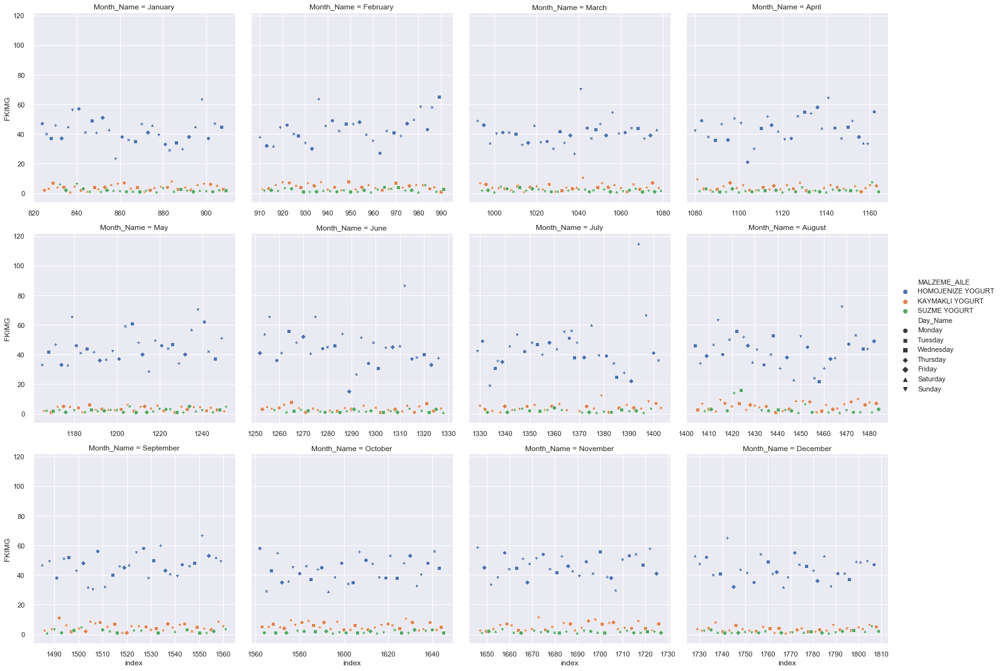

In [214]:
sns_plot = sns.relplot(x = 'index', y = 'FKIMG', hue = 'MALZEME_AILE', style = 'Day_Name', col ='Month_Name', col_wrap= 4, data = df_buy_yo_sum.query("Year_Name == '2018'"), facet_kws=dict( sharex=False,sharey=True, despine=True), col_order=['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']).set(adjustable='datalim', aspect='auto')

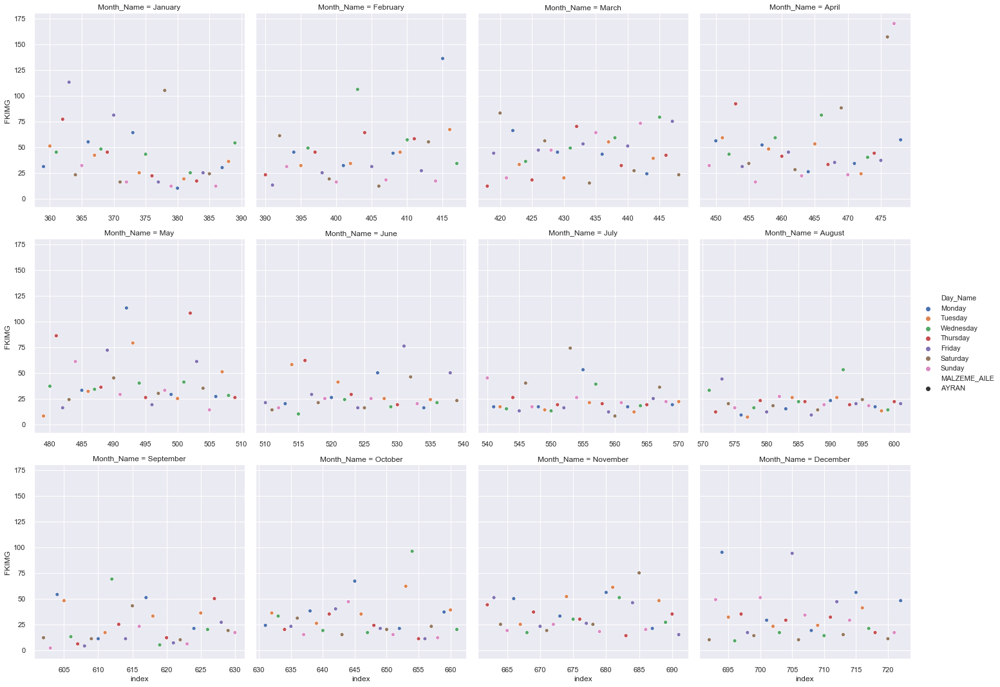

In [253]:
sns_plot = sns.relplot(x = 'index', y = 'FKIMG', hue = 'Day_Name', style = 'MALZEME_AILE', col ='Month_Name', col_wrap= 4, data = df_buy_ay_sum.query("Year_Name == '2018'"), facet_kws=dict( sharex=False,sharey=True, despine=True), col_order=['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']).set(adjustable='datalim', aspect='auto')
#sns_plot.fig.autofmt_xdate()
#sns_plot.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/michigan_temp_rain_year.png", dpi=600)
#sns_plot.fig.tight_layout()

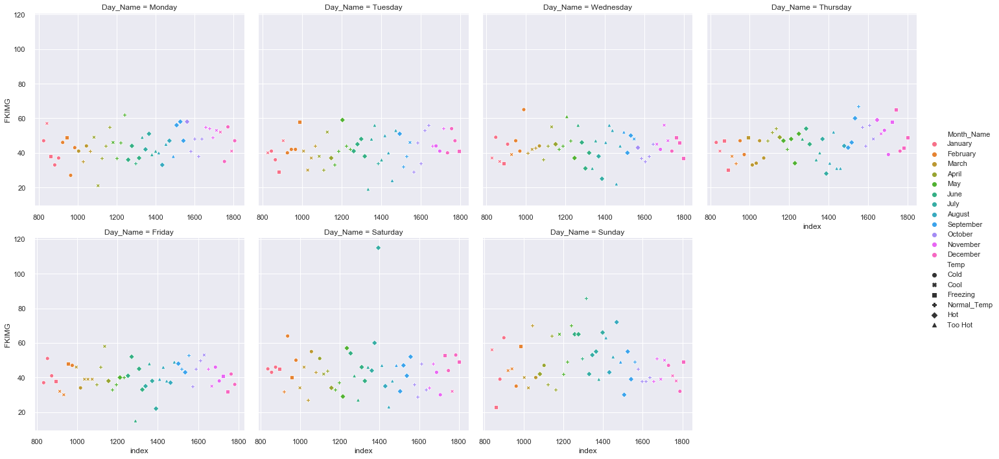

In [259]:
sns_plot = sns.relplot(x = 'index', y = 'FKIMG', hue = 'Month_Name', style = 'Temp', col = 'Day_Name', col_wrap= 4, data = df_buy_yo_sum.query("(Year_Name == '2018') & (MALZEME_AILE == 'HOMOJENIZE YOGURT')"), facet_kws=dict( sharex=False,sharey=True, despine=True), col_order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']).set(adjustable='datalim', aspect='auto')

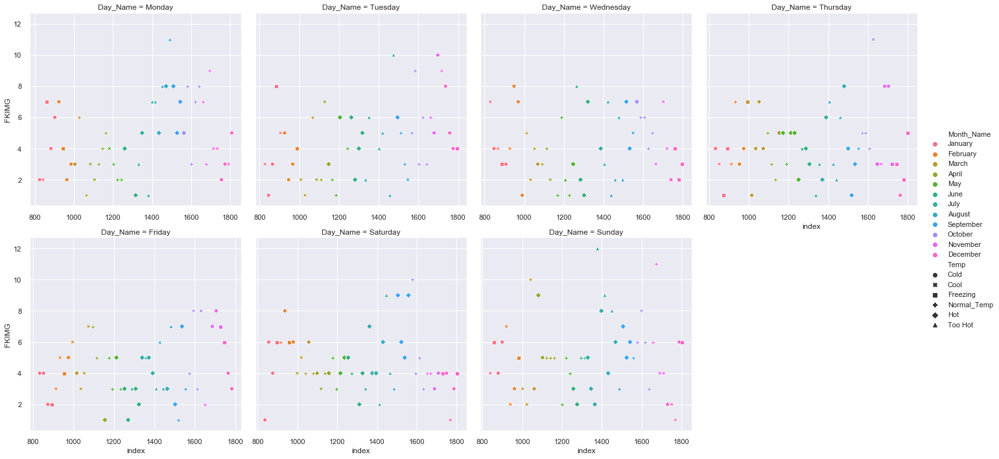

In [260]:
sns_plot = sns.relplot(x = 'index', y = 'FKIMG', hue = 'Month_Name', style = 'Temp', col = 'Day_Name', col_wrap= 4, data = df_buy_yo_sum.query("(Year_Name == '2018') & (MALZEME_AILE == 'KAYMAKLI YOGURT')"), facet_kws=dict( sharex=False,sharey=True, despine=True), col_order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']).set(adjustable='datalim', aspect='auto')

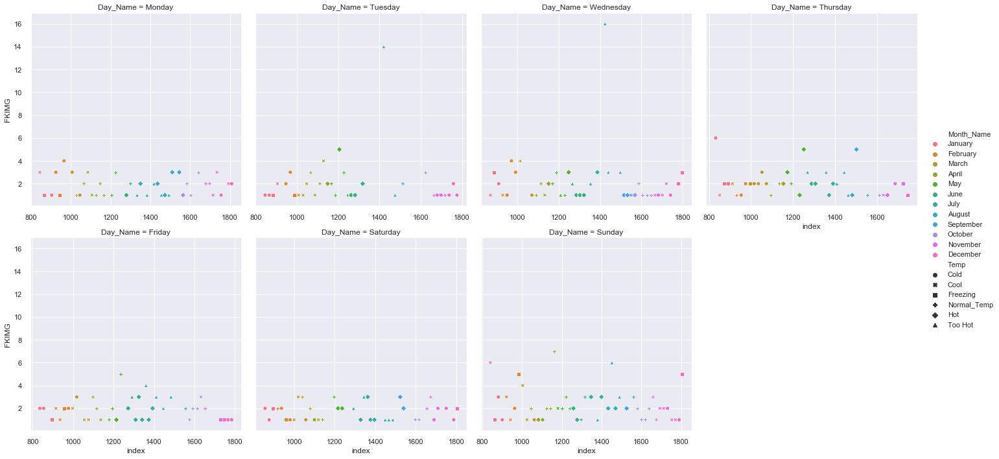

In [261]:
sns_plot = sns.relplot(x = 'index', y = 'FKIMG', hue = 'Month_Name', style = 'Temp', col = 'Day_Name', col_wrap= 4, data = df_buy_yo_sum.query("(Year_Name == '2018') & (MALZEME_AILE == 'SUZME YOGURT')"), facet_kws=dict( sharex=False,sharey=True, despine=True), col_order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']).set(adjustable='datalim', aspect='auto')

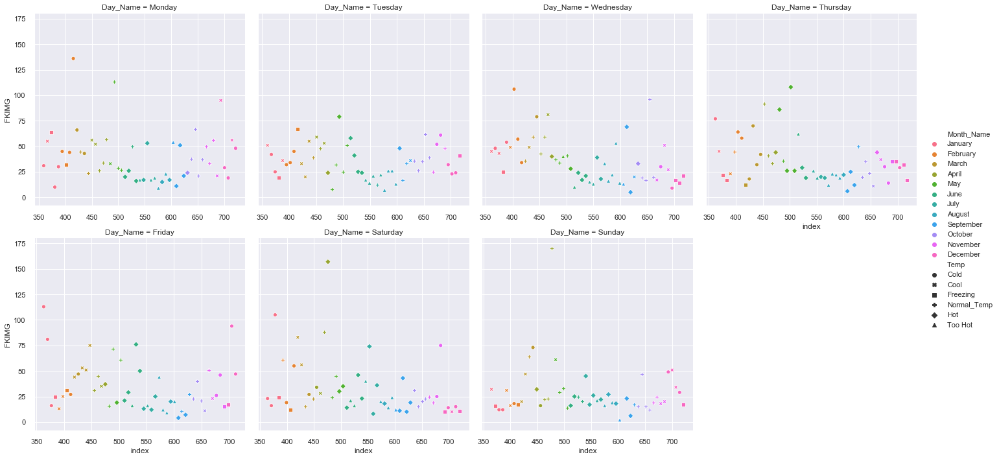

In [258]:
sns_plot = sns.relplot(x = 'index', y = 'FKIMG', hue = 'Month_Name', style = 'Temp', col = 'Day_Name', col_wrap= 4, data = df_buy_ay_sum.query("Year_Name == '2018'"), facet_kws=dict( sharex=False,sharey=True, despine=True), col_order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']).set(adjustable='datalim', aspect='auto')

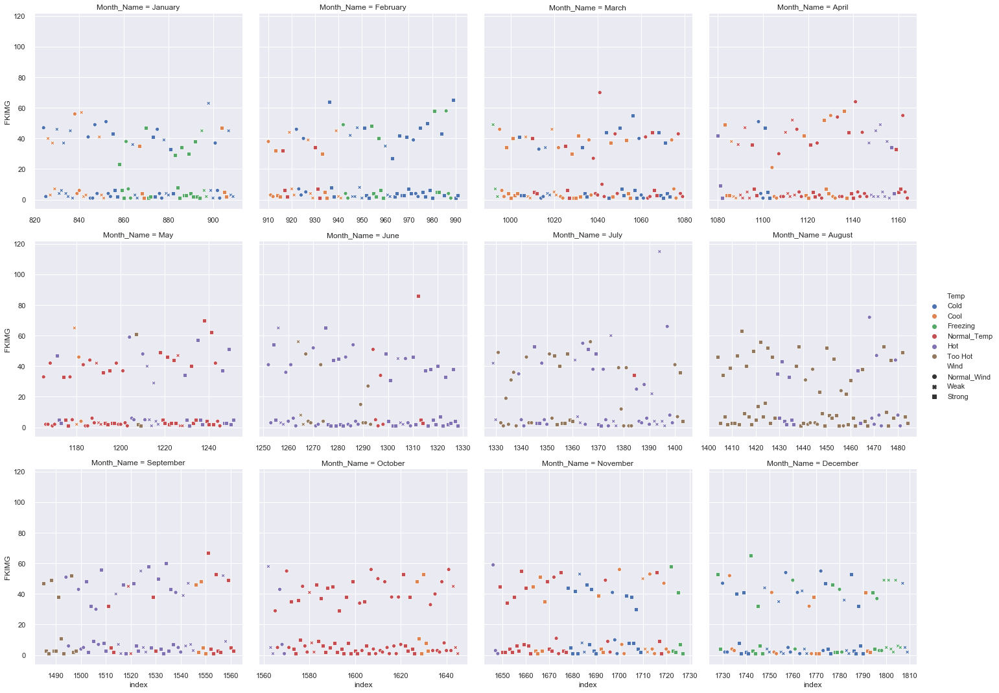

In [216]:
sns_plot = sns.relplot(x = 'index', y = 'FKIMG', hue = 'Temp', style = 'Wind', col ='Month_Name', col_wrap= 4, data = df_buy_yo_sum.query("Year_Name == '2018'"), facet_kws=dict( sharex=False,sharey=True, despine=True), col_order=['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']).set(adjustable='datalim', aspect='auto')
#sns_plot.fig.autofmt_xdate()
#sns_plot.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/michigan_temp_wind_year.png", dpi=600)


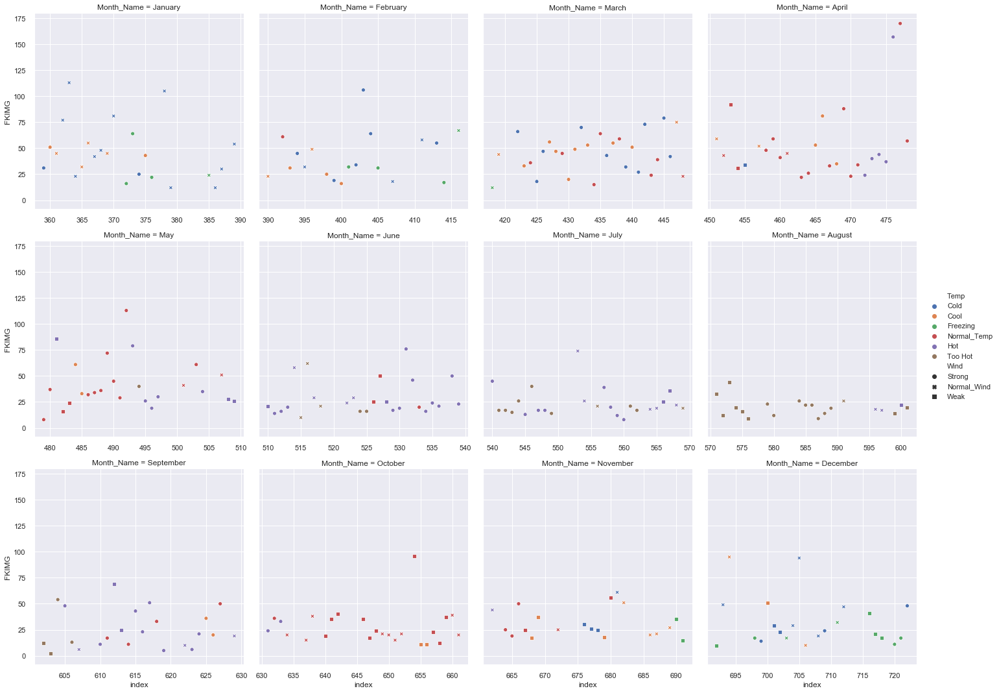

In [225]:
sns_plot = sns.relplot(x = 'index', y = 'FKIMG', hue = 'Temp', style = 'Wind', col ='Month_Name', col_wrap= 4, data = df_buy_ay_sum.query("Year_Name == '2018'"), facet_kws=dict( sharex=False,sharey=True, despine=True), col_order=['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']).set(adjustable='datalim', aspect='auto')


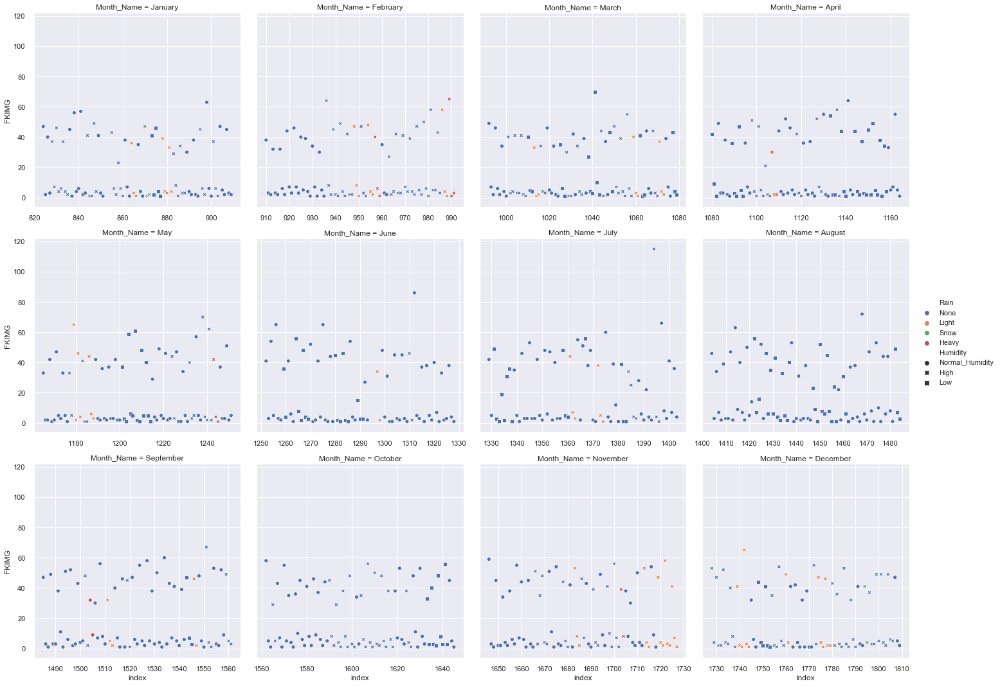

In [249]:
sns_plot = sns.relplot(x = 'index', y = 'FKIMG', hue = 'Rain', style = 'Humidity', col ='Month_Name', col_wrap= 4, data = df_buy_yo_sum.query("Year_Name == '2018'"), facet_kws=dict( sharex=False,sharey=True, despine=True), col_order=['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']).set(adjustable='datalim', aspect='auto')
#sns_plot.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/michigan_rain_humidity_year.png", dpi=600)


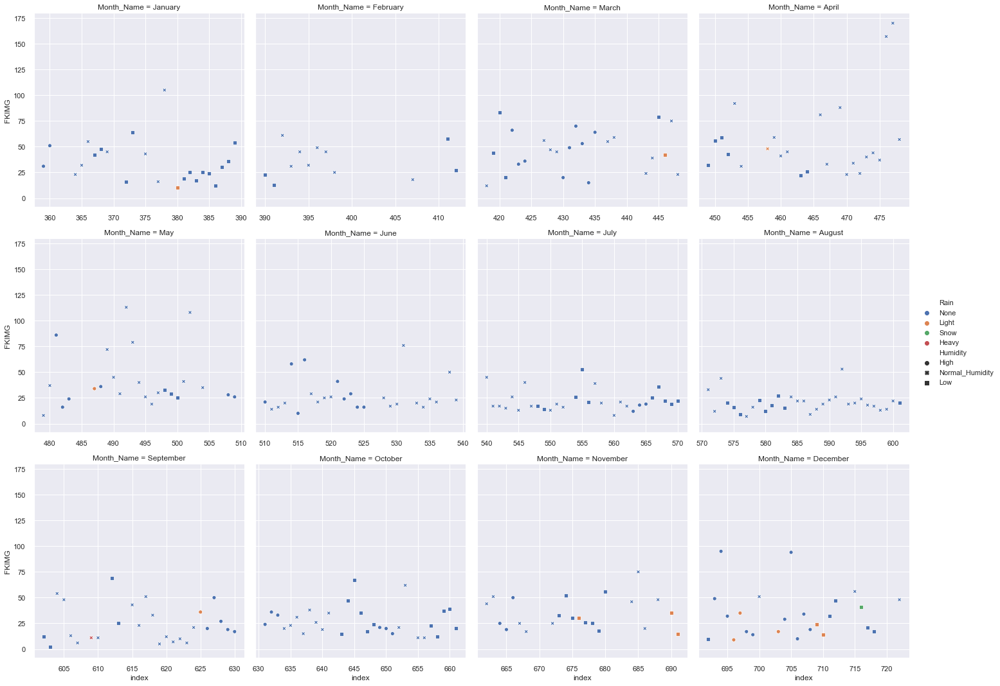

In [250]:
sns_plot = sns.relplot(x = 'index', y = 'FKIMG', hue = 'Rain', style = 'Humidity', col ='Month_Name', col_wrap= 4, data = df_buy_ay_sum.query("Year_Name == '2018'"), facet_kws=dict( sharex=False,sharey=True, despine=True), col_order=['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']).set(adjustable='datalim', aspect='auto')


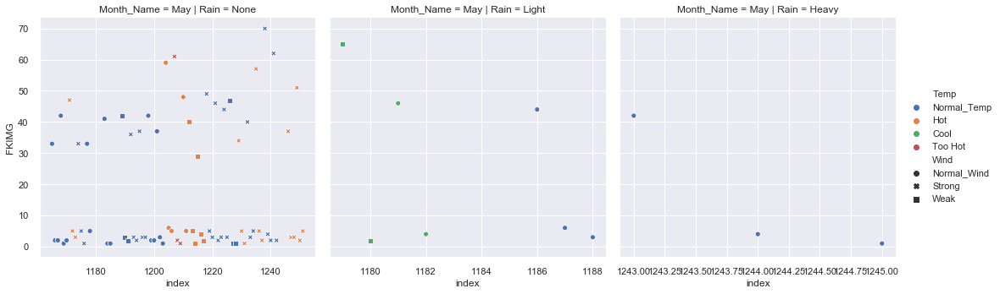

In [251]:
sns_plot = sns.relplot(x = 'index', y = 'FKIMG', hue = 'Temp', style = 'Wind', col='Rain', row ='Month_Name', data = df_buy_yo_sum.query( "(Year_Name == '2018') & (Month_Name == 'May')"), facet_kws=dict( sharex=False,sharey=True, despine=True)).set(adjustable='datalim', aspect='auto')
#sns_plot.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/michigan_temp_rain_wind_may.png", dpi=600)


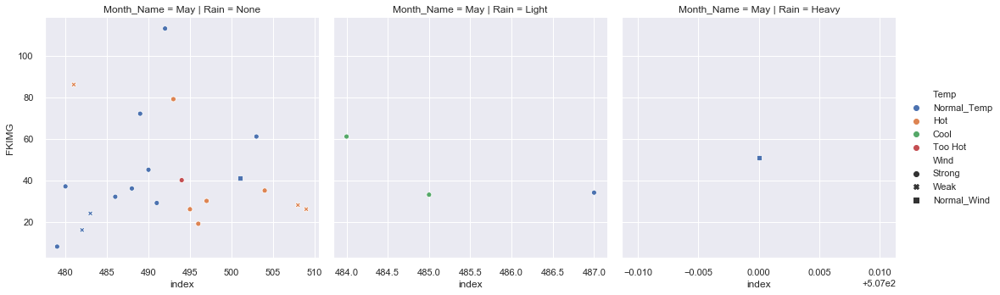

In [252]:
sns_plot = sns.relplot(x = 'index', y = 'FKIMG', hue = 'Temp', style = 'Wind', col='Rain', row ='Month_Name', data = df_buy_ay_sum.query( "(Year_Name == '2018') & (Month_Name == 'May')"), facet_kws=dict( sharex=False,sharey=True, despine=True)).set(adjustable='datalim', aspect='auto')


In [369]:
#the difference between two probability distributions
def kl_divergence(p, q):
    """Calculates the Kullback–Leibler divergence
    """
    return np.sum(np.where(p != 0, p * np.log(p / q), 0))

In [281]:
def add_condition(condition_dict, column, condition):
    """Add conditions to a default dict
    """
    condition_dict[column] = condition


In [307]:
def clt_distribution_comparison(df, condition_dict, options):
    """Implementation of Central Limit Theorem on specific conditions
    """
    #Define defaultdict or regular
    describe_dict = defaultdict(list)
    df_a = pd.DataFrame()
    df_b = pd.DataFrame()

    for i in range(options['population_size']):
        #clear past samples
        df_a.empty
        df_b.empty
        # sample data for all conditions
        condition = ''
        first = 0
        for column in condition_dict.items():
            if first == 0 :
                df_a = df.loc[df[column[0]] == column[1]]
            else:
                df_a = df_a.loc[df_a[column[0]] == column[1]]
            first += 1

        random_list = []
        for j in range(options['sample_size']):
            random_list.append(random.randint(0, df_a.shape[0]-1))
        df_b = df_a.iloc[random_list]
        describe_dict['mean'].append(df_b[options['output']].mean())
        describe_dict['var'].append(df_b[options['output']].std())

    describe_dict['population_mean'] = statistics.mean(describe_dict['mean']) 
    describe_dict['population_var'] = statistics.variance(describe_dict['mean']) / math.sqrt(population_size)

    return describe_dict

In [365]:
def single_plot(describe_dict, condition_index):
    """Plots the distribution 
    """
    sigma = math.sqrt(describe_dict['var'][condition_index])
    x = np.linspace(describe_dict['mean'][condition_index] - 3*sigma, describe_dict['mean'][condition_index] + 3*sigma, 1000)
    plt.plot(x, stats.norm.pdf(x, describe_dict['mean'][condition_index], sigma))
    plt.title('Central Limit Theorem ' + describe_dict['condition'][condition_index])
    plt.xlabel('Quantity of the Sale')
    plt.ylabel('Normal Distribution')
    plt.show()


#plt.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/michigan_kl_may_high_humidity.png", dpi=600)


In [479]:
def comparison_kl_plot(describe_dict, condition_index, range_list):
    """
    KL Comparision between base and other condition
    The first dict input should be base condition
    """
    x = np.arange(range_list[0], range_list[1], range_list[2])
    p = stats.norm.pdf(x, describe_dict['mean'][0], describe_dict['var'][0])
    q = stats.norm.pdf(x, describe_dict['mean'][condition_index], math.sqrt(describe_dict['var'][condition_index]))
    plt.title('KL(P||Q) = %1.3f' % kl_divergence(p, q))
    plt.xlabel('Comparison of different conditions')
    plt.plot(x, p, c='k')
    plt.plot(x, q, c='red', linestyle='--')
    plt.legend((describe_dict['condition'][0], describe_dict['condition'][condition_index]),
                loc='best', shadow=True)


In [478]:
def comparison_plot(describe_dict, range_list):
    """Comparision plot among conditions
    """
    x = np.arange(range_list[0], range_list[1], range_list[2])
    p = stats.norm.pdf(x, describe_dict['mean'][0], describe_dict['var'][0])

    q = []
    for i in range(len(describe_dict['mean'])):

        q.append(stats.norm.pdf(x, describe_dict['mean'][i], math.sqrt(describe_dict['var'][i])))
    
    #  DO write more modular
    for i in range(len(describe_dict['mean'])):

        if i == 0:
            plt.plot(x, q[i], c='k')
        elif i == 1:
            plt.plot(x, q[i], c='red', linestyle='--')
            plt.legend((describe_dict['condition'][0], describe_dict['condition'][i]), loc='best', shadow=True)
        elif i == 2:
            plt.plot(x, q[i], c='green', linestyle=':')
            plt.legend((describe_dict['condition'][0], describe_dict['condition'][1], describe_dict['condition'][i]), loc='best', shadow=True)
        elif i == 3:
            plt.plot(x, q[i], c='m', linestyle='-.')
            plt.legend((describe_dict['condition'][0], describe_dict['condition'][1], describe_dict['condition'][2], describe_dict['condition'] [i]), loc='best', shadow=True)
        elif i == 4:
            plt.plot(x, q[i], c='darkorange', linestyle='-')
            plt.legend((describe_dict['condition'][0], describe_dict['condition'][1], describe_dict['condition'][2],  describe_dict['condition'][3], describe_dict['condition'][i]), loc='best', shadow=True)
        elif i == 5:
            plt.plot(x, q[i], c='olive', linestyle='--')
            plt.legend((describe_dict['condition'][0], describe_dict['condition'][1], describe_dict['condition'][2],  describe_dict['condition'][3], describe_dict['condition'][4], describe_dict['condition'][i]), loc='best', shadow=True)
        elif i == 6:
            plt.plot(x, q[i], c='maroon', linestyle=':')
            plt.legend((describe_dict['condition'][0], describe_dict['condition'][1], describe_dict['condition'][2],  describe_dict['condition'][3], describe_dict['condition'][4], describe_dict['condition'][5], describe_dict['condition'][i]), loc='best', shadow=True)
        elif i == 7:
            plt.plot(x, q[i], c='blue', linestyle='-.')
            plt.legend((describe_dict['condition'][0], describe_dict['condition'][1], describe_dict['condition'][2],  describe_dict['condition'][3], describe_dict['condition'][4], describe_dict['condition'][5], describe_dict['condition'][6], describe_dict['condition'][i]), loc='best', shadow=True)


    plt.title(describe_dict['condition'][0] + ' ' + 'Analysis')

In [357]:
describe_dict = defaultdict(list)

In [358]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'January')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_ay_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

In [364]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'January')
add_condition(condition_dict, 'Temp', 'Freezing')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 10}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_ay_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

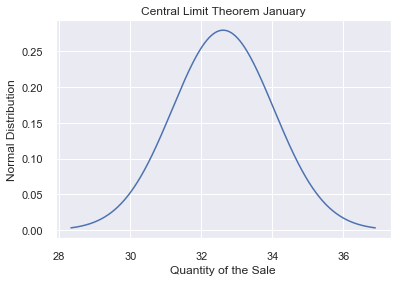

In [375]:
# January
condition_index = 0
single_plot(describe_dict, condition_index)


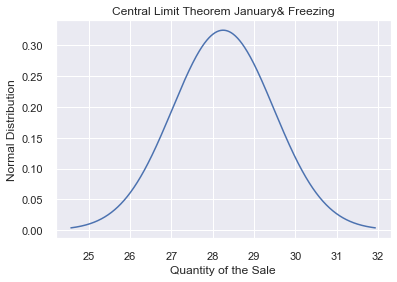

In [376]:
# January & Freezing
condition_index = 1
single_plot(describe_dict, condition_index)


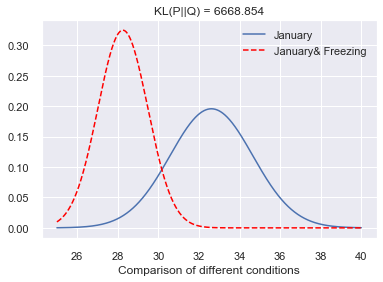

In [366]:
# range and precision of the plot
range_list = [25, 40, 0.001]
# Freezing
condition_index = 1
comparison_kl_plot(describe_dict, condition_index, range_list)


In [371]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'January')
add_condition(condition_dict, 'Temp', 'Cool')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 10}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_ay_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

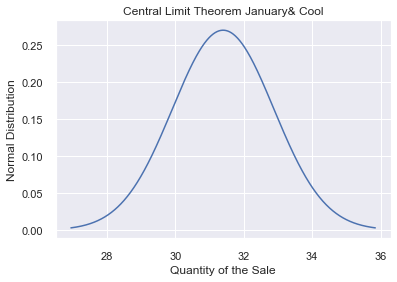

In [373]:
# January & Cool
condition_index = 2
single_plot(describe_dict, condition_index)


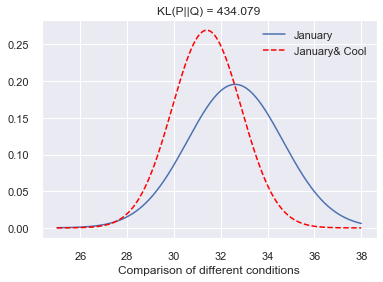

In [374]:
# range and precision of the plot
range_list = [25, 38, 0.001]
# Cool
condition_index = 2
comparison_kl_plot(describe_dict, condition_index, range_list)


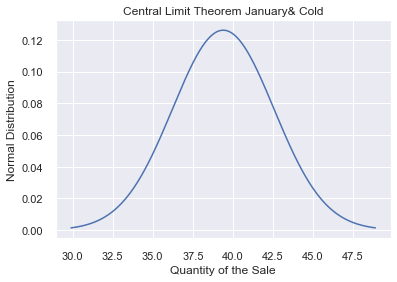

In [377]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'January')
add_condition(condition_dict, 'Temp', 'Cold')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 10}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_ay_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# January & Cold
condition_index = 3
single_plot(describe_dict, condition_index)


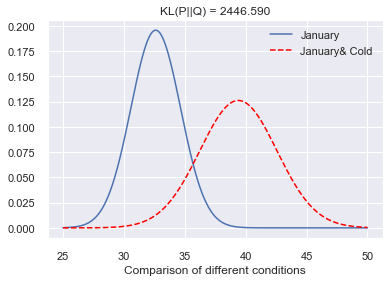

In [378]:
# range and precision of the plot
range_list = [25, 50, 0.001]
# Cool
condition_index = 3
comparison_kl_plot(describe_dict, condition_index, range_list)


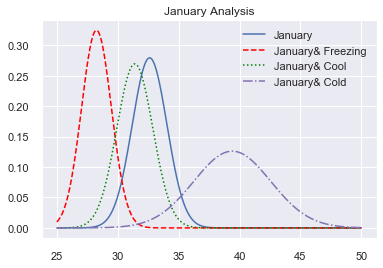

In [413]:
# range and precision of the plot
range_list = [25, 50, 0.001]
# All Conditions
comparison_plot(describe_dict, range_list)


In [414]:
describe_dict = defaultdict(list)

In [415]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'May')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_ay_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

In [416]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'May')
add_condition(condition_dict, 'Temp', 'Normal_Temp')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 10}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_ay_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

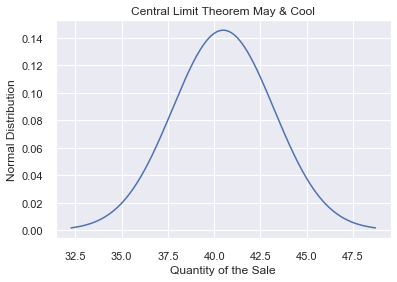

In [417]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'May')
add_condition(condition_dict, 'Temp', 'Cool')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 10}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_ay_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# May & Cool
condition_index = 2
single_plot(describe_dict, condition_index)


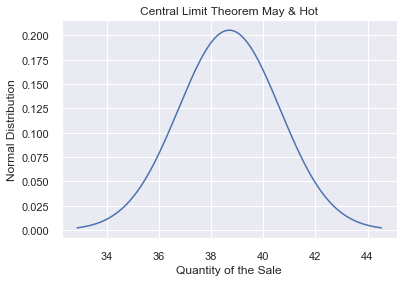

In [418]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'May')
add_condition(condition_dict, 'Temp', 'Hot')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 10}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_ay_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# January & Cold
condition_index = 3
single_plot(describe_dict, condition_index)


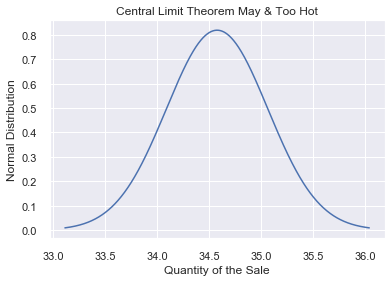

In [419]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'May')
add_condition(condition_dict, 'Temp', 'Too Hot')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 10}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_ay_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# January & Cold
condition_index = 4
single_plot(describe_dict, condition_index)


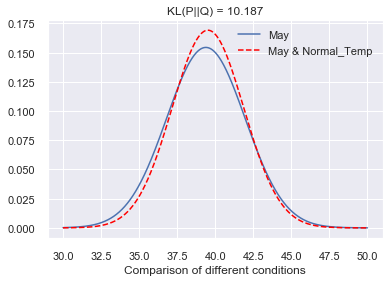

In [422]:
# range and precision of the plot
range_list = [30, 50, 0.001]
# Normal
condition_index = 1
comparison_kl_plot(describe_dict, condition_index, range_list)


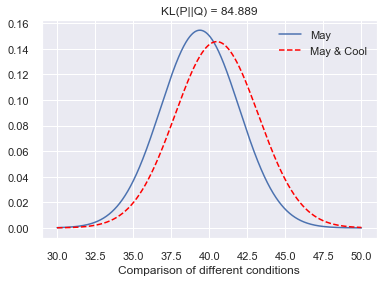

In [423]:
# range and precision of the plot
range_list = [30, 50, 0.001]
# Cool
condition_index = 2
comparison_kl_plot(describe_dict, condition_index, range_list)

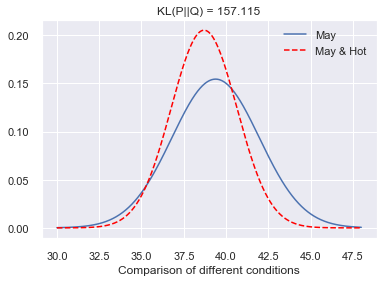

In [425]:
# range and precision of the plot
range_list = [30, 48, 0.001]
# Hot
condition_index = 3
comparison_kl_plot(describe_dict, condition_index, range_list)

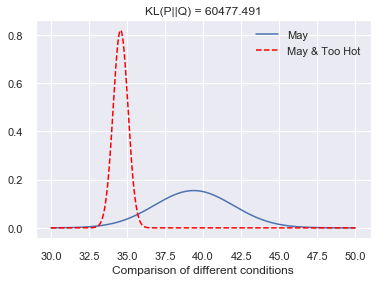

In [431]:
# range and precision of the plot
range_list = [30, 50, 0.001]
# Too Hot
condition_index = 4
comparison_kl_plot(describe_dict, condition_index, range_list)

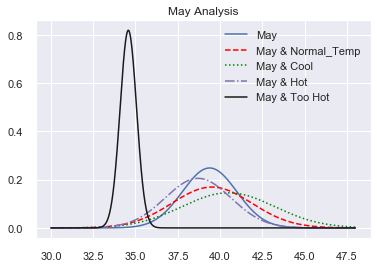

In [433]:
# range and precision of the plot
range_list = [30, 48, 0.001]
# All Conditions
comparison_plot(describe_dict, range_list)


In [444]:
describe_dict = defaultdict(list)

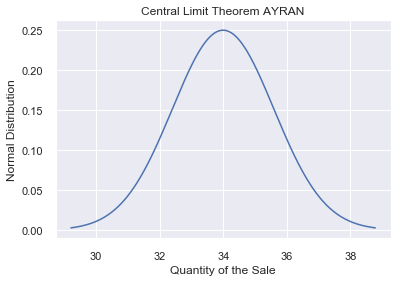

In [445]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'MALZEME_AILE', 'AYRAN')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_ay_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# May & Cool
condition_index = 0
single_plot(describe_dict, condition_index)


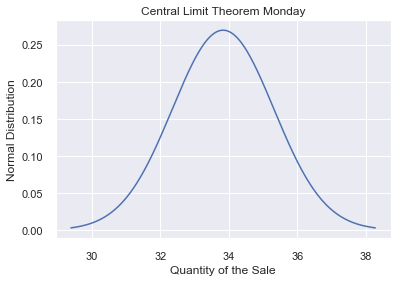

In [446]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Day_Name', 'Monday')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_ay_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# May & Cool
condition_index = 1
single_plot(describe_dict, condition_index)


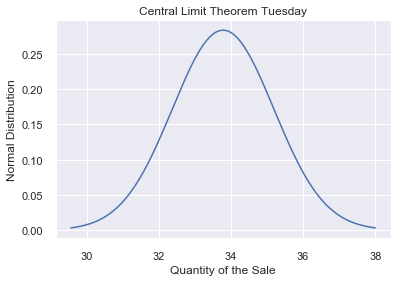

In [447]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Day_Name', 'Tuesday')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_ay_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# May & Cool
condition_index = 2
single_plot(describe_dict, condition_index)

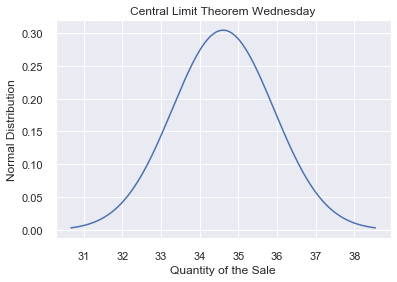

In [448]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Day_Name', 'Wednesday')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_ay_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# May & Cool
condition_index = 3
single_plot(describe_dict, condition_index)

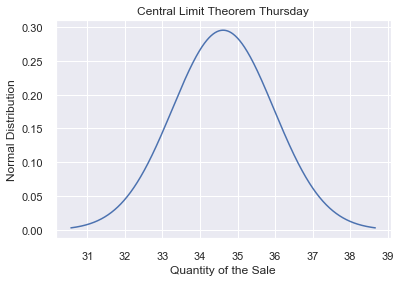

In [449]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Day_Name', 'Thursday')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_ay_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# May & Cool
condition_index = 4
single_plot(describe_dict, condition_index)

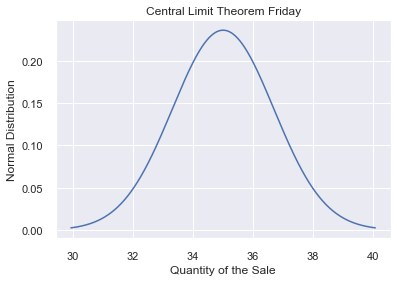

In [450]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Day_Name', 'Friday')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_ay_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# May & Cool
condition_index = 5
single_plot(describe_dict, condition_index)

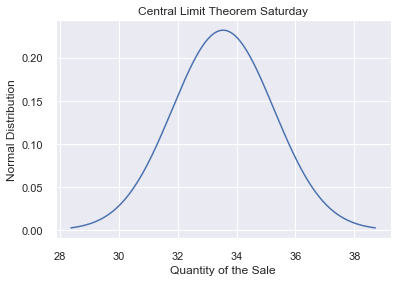

In [451]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Day_Name', 'Saturday')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_ay_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# May & Cool
condition_index = 6
single_plot(describe_dict, condition_index)

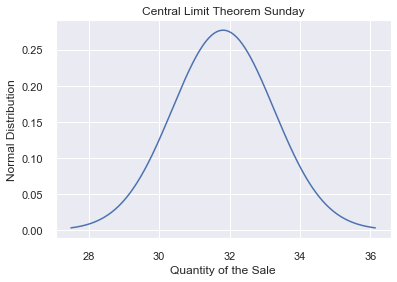

In [452]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Day_Name', 'Sunday')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_ay_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# May & Cool
condition_index = 7
single_plot(describe_dict, condition_index)

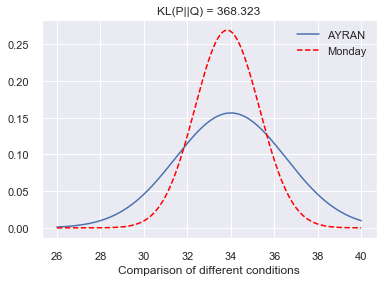

In [453]:
# range and precision of the plot
range_list = [26, 40, 0.001]
# Too Hot
condition_index = 1
comparison_kl_plot(describe_dict, condition_index, range_list)

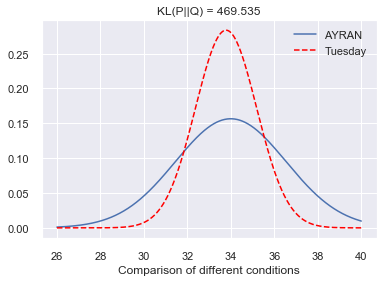

In [454]:
# range and precision of the plot
range_list = [26, 40, 0.001]
# Too Hot
condition_index = 2
comparison_kl_plot(describe_dict, condition_index, range_list)

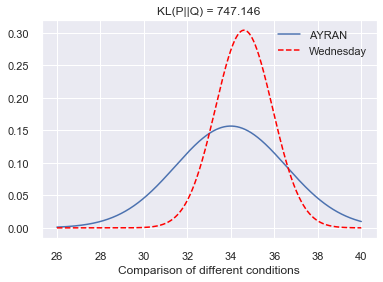

In [455]:
# range and precision of the plot
range_list = [26, 40, 0.001]
# Too Hot
condition_index = 3
comparison_kl_plot(describe_dict, condition_index, range_list)

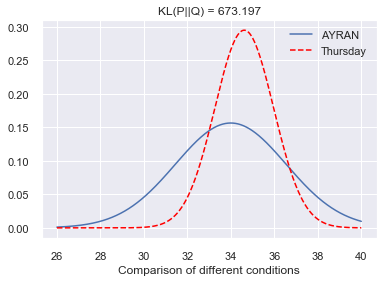

In [456]:
# range and precision of the plot
range_list = [26, 40, 0.001]
# Too Hot
condition_index = 4
comparison_kl_plot(describe_dict, condition_index, range_list)

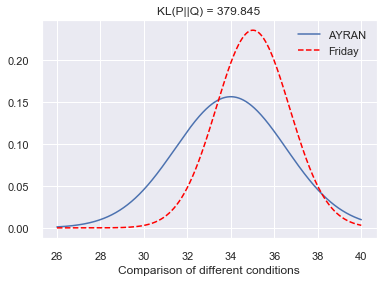

In [457]:
# range and precision of the plot
range_list = [26, 40, 0.001]
# Too Hot
condition_index = 5
comparison_kl_plot(describe_dict, condition_index, range_list)

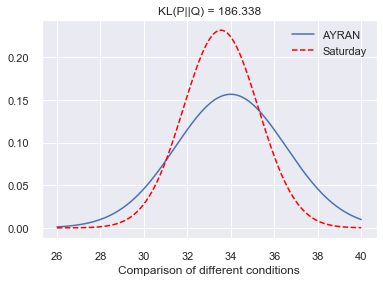

In [458]:
# range and precision of the plot
range_list = [26, 40, 0.001]
# Too Hot
condition_index = 6
comparison_kl_plot(describe_dict, condition_index, range_list)

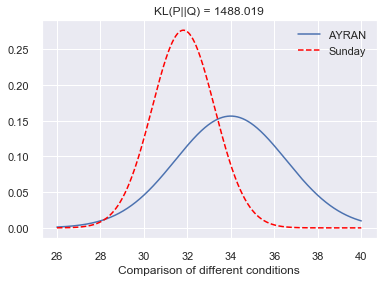

In [459]:
# range and precision of the plot
range_list = [26, 40, 0.001]
# Too Hot
condition_index = 7
comparison_kl_plot(describe_dict, condition_index, range_list)

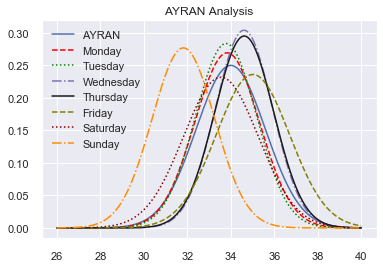

In [462]:
# range and precision of the plot
range_list = [26, 40, 0.001]
# All Conditions
comparison_plot(describe_dict, range_list)


In [465]:
df_buy_yo_h_sum = df_buy_yo_sum.loc[df_buy_yo_sum.MALZEME_AILE == 'HOMOJENIZE YOGURT']
df_buy_yo_h_sum

,index,FKDAT,MALZEME_AILE,FKIMG,NETWR,Day_Name,Month_Name,Year_Name,Datee,13:00-Wind,13:00-Temperature,13:00-Humidity,13:00-WindSpeed,13:00-RainPast,13:00-Rain,13:00-Cloud,Rain,Temp,Wind,Humidity
0,0,2017-03-01,HOMOJENIZE YOGURT,43.0,195.70,Wednesday,March,2017,2017-03-01,Wind blowing from the south-southwest,12.0,72.0,3.0,NaN,NULL,No Significant Clouds,None,Cold,Weak,High
2,2,2017-03-02,HOMOJENIZE YOGURT,60.0,261.39,Thursday,March,2017,2017-03-02,Wind blowing from the north-northeast,12.0,77.0,7.0,NaN,NULL,"Scattered clouds (40-50%) 690 m, broken clouds...",None,Cold,Strong,High
5,5,2017-03-03,HOMOJENIZE YOGURT,48.0,221.21,Friday,March,2017,2017-03-03,Wind blowing from the south-west,12.0,72.0,3.0,NaN,NULL,Few clouds (10-30%) 660 m,None,Cold,Weak,High
8,8,2017-03-04,HOMOJENIZE YOGURT,39.0,176.91,Saturday,March,2017,2017-03-04,Wind blowing from the east-northeast,16.0,31.0,5.0,NaN,NULL,No Significant Clouds,None,Cool,Normal_Wind,Low
11,11,2017-03-05,HOMOJENIZE YOGURT,43.0,174.88,Sunday,March,2017,2017-03-05,Wind blowing from the west-southwest,18.0,32.0,3.0,NaN,NULL,No Significant Clouds,None,Normal_Temp,Weak,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2533,2533,2019-10-27,HOMOJENIZE YOGURT,37.0,229.96,Sunday,October,2019,2019-10-27,Wind blowing from the north-northeast,19.0,68.0,5.0,NaN,NULL,Scattered clouds (40-50%) 1050 m,None,Normal_Temp,Normal_Wind,Normal_Humidity
2536,2536,2019-10-28,HOMOJENIZE YOGURT,45.0,255.15,Monday,October,2019,2019-10-28,Wind blowing from the north-northeast,20.0,69.0,4.0,NaN,NULL,"Scattered clouds (40-50%) 900 m, broken clouds...",None,Normal_Temp,Normal_Wind,Normal_Humidity
2539,2539,2019-10-29,HOMOJENIZE YOGURT,36.0,249.32,Tuesday,October,2019,2019-10-29,Wind blowing from the west-southwest,20.0,64.0,4.0,NaN,NULL,Scattered clouds (40-50%) 900 m,None,Normal_Temp,Normal_Wind,Normal_Humidity
2542,2542,2019-10-30,HOMOJENIZE YOGURT,37.0,242.65,Wednesday,October,2019,2019-10-30,Wind blowing from the north-northeast,21.0,60.0,3.0,NaN,NULL,Scattered clouds (40-50%) 990 m,None,Normal_Temp,Weak,Normal_Humidity


In [496]:
describe_dict = defaultdict(list)

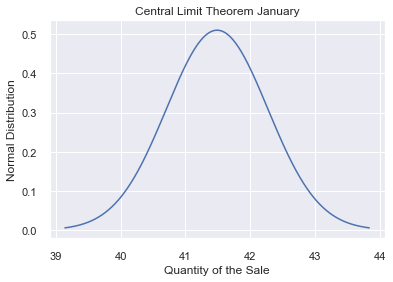

In [497]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'January')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 10}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_yo_h_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# January & Cold
condition_index = 0
single_plot(describe_dict, condition_index)

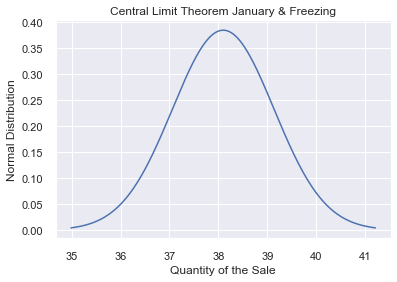

In [498]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'January')
add_condition(condition_dict, 'Temp', 'Freezing')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 10}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_yo_h_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# January & Cold
condition_index = 1
single_plot(describe_dict, condition_index)

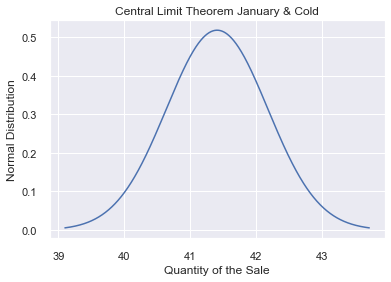

In [499]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'January')
add_condition(condition_dict, 'Temp', 'Cold')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 10}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_yo_h_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# January & Cold
condition_index = 2
single_plot(describe_dict, condition_index)

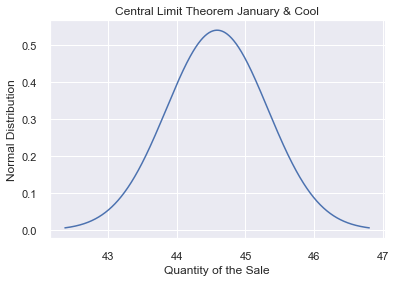

In [500]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'January')
add_condition(condition_dict, 'Temp', 'Cool')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 10}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_yo_h_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# January & Cold
condition_index = 3
single_plot(describe_dict, condition_index)

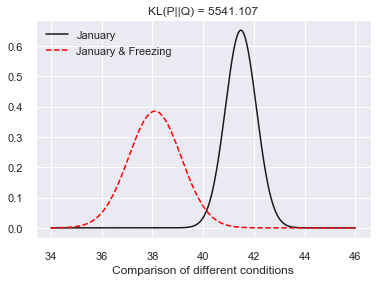

In [503]:
# range and precision of the plot
range_list = [34, 46, 0.001]
# Too Hot
condition_index = 1
comparison_kl_plot(describe_dict, condition_index, range_list)

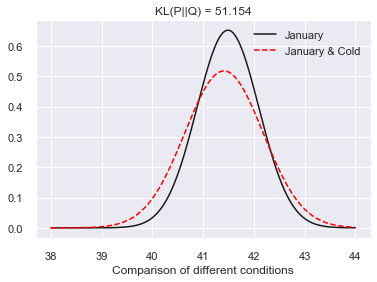

In [506]:
# range and precision of the plot
range_list = [38, 44, 0.001]
# Too Hot
condition_index = 2
comparison_kl_plot(describe_dict, condition_index, range_list)

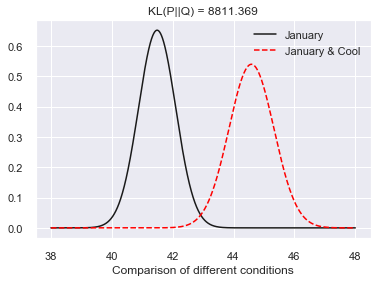

In [510]:
# range and precision of the plot
range_list = [38, 48, 0.001]
# Too Hot
condition_index = 3
comparison_kl_plot(describe_dict, condition_index, range_list)

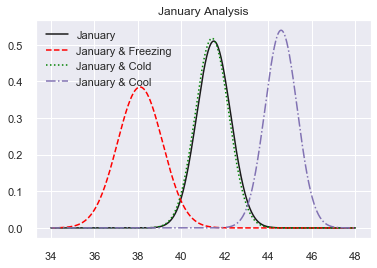

In [511]:
# range and precision of the plot
range_list = [34, 48, 0.001]
# All Conditions
comparison_plot(describe_dict, range_list)


In [514]:
describe_dict = defaultdict(list)

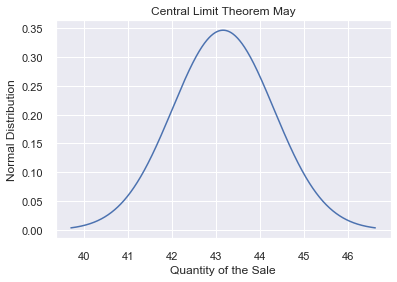

In [515]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'May')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 10}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_yo_h_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# January & Cold
condition_index = 0
single_plot(describe_dict, condition_index)

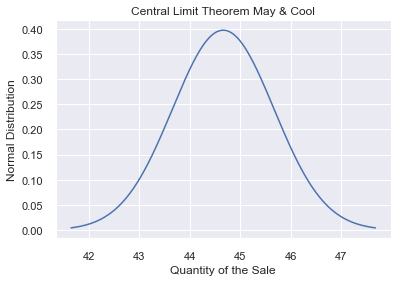

In [516]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'May')
add_condition(condition_dict, 'Temp', 'Cool')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 10}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_yo_h_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# January & Cold
condition_index = 1
single_plot(describe_dict, condition_index)

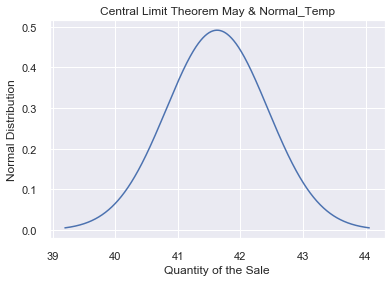

In [517]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'May')
add_condition(condition_dict, 'Temp', 'Normal_Temp')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 10}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_yo_h_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# January & Cold
condition_index = 2
single_plot(describe_dict, condition_index)

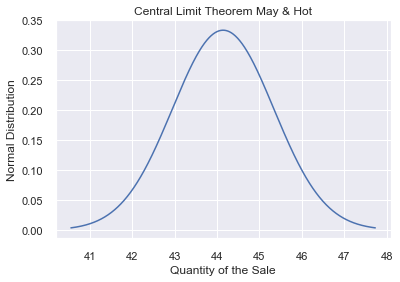

In [518]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'May')
add_condition(condition_dict, 'Temp', 'Hot')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 10}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_yo_h_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# January & Cold
condition_index = 3
single_plot(describe_dict, condition_index)

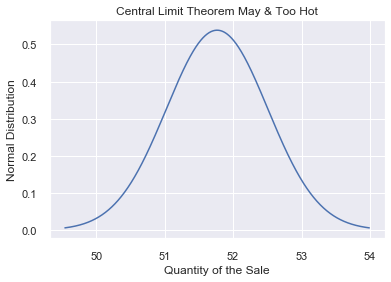

In [519]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Month_Name', 'May')
add_condition(condition_dict, 'Temp', 'Too Hot')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 10}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_yo_h_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# January & Cold
condition_index = 4
single_plot(describe_dict, condition_index)

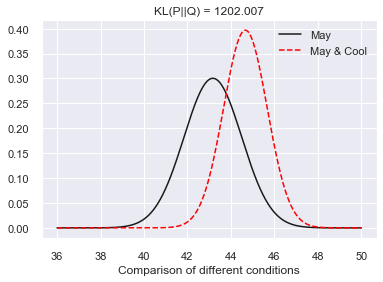

In [521]:
# range and precision of the plot
range_list = [36, 50, 0.001]
# Too Hot
condition_index = 1
comparison_kl_plot(describe_dict, condition_index, range_list)

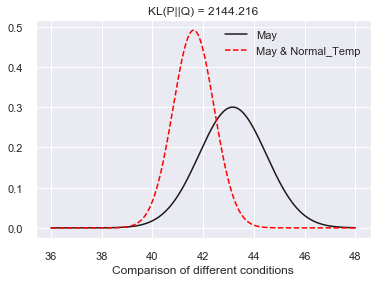

In [523]:
# range and precision of the plot
range_list = [36, 48, 0.001]
# Too Hot
condition_index = 2
comparison_kl_plot(describe_dict, condition_index, range_list)

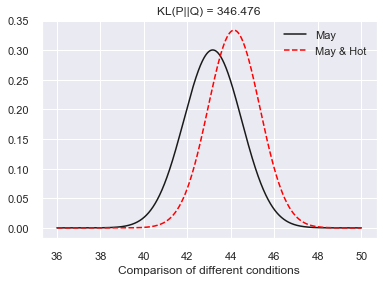

In [524]:
# range and precision of the plot
range_list = [36, 50, 0.001]
# Too Hot
condition_index = 3
comparison_kl_plot(describe_dict, condition_index, range_list)

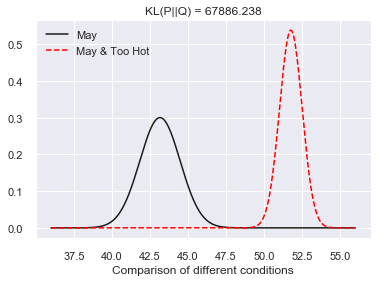

In [526]:
# range and precision of the plot
range_list = [36, 56, 0.001]
# Too Hot
condition_index = 4
comparison_kl_plot(describe_dict, condition_index, range_list)

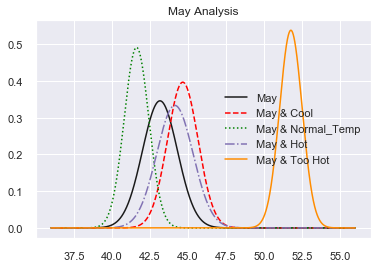

In [527]:
# range and precision of the plot
range_list = [36, 56, 0.001]
# All Conditions
comparison_plot(describe_dict, range_list)


In [531]:
describe_dict = defaultdict(list)

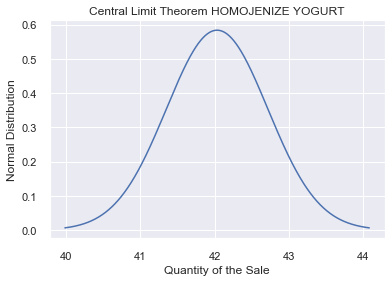

In [532]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'MALZEME_AILE', 'HOMOJENIZE YOGURT')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_yo_h_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# May & Cool
condition_index = 0
single_plot(describe_dict, condition_index)


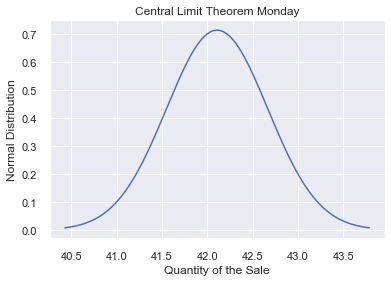

In [533]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Day_Name', 'Monday')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_yo_h_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# May & Cool
condition_index = 1
single_plot(describe_dict, condition_index)


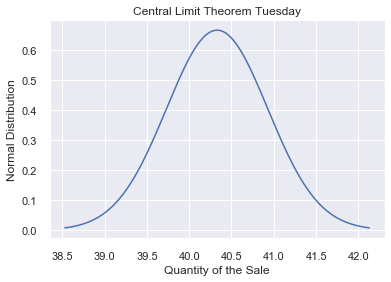

In [534]:
#Define defaultdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Day_Name', 'Tuesday')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_yo_h_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# May & Cool
condition_index = 2
single_plot(describe_dict, condition_index)


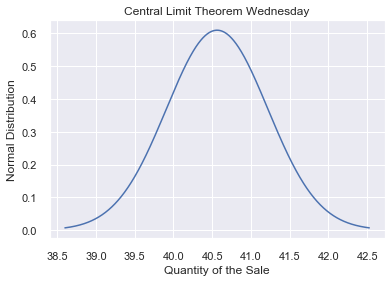

In [535]:
#Define defaualtdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Day_Name', 'Wednesday')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_yo_h_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# May & Cool
condition_index = 3
single_plot(describe_dict, condition_index)


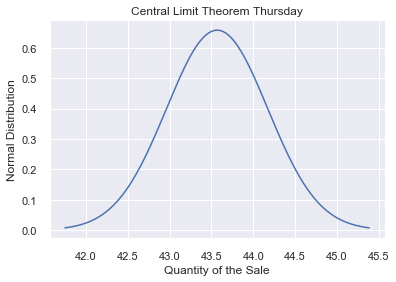

In [536]:
#Define defaualtdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Day_Name', 'Thursday')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_yo_h_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# May & Cool
condition_index = 4
single_plot(describe_dict, condition_index)


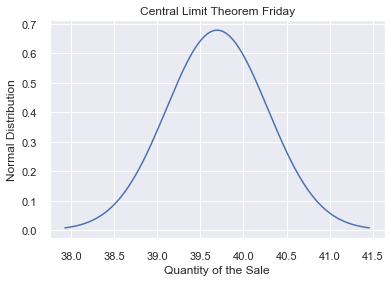

In [537]:
#Define defaualtdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Day_Name', 'Friday')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_yo_h_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# May & Cool
condition_index = 5
single_plot(describe_dict, condition_index)


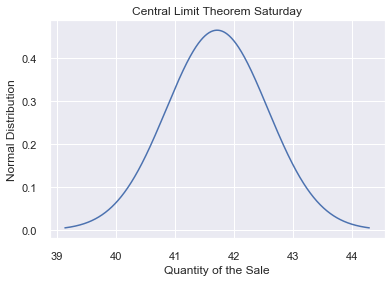

In [538]:
#Define defaualtdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Day_Name', 'Saturday')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_yo_h_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# May & Cool
condition_index = 6
single_plot(describe_dict, condition_index)


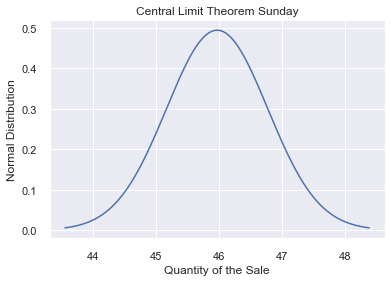

In [539]:
#Define defaualtdict
condition_dict = defaultdict(list)
# Add conditions
add_condition(condition_dict, 'Day_Name', 'Sunday')
# set options dict
options = {'output' : 'FKIMG', 'population_size' : 100, 'sample_size' : 20}

temp_dict = defaultdict(list)

temp_dict = clt_distribution_comparison(df_buy_yo_h_sum, condition_dict, options)

describe_dict['mean'].append(temp_dict['population_mean'])
describe_dict['var'].append(temp_dict['population_var'])

condition = ''
first = 0
for column in condition_dict.items():
    if first == 0 :
        condition += column[1]
    else:
        condition += ' & ' + column[1]
    first += 1

describe_dict['condition'].append(condition)

# May & Cool
condition_index = 7
single_plot(describe_dict, condition_index)


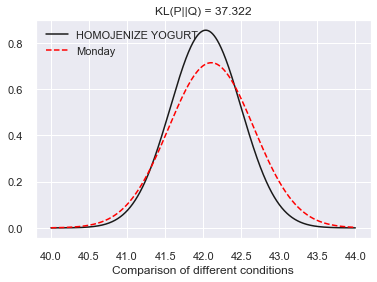

In [542]:
# range and precision of the plot
range_list = [40, 44, 0.001]
# Too Hot
condition_index = 1
comparison_kl_plot(describe_dict, condition_index, range_list)

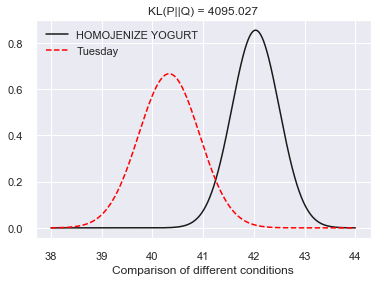

In [545]:
# range and precision of the plot
range_list = [38, 44, 0.001]
# Too Hot
condition_index = 2
comparison_kl_plot(describe_dict, condition_index, range_list)

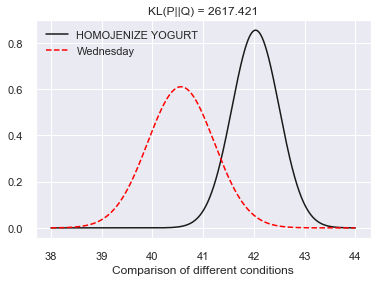

In [548]:
# range and precision of the plot
range_list = [38, 44, 0.001]
# Too Hot
condition_index = 3
comparison_kl_plot(describe_dict, condition_index, range_list)

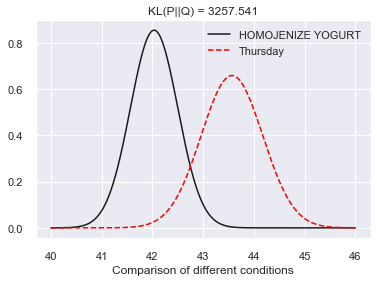

In [552]:
# range and precision of the plot
range_list = [40, 46, 0.001]
# Too Hot
condition_index = 4
comparison_kl_plot(describe_dict, condition_index, range_list)

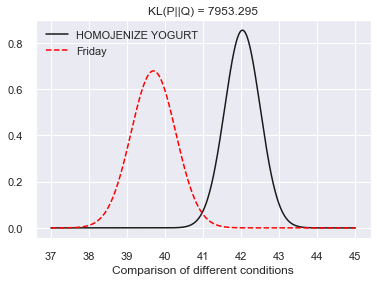

In [555]:
# range and precision of the plot
range_list = [37, 45, 0.001]
# Too Hot
condition_index = 5
comparison_kl_plot(describe_dict, condition_index, range_list)

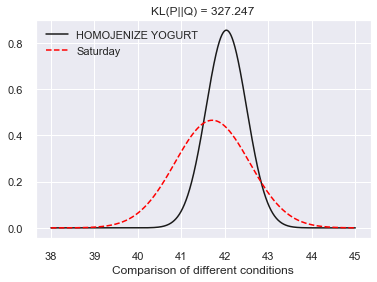

In [559]:
# range and precision of the plot
range_list = [38, 45, 0.001]
# Too Hot
condition_index = 6
comparison_kl_plot(describe_dict, condition_index, range_list)

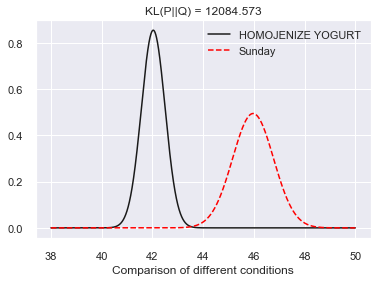

In [561]:
# range and precision of the plot
range_list = [38, 50, 0.001]
# Too Hot
condition_index = 7
comparison_kl_plot(describe_dict, condition_index, range_list)

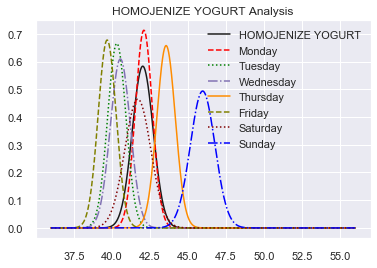

In [562]:
# range and precision of the plot
range_list = [36, 56, 0.001]
# All Conditions
comparison_plot(describe_dict, range_list)


In [594]:
df_buy_ay_sum

,index,FKDAT,MALZEME_AILE,FKIMG,NETWR,Day_Name,Month_Name,Year_Name,Datee,13:00-Wind,13:00-Temperature,13:00-Humidity,13:00-WindSpeed,13:00-RainPast,13:00-Rain,13:00-Cloud,Rain,Temp,Wind,Humidity
0,0,2017-03-01,AYRAN,27.0,29.63,Wednesday,March,2017,2017-03-01,Wind blowing from the south-southwest,12.0,72.0,3.0,NaN,NULL,No Significant Clouds,NaN,Cold,Weak,High
1,1,2017-03-02,AYRAN,68.0,55.43,Thursday,March,2017,2017-03-02,Wind blowing from the north-northeast,12.0,77.0,7.0,NaN,NULL,"Scattered clouds (40-50%) 690 m, broken clouds...",NaN,Cold,Weak,High
2,2,2017-03-03,AYRAN,78.0,44.68,Friday,March,2017,2017-03-03,Wind blowing from the south-west,12.0,72.0,3.0,NaN,NULL,Few clouds (10-30%) 660 m,NaN,Cold,Strong,High
3,3,2017-03-04,AYRAN,32.0,66.48,Saturday,March,2017,2017-03-04,Wind blowing from the east-northeast,16.0,31.0,5.0,NaN,NULL,No Significant Clouds,NaN,Cool,Strong,High
4,4,2017-03-05,AYRAN,26.0,37.46,Sunday,March,2017,2017-03-05,Wind blowing from the west-southwest,18.0,32.0,3.0,NaN,NULL,No Significant Clouds,NaN,Normal_Temp,Strong,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
964,964,2019-10-27,AYRAN,49.0,95.69,Sunday,October,2019,2019-10-27,Wind blowing from the north-northeast,19.0,68.0,5.0,NaN,NULL,Scattered clouds (40-50%) 1050 m,NaN,Normal_Temp,Strong,High
965,965,2019-10-28,AYRAN,29.0,70.18,Monday,October,2019,2019-10-28,Wind blowing from the north-northeast,20.0,69.0,4.0,NaN,NULL,"Scattered clouds (40-50%) 900 m, broken clouds...",NaN,Normal_Temp,Strong,High
966,966,2019-10-29,AYRAN,23.0,49.36,Tuesday,October,2019,2019-10-29,Wind blowing from the west-southwest,20.0,64.0,4.0,NaN,NULL,Scattered clouds (40-50%) 900 m,NaN,Normal_Temp,Strong,High
967,967,2019-10-30,AYRAN,35.0,66.85,Wednesday,October,2019,2019-10-30,Wind blowing from the north-northeast,21.0,60.0,3.0,NaN,NULL,Scattered clouds (40-50%) 990 m,NaN,Normal_Temp,Strong,High


In [592]:
df_buy_ay_sum.corr()


,FKIMG,NETWR,13:00-Temperature,13:00-Humidity,13:00-WindSpeed
FKIMG,1.000000,0.629113,-0.146553,-0.001104,-0.100086
NETWR,0.629113,1.000000,0.077562,-0.071392,-0.004533
13:00-Temperature,-0.146553,0.077562,1.000000,-0.549237,0.084087
13:00-Humidity,-0.001104,-0.071392,-0.549237,1.000000,0.045206
13:00-WindSpeed,-0.100086,-0.004533,0.084087,0.045206,1.000000


In [595]:
df_buy_ay_sum_corr = df_buy_ay_sum.copy()
df_buy_ay_sum_corr.drop(columns=['index', 'NETWR' ], axis=1, inplace=True)
df_buy_ay_sum_corr.rename(columns={"13:00-Temperature": "Temperature", "13:00-WindSpeed": "WindSpeed", "13:00-Humidity": "Humidity"}, inplace=True)
df_buy_ay_sum_corr.corr()

,FKIMG,Temperature,Humidity,WindSpeed
FKIMG,1.000000,-0.146553,-0.001104,-0.100086
Temperature,-0.146553,1.000000,-0.549237,0.084087
Humidity,-0.001104,-0.549237,1.000000,0.045206
WindSpeed,-0.100086,0.084087,0.045206,1.000000


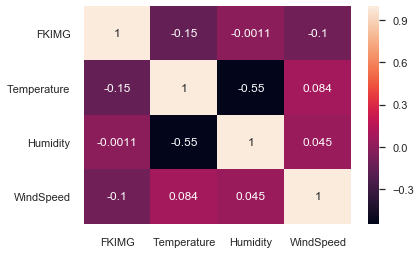

In [596]:
sns_heatmap = sns.heatmap(df_buy_ay_sum_corr.corr(), annot=True)
figure = sns_heatmap.get_figure()    
#figure.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_correlation_heatmap.png", dpi=600)


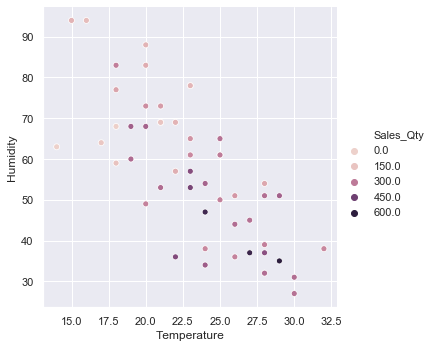

In [828]:
sns_plot = sns.relplot(x = 'Temperature', y = 'Humidity', hue = 'Sales_Qty', data = df_1_sum_corr.query("Monthh == '5'") ).set(adjustable='datalim', aspect='auto')
sns_plot.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_correlation_temp_humidity_sales.png", dpi=600)


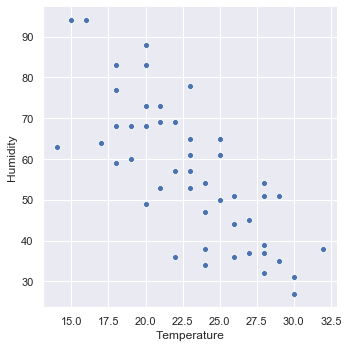

In [829]:
sns_plot = sns.relplot(x = 'Temperature', y = 'Humidity', data = df_1_sum_corr.query("Monthh == '5'")).set(adjustable='datalim', aspect='auto')
sns_plot.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_correlation_temp_humidity.png", dpi=600)


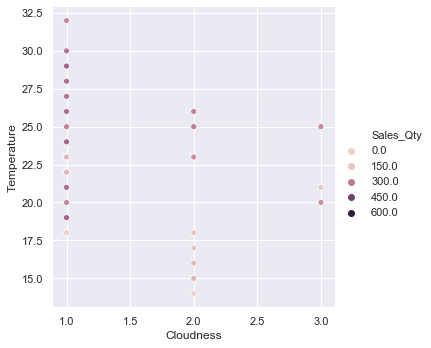

In [830]:
sns_plot = sns.relplot(x = 'Cloudness', y = 'Temperature', hue = 'Sales_Qty', data = df_1_sum_corr.query("Monthh == '5'")).set(adjustable='datalim', aspect='auto')
sns_plot.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_correlation_temp_cloudness_sales.png", dpi=600)


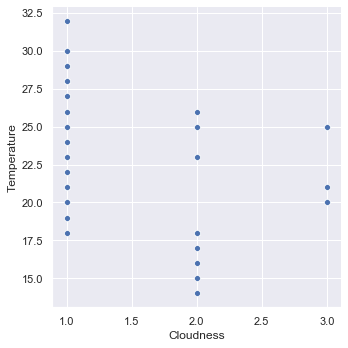

In [831]:
sns_plot = sns.relplot(x = 'Cloudness', y = 'Temperature', data = df_1_sum_corr.query("Monthh == '5'")).set(adjustable='datalim', aspect='auto')
sns_plot.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_correlation_temp_cloudness.png", dpi=600)


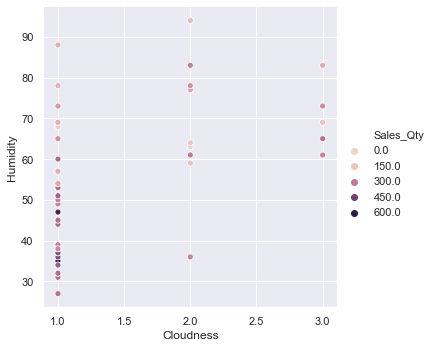

In [832]:
sns_plot = sns.relplot(x = 'Cloudness', y = 'Humidity', hue = 'Sales_Qty', data = df_1_sum_corr.query("Monthh == '5'")).set(adjustable='datalim', aspect='auto')
sns_plot.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_correlation_cloudness_humidity_sales.png", dpi=600)


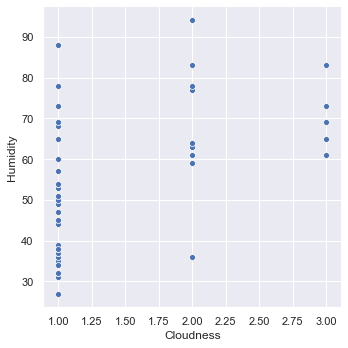

In [833]:
sns_plot = sns.relplot(x = 'Cloudness', y = 'Humidity', data = df_1_sum_corr.query("Monthh == '5'")).set(adjustable='datalim', aspect='auto')
sns_plot.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_correlation_cloudness_humidity.png", dpi=600)


In [796]:
df_1_sum

,index,Datee,Cloudness,Rain,weekdayy,Monthh,Yearr,13:00-Temperature,13:00-WindSpeed,13:00-Humidity,...,Shipment_Qty,region,sensor,ShipmentDay,Day_Name,Month_Name,Temp,Wind,Humidity,CloudnessNumeric
0,0,2017-03-01,Clear,None,3,3,2017,12.0,3.0,72.0,...,140,138,20,32,Wednesday,March,Cold,Weak,High,1.0
1,1,2017-03-04,Clear,None,6,3,2017,16.0,5.0,31.0,...,58,284,33,21,Saturday,March,Cool,Normal_Wind,Low,1.0
2,2,2017-03-05,Clear,None,7,3,2017,18.0,3.0,32.0,...,12,314,34,5,Sunday,March,Normal_Temp,Weak,Low,1.0
3,3,2017-03-06,Clear,None,1,3,2017,19.0,4.0,30.0,...,175,328,34,44,Monday,March,Normal_Temp,Normal_Wind,Low,1.0
4,4,2017-03-07,Clear,None,2,3,2017,20.0,3.0,40.0,...,253,348,38,60,Tuesday,March,Normal_Temp,Weak,Low,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
638,638,2019-10-23,Scattered,None,3,10,2019,21.0,7.0,60.0,...,88,460,57,57,Wednesday,October,Normal_Temp,Strong,Normal_Humidity,2.0
639,639,2019-10-26,Scattered,None,6,10,2019,21.0,6.0,60.0,...,1,450,54,63,Saturday,October,Normal_Temp,Strong,Normal_Humidity,2.0
640,640,2019-10-28,Broken,None,1,10,2019,20.0,4.0,69.0,...,1,450,54,75,Monday,October,Normal_Temp,Normal_Wind,Normal_Humidity,3.0
641,641,2019-10-29,Scattered,None,2,10,2019,20.0,4.0,64.0,...,0,450,54,71,Tuesday,October,Normal_Temp,Normal_Wind,Normal_Humidity,2.0


In [570]:
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn import preprocessing

df_buy_ay_sum.describe()


,FKIMG,NETWR,Temperature,Humidity,WindSpeed
count,969.000000,969.000000,969.000000,969.000000,969.000000
mean,34.071207,47.007688,20.010320,59.896801,5.578947
std,21.705440,19.064163,7.862973,16.379843,2.145582
min,2.000000,3.890000,1.000000,19.000000,0.000000
25%,19.000000,33.110000,14.000000,48.000000,4.000000
50%,27.000000,44.680000,21.000000,58.000000,5.000000
75%,45.000000,57.220000,27.000000,71.000000,7.000000
max,170.000000,166.580000,37.000000,100.000000,16.000000


In [597]:
X = df_buy_ay_sum['13:00-Temperature'].values.reshape(-1,1)


In [598]:
# normalize the data attributes
normalized_X = preprocessing.scale(X)
y = df_buy_ay_sum['FKIMG'].values.reshape(-1,1)

# Regression on only unnormalized Temp data
X_train, X_test, y_train, y_test = train_test_split(normalized_X, y, test_size=0.2, random_state=42)


In [599]:
regressor = LinearRegression()  
regressor.fit(X_train, y_train) #training the algorithm


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [600]:
#To retrieve the intercept:
print(regressor.intercept_)
#For retrieving the slope:
print(regressor.coef_)
#This means that for every one unit of change in temperature, the change in the sales is about 14.

[33.93896831]
[[-3.48869551]]


In [602]:
y_pred = regressor.predict(X_test)
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
df


,Actual,Predicted
0,24.0,31.280055
1,55.0,35.275297
2,24.0,33.943549
3,19.0,29.504392
4,37.0,34.387465
...,...,...
189,14.0,33.499634
190,13.0,38.382707
191,41.0,37.938791
192,56.0,36.163128


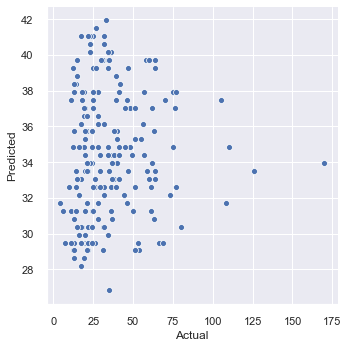

In [603]:
sns_plot = sns.relplot(x = 'Actual', y = 'Predicted', data = df).set(adjustable='datalim', aspect='auto')


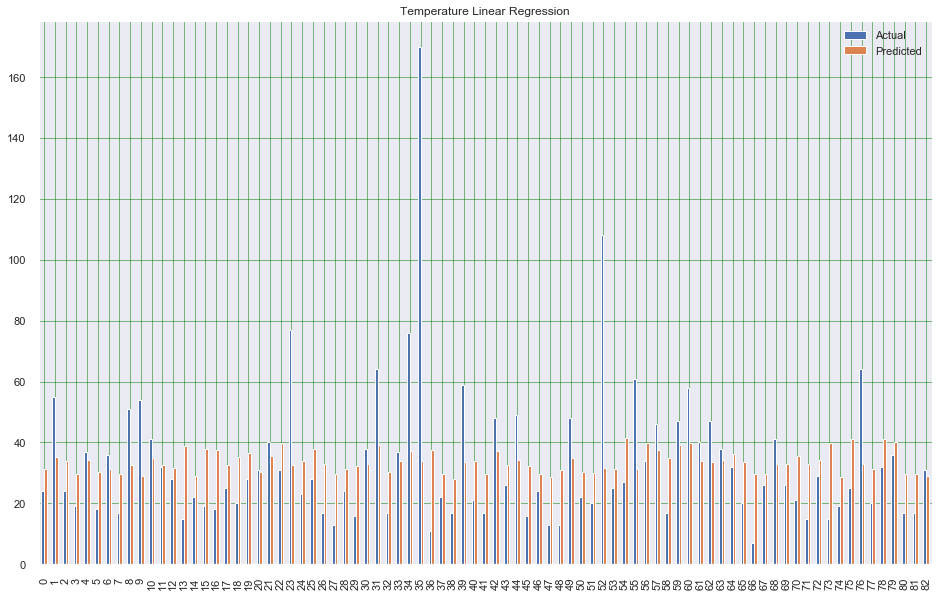

In [605]:
df_test = df.iloc[0:83]
df_test.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.title('Temperature Linear Regression')
#plt.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_tem_regression.png", dpi=600)
plt.show()


In [606]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


Mean Absolute Error: 16.4051120688842
Mean Squared Error: 517.8050704412068
Root Mean Squared Error: 22.755330593977465


In [607]:
X = df_buy_ay_sum['Temp'].values.reshape(-1,1)


In [609]:
X = pd.get_dummies(df_buy_ay_sum['Temp'])
y = df_buy_ay_sum['FKIMG'].values.reshape(-1,1)

X

,Cold,Cool,Freezing,Hot,Normal_Temp,Too Hot
0,1,0,0,0,0,0
1,1,0,0,0,0,0
2,1,0,0,0,0,0
3,0,1,0,0,0,0
4,0,0,0,0,1,0
...,...,...,...,...,...,...
964,0,0,0,0,1,0
965,0,0,0,0,1,0
966,0,0,0,0,1,0
967,0,0,0,0,1,0


In [610]:
# Regression on only nnormalized Temp data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [611]:
regressor = LinearRegression()  
regressor.fit(X_train, y_train) #training the algorithm


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [612]:
y_pred = regressor.predict(X_test)
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
df


,Actual,Predicted
0,24.0,30.468750
1,55.0,39.328125
2,24.0,35.921875
3,19.0,25.593750
4,37.0,35.921875
...,...,...
189,14.0,35.921875
190,13.0,40.390625
191,41.0,40.390625
192,56.0,39.328125


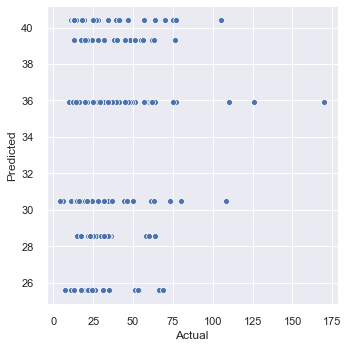

In [613]:
sns_plot = sns.relplot(x = 'Actual', y = 'Predicted', data = df).set(adjustable='datalim', aspect='auto')


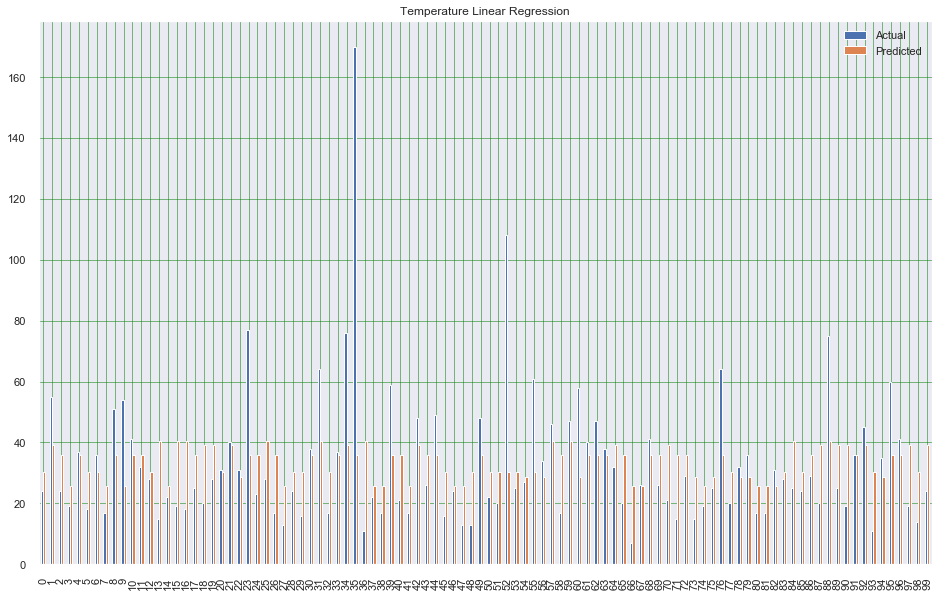

In [614]:
df_test = df.iloc[0:100]
df_test.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.title('Temperature Linear Regression')
#plt.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_tem_regression.png", dpi=600)
plt.show()


In [615]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


Mean Absolute Error: 15.772873711340207
Mean Squared Error: 508.358146746134
Root Mean Squared Error: 22.546799035475836


In [616]:
X = df_buy_ay_sum[['Temp', 'Month_Name']].values.reshape(-1,1)
y = df_buy_ay_sum['FKIMG'].values.reshape(-1,1)


In [617]:
X_t = pd.get_dummies(df_buy_ay_sum['Temp'])
X_m = pd.get_dummies(df_buy_ay_sum['Month_Name'])
X = pd.merge(X_t, X_m, left_index=True, right_index=True)

X

,Cold,Cool,Freezing,Hot,Normal_Temp,Too Hot,April,August,December,February,January,July,June,March,May,November,October,September
0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
964,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
965,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
966,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
967,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0


In [618]:
# Regression on only categorical Temp data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [619]:
regressor = LinearRegression()  
regressor.fit(X_train, y_train) #training the algorithm


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [620]:
y_pred = regressor.predict(X_test)
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
df


,Actual,Predicted
0,24.0,39.75
1,55.0,42.50
2,24.0,36.00
3,19.0,24.75
4,37.0,38.50
...,...,...
189,14.0,36.00
190,13.0,41.00
191,41.0,43.00
192,56.0,37.50


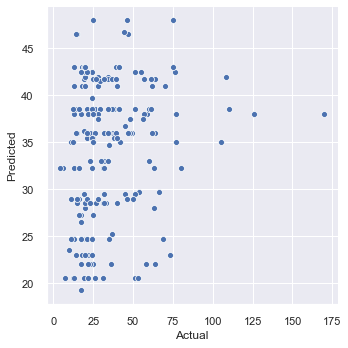

In [621]:
sns_plot = sns.relplot(x = 'Actual', y = 'Predicted', data = df).set(adjustable='datalim', aspect='auto')


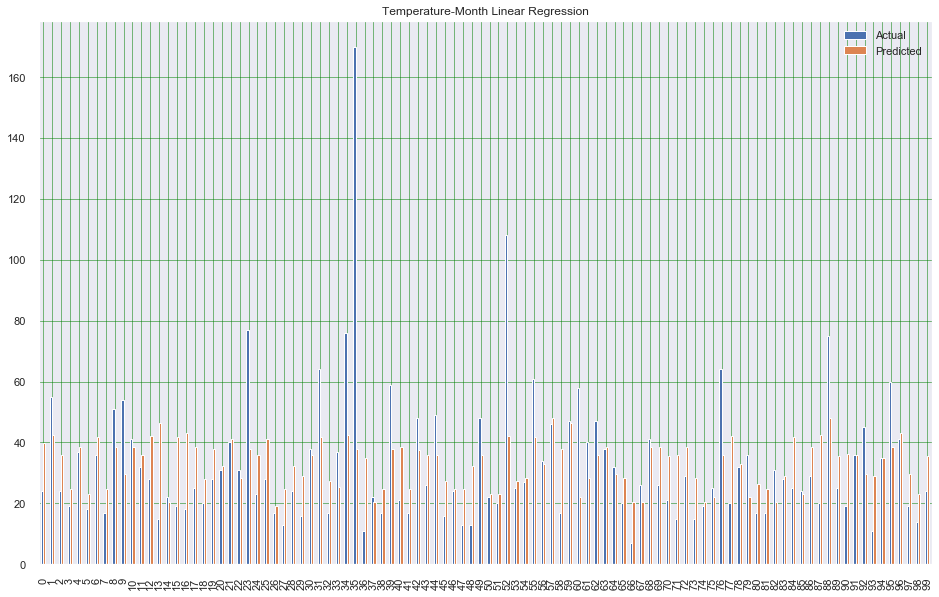

In [622]:
df_test = df.iloc[0:100]
df_test.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.title('Temperature-Month Linear Regression')
#plt.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_tem_mon_regression.png", dpi=600)
plt.show()


In [623]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


Mean Absolute Error: 15.514175257731958
Mean Squared Error: 501.3766108247423
Root Mean Squared Error: 22.391440570556025


In [624]:
mape = []
diff = []
meanMape = 0.0

for i in range(df.shape[0]):
    diff.append(float(df.iloc[i]['Actual']) - round(df.iloc[i]['Predicted'] ) )
    if (float(df['Actual'][i]) > abs(diff[i]) ):
        mape.append( abs(diff[i]) / float(df['Actual'][i]) )
    elif float(df['Actual'][i]) < abs(diff[i]):
        mape.append(1)
    elif diff[i] == 0:
        mape.append(0)   

meanMape = statistics.mean(mape)
meanMape

0.4429515875687882

In [848]:
X_t = pd.get_dummies(df_buy_yo_h_sum['Temp'])
X_m = pd.get_dummies(df_buy_yo_h_sum['Month_Name'])
X_d = pd.get_dummies(df_buy_yo_h_sum['Day_Name'])
y = df_buy_yo_h_sum['FKIMG'].values.reshape(-1,1)
X1 = pd.merge(X_t, X_m, left_index=True, right_index=True)
X = pd.merge(X1, X_d, left_index=True, right_index=True)

X

,Cold,Cool,Freezing,Hot,Normal_Temp,Too Hot,April,August,December,February,...,November,October,September,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
11,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2533,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
2536,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
2539,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
2542,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1


In [849]:
# Regression on only categorical Temp data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
regressor = LinearRegression()  
regressor.fit(X_train, y_train) #training the algorithm
y_pred = regressor.predict(X_test)
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
df

,Actual,Predicted
0,36.0,42.18750
1,53.0,40.50000
2,38.0,42.81250
3,38.0,42.06250
4,43.0,47.56250
...,...,...
190,42.0,40.06250
191,53.0,41.78125
192,32.0,40.84375
193,31.0,42.25000


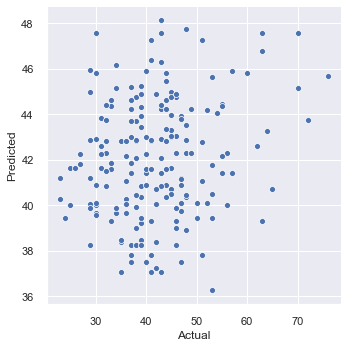

In [850]:
sns_plot = sns.relplot(x = 'Actual', y = 'Predicted', data = df).set(adjustable='datalim', aspect='auto')


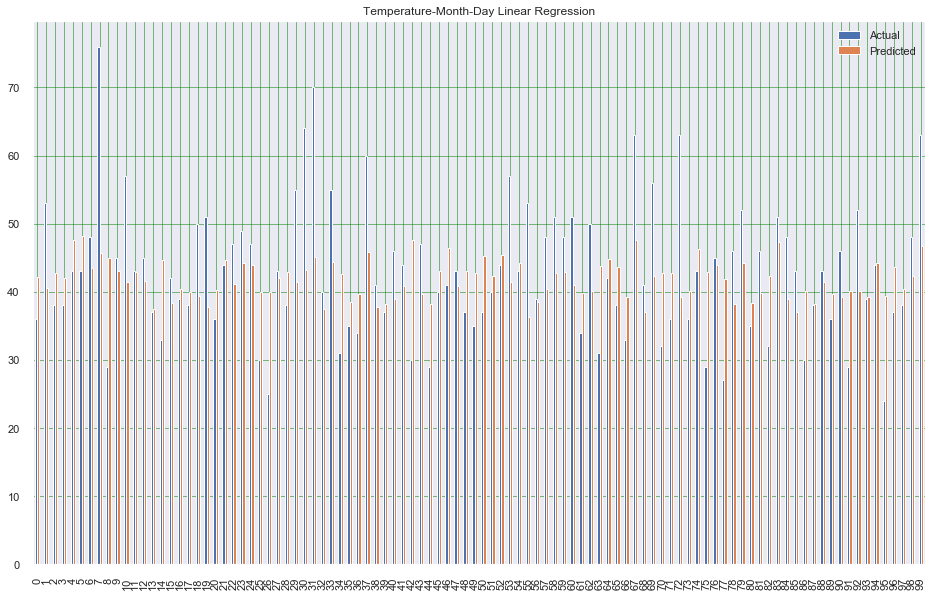

In [851]:
df_test = df.iloc[0:100]
df_test.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.title('Temperature-Month-Day Linear Regression')
#plt.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_tem_mon_day_regression.png", dpi=600)
plt.show()


In [852]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


Mean Absolute Error: 7.5264423076923075
Mean Squared Error: 91.84268329326923
Root Mean Squared Error: 9.5834588376676


In [853]:
mape = []
diff = []
meanMape = 0.0

for i in range(df.shape[0]):
    diff.append(float(df.iloc[i]['Actual']) - round(df.iloc[i]['Predicted'] ) )
    if (float(df['Actual'][i]) > abs(diff[i]) ):
        mape.append( abs(diff[i]) / float(df['Actual'][i]) )
    elif float(df['Actual'][i]) < abs(diff[i]):
        mape.append(1)
    elif diff[i] == 0:
        mape.append(0)   

meanMape = statistics.mean(mape)
meanMape

0.1899515607234397

In [625]:
X_t = pd.get_dummies(df_buy_ay_sum['Temp'])
X_m = pd.get_dummies(df_buy_ay_sum['Month_Name'])
X_d = pd.get_dummies(df_buy_ay_sum['Day_Name'])
y = df_buy_ay_sum['FKIMG'].values.reshape(-1,1)
X1 = pd.merge(X_t, X_m, left_index=True, right_index=True)
X = pd.merge(X1, X_d, left_index=True, right_index=True)

X

,Cold,Cool,Freezing,Hot,Normal_Temp,Too Hot,April,August,December,February,...,November,October,September,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
964,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
965,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
966,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
967,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1


In [626]:
# Regression on only categorical Temp data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
regressor = LinearRegression()  
regressor.fit(X_train, y_train) #training the algorithm
y_pred = regressor.predict(X_test)
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
df

,Actual,Predicted
0,24.0,40.250
1,55.0,45.375
2,24.0,35.750
3,19.0,26.875
4,37.0,39.875
...,...,...
189,14.0,35.875
190,13.0,40.250
191,41.0,45.375
192,56.0,39.625


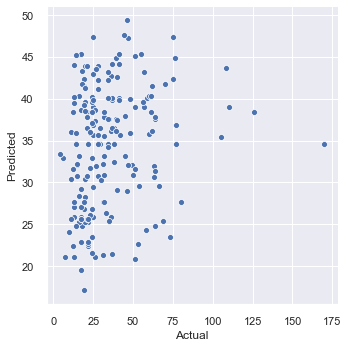

In [627]:
sns_plot = sns.relplot(x = 'Actual', y = 'Predicted', data = df).set(adjustable='datalim', aspect='auto')


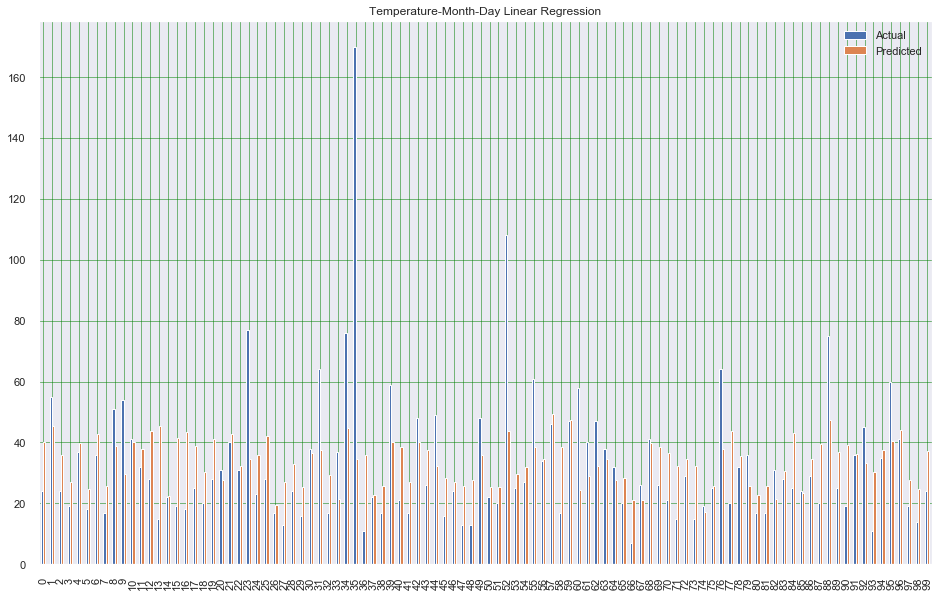

In [628]:
df_test = df.iloc[0:100]
df_test.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.title('Temperature-Month-Day Linear Regression')
#plt.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_tem_mon_day_regression.png", dpi=600)
plt.show()


In [629]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


Mean Absolute Error: 15.71520618556701
Mean Squared Error: 504.4416881443299
Root Mean Squared Error: 22.459779343179886


In [630]:
mape = []
diff = []
meanMape = 0.0

for i in range(df.shape[0]):
    diff.append(float(df.iloc[i]['Actual']) - round(df.iloc[i]['Predicted'] ) )
    if (float(df['Actual'][i]) > abs(diff[i]) ):
        mape.append( abs(diff[i]) / float(df['Actual'][i]) )
    elif float(df['Actual'][i]) < abs(diff[i]):
        mape.append(1)
    elif diff[i] == 0:
        mape.append(0)   

meanMape = statistics.mean(mape)
meanMape

0.4554295576249216

In [632]:
X_t = pd.get_dummies(df_buy_ay_sum['Temp'])
X_m = pd.get_dummies(df_buy_ay_sum['Month_Name'])
X_d = pd.get_dummies(df_buy_ay_sum['Day_Name'])
X_h = pd.get_dummies(df_buy_ay_sum['Humidity'])

y = df_buy_ay_sum['FKIMG'].values.reshape(-1,1)
X1 = pd.merge(X_t, X_m, left_index=True, right_index=True)
X2 = pd.merge(X1, X_d, left_index=True, right_index=True)
X = pd.merge(X2, X_h, left_index=True, right_index=True)

X

,Cold,Cool,Freezing,Hot,Normal_Temp,Too Hot,April,August,December,February,...,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday,High,Low,Normal_Humidity
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
2,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
964,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
965,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
966,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
967,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0


In [633]:
# Regression on only categorical Temp data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
regressor = LinearRegression()  
regressor.fit(X_train, y_train) #training the algorithm
y_pred = regressor.predict(X_test)
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
df


,Actual,Predicted
0,24.0,41.625
1,55.0,45.625
2,24.0,38.125
3,19.0,27.500
4,37.0,40.750
...,...,...
189,14.0,36.375
190,13.0,40.875
191,41.0,43.375
192,56.0,39.000


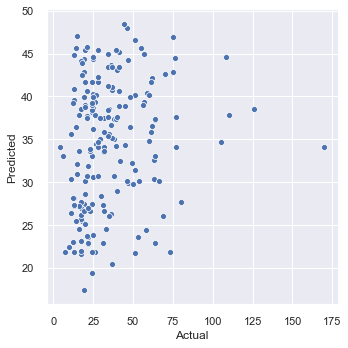

In [634]:
sns_plot = sns.relplot(x = 'Actual', y = 'Predicted', data = df).set(adjustable='datalim', aspect='auto')


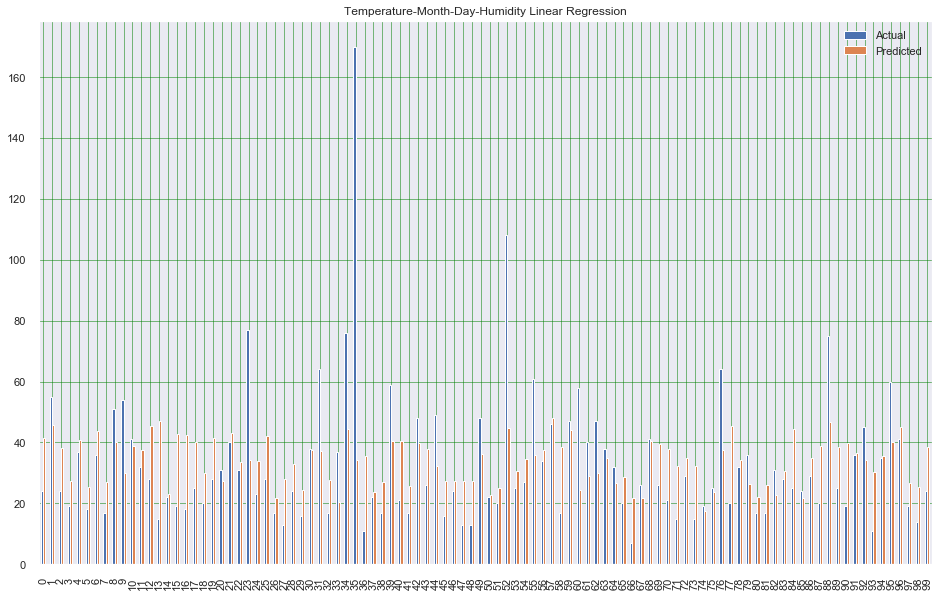

In [635]:
df_test = df.iloc[0:100]
df_test.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.title('Temperature-Month-Day-Humidity Linear Regression')
#plt.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_tem_mon_day_hum_regression.png", dpi=600)
plt.show()

In [636]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


Mean Absolute Error: 15.918170103092784
Mean Squared Error: 510.68919136597935
Root Mean Squared Error: 22.598433383002003


In [637]:
mape = []
diff = []
meanMape = 0.0

for i in range(df.shape[0]):
    diff.append(float(df.iloc[i]['Actual']) - round(df.iloc[i]['Predicted'] ) )
    if (float(df['Actual'][i]) > abs(diff[i]) ):
        mape.append( abs(diff[i]) / float(df['Actual'][i]) )
    elif float(df['Actual'][i]) < abs(diff[i]):
        mape.append(1)
    elif diff[i] == 0:
        mape.append(0)   

meanMape = statistics.mean(mape)
meanMape

0.46745097306020406

In [641]:
X_t = pd.get_dummies(df_buy_ay_sum['Temp'])
X_m = pd.get_dummies(df_buy_ay_sum['Month_Name'])
X_d = pd.get_dummies(df_buy_ay_sum['Day_Name'])
X_h = pd.get_dummies(df_buy_ay_sum['Humidity'])
X_c = pd.get_dummies(df_buy_ay_sum['Rain'])


y = df_buy_ay_sum['FKIMG'].values.reshape(-1,1)
X1 = pd.merge(X_t, X_m, left_index=True, right_index=True)
X2 = pd.merge(X1, X_d, left_index=True, right_index=True)
X3 = pd.merge(X2, X_h, left_index=True, right_index=True)
X = pd.merge(X3, X_c, left_index=True, right_index=True)

X

,Cold,Cool,Freezing,Hot,Normal_Temp,Too Hot,April,August,December,February,...,Sunday,Thursday,Tuesday,Wednesday,High,Low,Normal_Humidity,Heavy,Light,Snow
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
964,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
965,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
966,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
967,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0


In [642]:
# Regression on only categorical Temp data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
regressor = LinearRegression()  
regressor.fit(X_train, y_train) #training the algorithm
y_pred = regressor.predict(X_test)
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
df


,Actual,Predicted
0,24.0,40.75
1,55.0,46.50
2,24.0,37.25
3,19.0,27.50
4,37.0,40.25
...,...,...
189,14.0,36.75
190,13.0,40.25
191,41.0,44.00
192,56.0,40.00


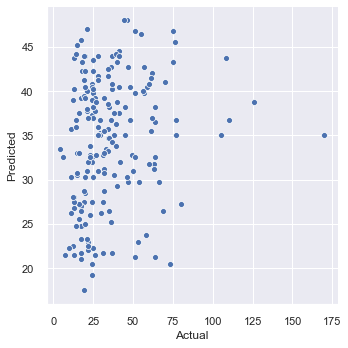

In [643]:
sns_plot = sns.relplot(x = 'Actual', y = 'Predicted', data = df).set(adjustable='datalim', aspect='auto')


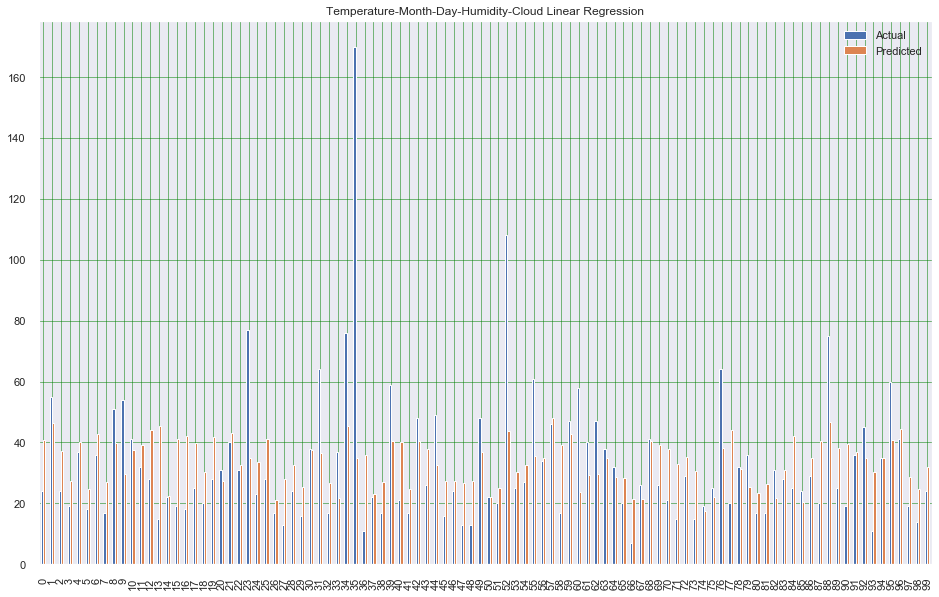

In [644]:
df_test = df.iloc[0:100]
df_test.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.title('Temperature-Month-Day-Humidity-Cloud Linear Regression')
#plt.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_tem_mon_day_hum_clo_regression.png", dpi=600)
plt.show()

In [645]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


Mean Absolute Error: 15.760309278350515
Mean Squared Error: 508.4529639175258
Root Mean Squared Error: 22.54890161221885


In [646]:
mape = []
diff = []
meanMape = 0.0

for i in range(df.shape[0]):
    diff.append(float(df.iloc[i]['Actual']) - round(df.iloc[i]['Predicted'] ) )
    if (float(df['Actual'][i]) > abs(diff[i]) ):
        mape.append( abs(diff[i]) / float(df['Actual'][i]) )
    elif float(df['Actual'][i]) < abs(diff[i]):
        mape.append(1)
    elif diff[i] == 0:
        mape.append(0)   

meanMape = statistics.mean(mape)
meanMape

0.4552756774439493

In [1718]:
X_t = pd.get_dummies(df_1_sum['Temp'])
X_m = pd.get_dummies(df_1_sum['Month_Name'])
X_d = pd.get_dummies(df_1_sum['Day_Name'])
X_h = pd.get_dummies(df_1_sum['Humidity'])
X_c = pd.get_dummies(df_1_sum['Cloudness'])
X_r = pd.get_dummies(df_1_sum['Rain'])


y = df_1_sum['Sales_Qty'].values.reshape(-1,1)
X = pd.concat([X_t, X_m, X_d, X_h, X_c, X_r], axis=1, join='inner')
# Regression on only categorical Temp data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X

,Cold,Cool,Freezing,Hot,Normal_Temp,Too Hot,April,August,December,February,...,High,Low,Normal_Humidity,Broken,Clear,Scattered,Heavy,Light,None,Snow
0,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,1,0
1,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
2,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
3,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
4,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
638,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,1,0,0,1,0
639,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,1,0,0,1,0
640,0,0,0,0,1,0,0,0,0,0,...,0,0,1,1,0,0,0,0,1,0
641,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,1,0,0,1,0


In [1688]:
regressor = LinearRegression()  
regressor.fit(X_train, y_train) #training the algorithm
y_pred = regressor.predict(X_test)
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
df


,Actual,Predicted
0,96.0,152.50
1,60.0,45.25
2,217.0,219.25
3,182.0,261.75
4,453.0,260.75
...,...,...
124,341.0,255.75
125,64.0,56.75
126,66.0,50.25
127,212.0,205.75


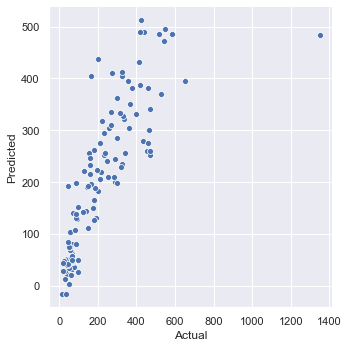

In [1658]:
sns_plot = sns.relplot(x = 'Actual', y = 'Predicted', data = df).set(adjustable='datalim', aspect='auto')


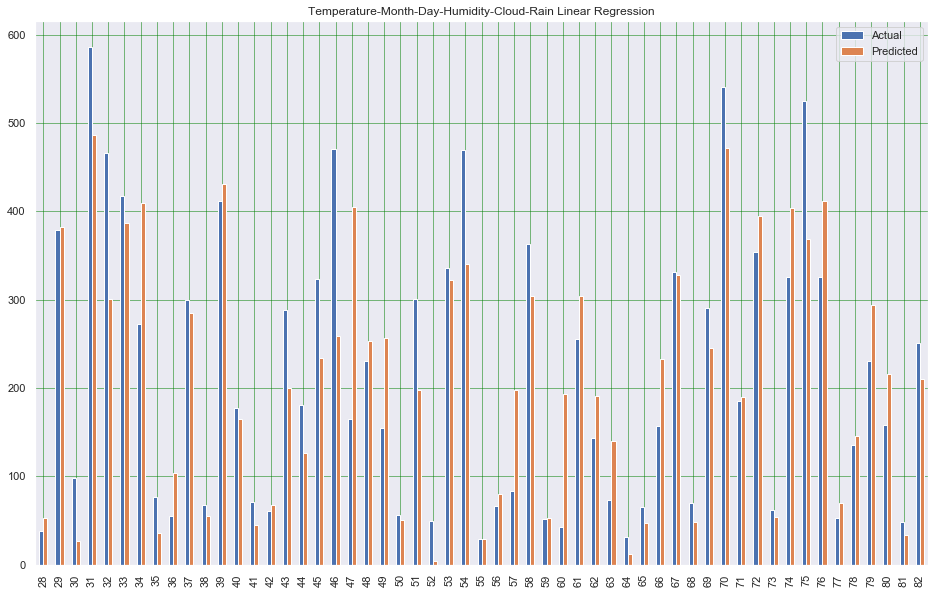

In [1365]:
df_test = df.iloc[28:83]
df_test.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.title('Temperature-Month-Day-Humidity-Cloud-Rain Linear Regression')
plt.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_tem_mon_day_hum_clo_rain_regression.png", dpi=600)
plt.show()

In [1659]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


Mean Absolute Error: 59.35658914728682
Mean Squared Error: 11566.994186046511
Root Mean Squared Error: 107.54996134841942


In [1689]:
mape = []
diff = []
meanMape = 0.0

for i in range(df.shape[0]):
    diff.append(float(df.iloc[i]['Actual']) - round(df.iloc[i]['Predicted'] ) )
    if (float(df['Actual'][i]) > abs(diff[i]) ):
        mape.append( abs(diff[i]) / float(df['Actual'][i]) )
    elif float(df['Actual'][i]) < abs(diff[i]):
        mape.append(1)
    elif diff[i] == 0:
        mape.append(0)   

meanMape = statistics.mean(mape)
meanMape

0.3261525201268668

In [1715]:
# Initialize placeholders 
x = tf.placeholder(dtype = tf.float32, shape = [None, 28, 28])
y = tf.placeholder(dtype = tf.int32, shape = [None])

# Flatten the input data
images_flat = tf.contrib.layers.flatten(x)

# Fully connected layer 
logits = tf.contrib.layers.fully_connected(images_flat, 62, tf.nn.relu)

# Define a loss function
loss = tf.reduce_mean(tf.nn.sparse_softmax_cross_entropy_with_logits(labels = y, 
                                                                    logits = logits))
# Define an optimizer 
train_op = tf.train.AdamOptimizer(learning_rate=0.001).minimize(loss)

# Convert logits to label indexes
correct_pred = tf.argmax(logits, 1)

# Define an accuracy metric
accuracy = tf.reduce_mean(tf.cast(correct_pred, tf.float32))

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
Use keras.layers.flatten instead.
Instructions for updating:
Please use `layer.__call__` method instead.


In [650]:
import tensorflow as tf

In [913]:
X_t = pd.get_dummies(df_buy_yo_h_sum['Temp'])
X_m = pd.get_dummies(df_buy_yo_h_sum['Month_Name'])
X_d = pd.get_dummies(df_buy_yo_h_sum['Day_Name'])
X_h = pd.get_dummies(df_buy_yo_h_sum['Humidity'])
X_c = pd.get_dummies(df_buy_yo_h_sum['Rain'])


y = df_buy_yo_h_sum['FKIMG'].values.reshape(-1,1)
X1 = pd.merge(X_t, X_m, left_index=True, right_index=True)
X2 = pd.merge(X1, X_d, left_index=True, right_index=True)
X3 = pd.merge(X2, X_h, left_index=True, right_index=True)
X = pd.merge(X3, X_c, left_index=True, right_index=True)

# Regression on only categorical Temp data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X

,Cold,Cool,Freezing,Hot,Normal_Temp,Too Hot,April,August,December,February,...,Thursday,Tuesday,Wednesday,High,Low,Normal_Humidity,Heavy,Light,None,Snow
0,1,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,1,0
2,1,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,1,0
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
11,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2533,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
2536,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
2539,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,1,0,0,1,0
2542,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,1,0,0,1,0


In [936]:
training_epochs = 25000

# Model parameters
W1 = tf.Variable(tf.random_normal([32, 1], stddev=0.1), name='W1')
b1 = tf.Variable(tf.random_normal([1]), name='b1')

W2 = tf.Variable(tf.random_normal([1, 1], stddev=0.1), name='W1')
b2 = tf.Variable(tf.random_normal([1]), name='b1')

# Model input and output
xd = tf.placeholder(tf.float32, [None, 32])

hidden_out = tf.add(tf.matmul(xd, W1), b1)
hidden_out = tf.nn.relu(hidden_out)

# Dropout on hidden layer: RELU layer
keep_prob = tf.placeholder(tf.float32)
hidden_out_dropout = tf.nn.dropout(hidden_out, keep_prob)

hidden_out2 = tf.add(tf.matmul(hidden_out_dropout, W2), b2)
hidden_out2 = tf.nn.relu(hidden_out2)

# Dropout on hidden layer: RELU layer
keep_prob2 = tf.placeholder(tf.float32)
hidden_out2_dropout = tf.nn.dropout(hidden_out2, keep_prob2)


#linear_model = W * x + b
#y = 1*(tf.matmul(hidden_out2, W3) + b3)
y = hidden_out_dropout

y_ = tf.placeholder(tf.float32, [None, 1])
# loss
#loss = tf.reduce_sum(tf.square(y - y_)) / (len(X_train)-1)
loss = tf.reduce_mean(tf.square(y - y_)) 


# optimizer
optimizer = tf.train.GradientDescentOptimizer(0.0001).minimize(loss)
#optimizer = tf.train.AdamOptimizer(learning_rate=0.05).minimize(loss)



In [937]:
results = []

#Start session
sess = tf.InteractiveSession()
tf.global_variables_initializer().run()

cost2 = 0

# training loop
for epoch in range(training_epochs):
    _, cost = sess.run([optimizer, loss], feed_dict={xd: X_train, y_: y_train, keep_prob : 0.9, keep_prob2 : 0.9})
    cost2 = (epoch*cost2 + cost) / (epoch + 1)
        #if cost < 50:
        #   break

    results.append(cost2)

# evaluate training accuracy
correct_prediction = (  abs(tf.argmax(y, 1) - tf.argmax(y_, 1))  )
accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))


Text(0.5, 0, 'Epoch')

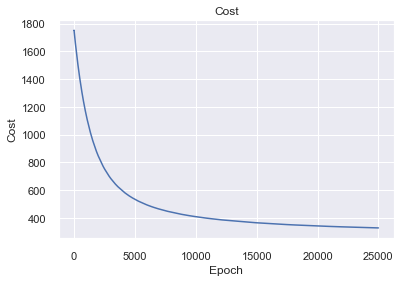

In [938]:
plt.plot(np.arange(0.0, training_epochs, 1), results)
plt.title('Cost')
plt.ylabel('Cost')
plt.xlabel('Epoch')

In [939]:
y_pred = sess.run(y, {xd: X_test, y_: y_test, keep_prob: 1.0, keep_prob2: 1.0})

# Close the session
sess.close()
y_pred

array([[38.143562],
       [37.34268 ],
       [37.961784],
       [40.30036 ],
       [39.88511 ],
       [42.458702],
       [41.761192],
       [38.51288 ],
       [41.200798],
       [38.14875 ],
       [37.483334],
       [40.55998 ],
       [36.69744 ],
       [39.104538],
       [41.8354  ],
       [38.498108],
       [39.3329  ],
       [35.821915],
       [36.13253 ],
       [28.479332],
       [37.13072 ],
       [38.671227],
       [37.13024 ],
       [38.475163],
       [41.252975],
       [39.4888  ],
       [39.4888  ],
       [37.13619 ],
       [37.926704],
       [37.483334],
       [37.78217 ],
       [38.65737 ],
       [36.077347],
       [39.27929 ],
       [37.390434],
       [36.525284],
       [37.21898 ],
       [39.683693],
       [35.112755],
       [36.088444],
       [36.748676],
       [37.490204],
       [39.88511 ],
       [35.13698 ],
       [39.3896  ],
       [37.526855],
       [42.514057],
       [40.575592],
       [38.14875 ],
       [37.8248  ],


In [940]:
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
df


,Actual,Predicted
0,36.0,38.143562
1,53.0,37.342682
2,38.0,37.961784
3,38.0,40.300362
4,43.0,39.885109
...,...,...
190,42.0,36.934872
191,53.0,33.136784
192,32.0,33.955662
193,31.0,37.503487


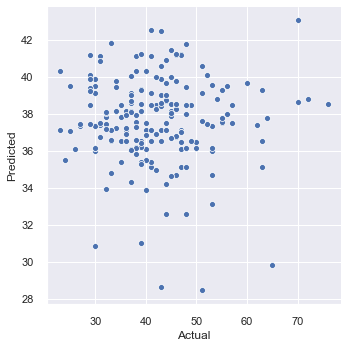

In [941]:
sns_plot = sns.relplot(x = 'Actual', y = 'Predicted', data = df).set(adjustable='datalim', aspect='auto')


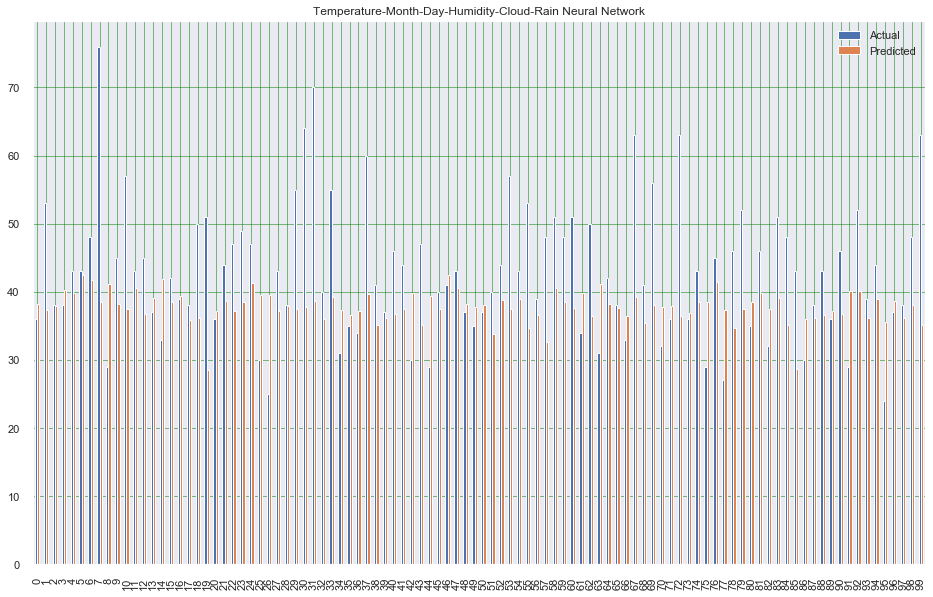

In [942]:
df_test = df.iloc[0:100]
df_test.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.title('Temperature-Month-Day-Humidity-Cloud-Rain Neural Network')
#plt.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_tem_mon_day_hum_clo_rain_nn2.png", dpi=600)
plt.show()

In [943]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


Mean Absolute Error: 8.227676802415115
Mean Squared Error: 119.03053298810764
Root Mean Squared Error: 10.91011150209326


In [944]:
mape = []
diff = []
meanMape = 0.0

for i in range(df.shape[0]):
    diff.append(float(df.iloc[i]['Actual']) - round(df.iloc[i]['Predicted'] ) )
    if (float(df['Actual'][i]) > abs(diff[i]) ):
        mape.append( abs(diff[i]) / float(df['Actual'][i]) )
    elif float(df['Actual'][i]) < abs(diff[i]):
        mape.append(1)
    elif diff[i] == 0:
        mape.append(0)   

meanMape = statistics.mean(mape)
meanMape

0.1872230178172557

In [946]:
X_t = pd.get_dummies(df_buy_ay_sum['Temp'])
X_m = pd.get_dummies(df_buy_ay_sum['Month_Name'])
X_d = pd.get_dummies(df_buy_ay_sum['Day_Name'])
X_h = pd.get_dummies(df_buy_ay_sum['Humidity'])
X_c = pd.get_dummies(df_buy_ay_sum['Rain'])


y = df_buy_ay_sum['FKIMG'].values.reshape(-1,1)
X1 = pd.merge(X_t, X_m, left_index=True, right_index=True)
X2 = pd.merge(X1, X_d, left_index=True, right_index=True)
X3 = pd.merge(X2, X_h, left_index=True, right_index=True)
X = pd.merge(X3, X_c, left_index=True, right_index=True)

# Regression on only categorical Temp data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X

,Cold,Cool,Freezing,Hot,Normal_Temp,Too Hot,April,August,December,February,...,Sunday,Thursday,Tuesday,Wednesday,High,Low,Normal_Humidity,Heavy,Light,Snow
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
964,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
965,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
966,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
967,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0


In [947]:
training_epochs = 35000

# Model parameters
W1 = tf.Variable(tf.random_normal([31, 1], stddev=0.1), name='W1')
b1 = tf.Variable(tf.random_normal([1]), name='b1')

W2 = tf.Variable(tf.random_normal([1, 1], stddev=0.1), name='W1')
b2 = tf.Variable(tf.random_normal([1]), name='b1')

# Model input and output
xd = tf.placeholder(tf.float32, [None, 31])

hidden_out = tf.add(tf.matmul(xd, W1), b1)
hidden_out = tf.nn.relu(hidden_out)

# Dropout on hidden layer: RELU layer
keep_prob = tf.placeholder(tf.float32)
hidden_out_dropout = tf.nn.dropout(hidden_out, keep_prob)

hidden_out2 = tf.add(tf.matmul(hidden_out_dropout, W2), b2)
hidden_out2 = tf.nn.relu(hidden_out2)

# Dropout on hidden layer: RELU layer
keep_prob2 = tf.placeholder(tf.float32)
hidden_out2_dropout = tf.nn.dropout(hidden_out2, keep_prob2)


#linear_model = W * x + b
#y = 1*(tf.matmul(hidden_out2, W3) + b3)
y = hidden_out_dropout

y_ = tf.placeholder(tf.float32, [None, 1])
# loss
#loss = tf.reduce_sum(tf.square(y - y_)) / (len(X_train)-1)
loss = tf.reduce_mean(tf.square(y - y_)) 


# optimizer
optimizer = tf.train.GradientDescentOptimizer(0.0001).minimize(loss)
#optimizer = tf.train.AdamOptimizer(learning_rate=0.05).minimize(loss)



In [948]:
results = []

#Start session
sess = tf.InteractiveSession()
tf.global_variables_initializer().run()

cost2 = 0

# training loop
for epoch in range(training_epochs):
    _, cost = sess.run([optimizer, loss], feed_dict={xd: X_train, y_: y_train, keep_prob : 0.9, keep_prob2 : 0.9})
    cost2 = (epoch*cost2 + cost) / (epoch + 1)
        #if cost < 50:
        #   break

    results.append(cost2)

# evaluate training accuracy
correct_prediction = (  abs(tf.argmax(y, 1) - tf.argmax(y_, 1))  )
accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))


/usr/local/lib/python3.7/site-packages/tensorflow_core/python/client/session.py:1750: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


Text(0.5, 0, 'Epoch')

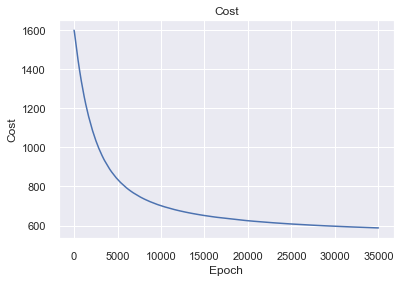

In [949]:
plt.plot(np.arange(0.0, training_epochs, 1), results)
plt.title('Cost')
plt.ylabel('Cost')
plt.xlabel('Epoch')

In [1069]:
keep_prob = tf.placeholder("float")
print("Accuracy:", accuracy.eval({xd: X_test, y_: y_test, keep_prob: 1.0, keep_prob2: 1.0}))

Accuracy: 0.0


In [950]:
y_pred = sess.run(y, {xd: X_test, y_: y_test, keep_prob: 1.0, keep_prob2: 1.0})

# Close the session
sess.close()

In [0]:
y_pred

In [951]:
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
df


,Actual,Predicted
0,24.0,30.738743
1,55.0,33.147915
2,24.0,34.091545
3,19.0,25.981113
4,37.0,35.958908
...,...,...
189,14.0,33.302296
190,13.0,36.073147
191,41.0,38.574242
192,56.0,36.890934


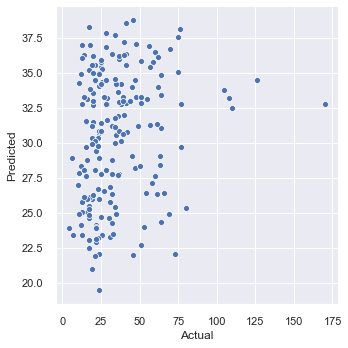

In [952]:
sns_plot = sns.relplot(x = 'Actual', y = 'Predicted', data = df).set(adjustable='datalim', aspect='auto')


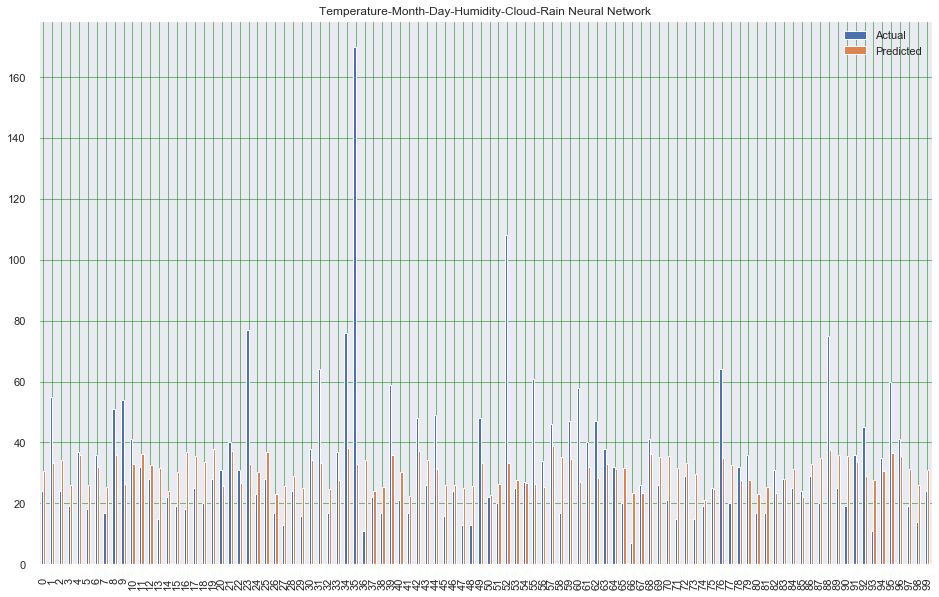

In [953]:
df_test = df.iloc[0:100]
df_test.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.title('Temperature-Month-Day-Humidity-Cloud-Rain Neural Network')
#plt.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_tem_mon_day_hum_clo_rain_nn2.png", dpi=600)
plt.show()

In [954]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


Mean Absolute Error: 15.244169392536596
Mean Squared Error: 515.4434757735645
Root Mean Squared Error: 22.703380271967532


In [955]:
mape = []
diff = []
meanMape = 0.0

for i in range(df.shape[0]):
    diff.append(float(df.iloc[i]['Actual']) - round(df.iloc[i]['Predicted'] ) )
    if (float(df['Actual'][i]) > abs(diff[i]) ):
        mape.append( abs(diff[i]) / float(df['Actual'][i]) )
    elif float(df['Actual'][i]) < abs(diff[i]):
        mape.append(1)
    elif diff[i] == 0:
        mape.append(0)   

meanMape = statistics.mean(mape)
meanMape

0.41989103764666685

In [723]:
X_train

,Cold,Cool,Freezing,Hot,Normal_Temp,Too Hot,April,August,December,February,...,Sunday,Thursday,Tuesday,Wednesday,High,Low,Normal_Humidity,Heavy,Light,Snow
722,1,0,0,0,0,0,0,0,0,1,...,0,0,1,0,0,0,1,0,0,0
192,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
947,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
568,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
451,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
270,0,1,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
860,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
435,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [956]:
X_t = pd.get_dummies(df_buy_ay_sum['Temp'])
X_m = pd.get_dummies(df_buy_ay_sum['Month_Name'])
X_d = pd.get_dummies(df_buy_ay_sum['Day_Name'])
X_h = pd.get_dummies(df_buy_ay_sum['Humidity'])
#X_c = pd.get_dummies(df_1_sum['Cloudness'])
X_r = pd.get_dummies(df_buy_ay_sum['Rain'])


y = df_buy_ay_sum['FKIMG'].values.reshape(-1,1)
#X1 = pd.merge(X_t, X_m, left_index=True, right_index=True)
#X2 = pd.merge(X1, X_d, left_index=True, right_index=True)
#X3 = pd.merge(X2, X_h, left_index=True, right_index=True)
#X4 = pd.merge(X3, X_c, left_index=True, right_index=True)
#X = pd.merge(X3, X_r, left_index=True, right_index=True)
X_time = pd.concat([X_m, X_d], axis=1, join='inner')
X_event = pd.concat([X_t, X_h, X_r], axis=1, join='inner')
#X = np.matmul(X_time, X_event)
#X = np.reshape(X, (643, 304))

X

,Cold,Cool,Freezing,Hot,Normal_Temp,Too Hot,April,August,December,February,...,Sunday,Thursday,Tuesday,Wednesday,High,Low,Normal_Humidity,Heavy,Light,Snow
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
964,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
965,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
966,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
967,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0


In [957]:
X_time_1 = X_time.iloc[1,:].values.reshape(19,1)
X_event_1 = X_event.iloc[1,:].values.reshape(1,12)
X_com = np.matmul(X_time_1, X_event_1).reshape(1,228)
pd.DataFrame(np.matmul(X_time_1, X_event_1).reshape(1,228) )


,0,1,2,3,4,5,6,7,8,9,...,218,219,220,221,222,223,224,225,226,227
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [958]:
X = pd.DataFrame()
for i in range(X_time.shape[0]):
    X_time_1 = X_time.iloc[i,:].values.reshape(19,1)
    X_event_1 = X_event.iloc[i,:].values.reshape(1,12)
    #X_1.append( pd.DataFrame(np.matmul(X_time_1, X_event_1).reshape(1,304) ) )
    X = pd.concat([X, pd.DataFrame(np.matmul(X_time_1, X_event_1).reshape(1,228) )], axis=0, join='outer')


In [726]:
X

,0,1,2,3,4,5,6,7,8,9,...,218,219,220,221,222,223,224,225,226,227
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0


In [959]:
# Regression on only categorical Temp data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [728]:
X_test

,0,1,2,3,4,5,6,7,8,9,...,218,219,220,221,222,223,224,225,226,227
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,1,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
0,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [970]:
training_epochs = 60000

# Model parameters
W1 = tf.Variable(tf.random_normal([228, 10], stddev=0.1), name='W1')
b1 = tf.Variable(tf.random_normal([10]), name='b1')

W2 = tf.Variable(tf.random_normal([10, 2], stddev=0.1), name='W2')
b2 = tf.Variable(tf.random_normal([2]), name='b2')

W3 = tf.Variable(tf.random_normal([2, 1], stddev=0.1), name='W3')
b3 = tf.Variable(tf.random_normal([1]), name='b3')


# Model input and output
xd = tf.placeholder(tf.float32, [None, 228])

hidden_out = tf.add(tf.matmul(xd, W1), b1)
hidden_out = tf.nn.relu(hidden_out)

# Dropout on hidden layer: RELU layer
keep_prob = tf.placeholder(tf.float32)
hidden_out_dropout = tf.nn.dropout(hidden_out, keep_prob)

hidden_out2 = tf.add(tf.matmul(hidden_out_dropout, W2), b2)
hidden_out2 = tf.nn.relu(hidden_out2)

# Dropout on hidden layer: RELU layer
keep_prob2 = tf.placeholder(tf.float32)
hidden_out_dropout2 = tf.nn.dropout(hidden_out2, keep_prob2)

hidden_out3 = tf.add(tf.matmul(hidden_out_dropout2, W3), b3)
hidden_out3 = tf.nn.relu(hidden_out3)


#linear_model = W * x + b
#y = 1*(tf.matmul(hidden_out2, W3) + b3)
y = hidden_out3

y_ = tf.placeholder(tf.float32, [None, 1])
# loss
#loss = tf.reduce_sum(tf.square(y - y_)) / (len(X_train)-1)
loss = tf.reduce_mean(tf.square(y - y_)) 


# optimizer
optimizer = tf.train.GradientDescentOptimizer(0.00001).minimize(loss)
#optimizer = tf.train.AdamOptimizer(learning_rate=0.0001).minimize(loss)

In [971]:
results = []

#Start session
sess = tf.InteractiveSession()
tf.global_variables_initializer().run()

cost2 = 0

# training loop
for epoch in range(training_epochs):
    _, cost = sess.run([optimizer, loss], feed_dict={xd: X_train, y_: y_train, keep_prob : 0.9, keep_prob2 : 1})
    cost2 = (epoch*cost2 + cost) / (epoch + 1)
        #if cost < 50:
        #   break

    results.append(cost2)

# evaluate training accuracy
correct_prediction = (  abs(tf.argmax(y, 1) - tf.argmax(y_, 1))  )
accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

/usr/local/lib/python3.7/site-packages/tensorflow_core/python/client/session.py:1750: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


Text(0.5, 0, 'Epoch')

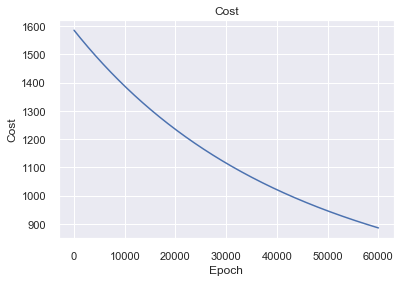

In [972]:
plt.plot(np.arange(0.0, training_epochs, 1), results)
plt.title('Cost')
plt.ylabel('Cost')
plt.xlabel('Epoch')

In [973]:
y_pred = sess.run(y, {xd: X_test, y_: y_test, keep_prob: 1.0, keep_prob2: 1.0})

# Close the session
sess.close()

In [974]:
y_pred

array([[23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.74423],
       [23.7

In [975]:
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
df


,Actual,Predicted
0,24.0,23.74423
1,55.0,23.74423
2,24.0,23.74423
3,19.0,23.74423
4,37.0,23.74423
...,...,...
189,14.0,23.74423
190,13.0,23.74423
191,41.0,23.74423
192,56.0,23.74423


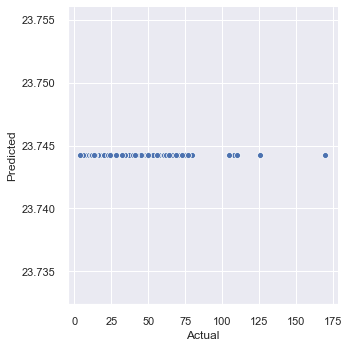

In [976]:
sns_plot = sns.relplot(x = 'Actual', y = 'Predicted', data = df).set(adjustable='datalim', aspect='auto')


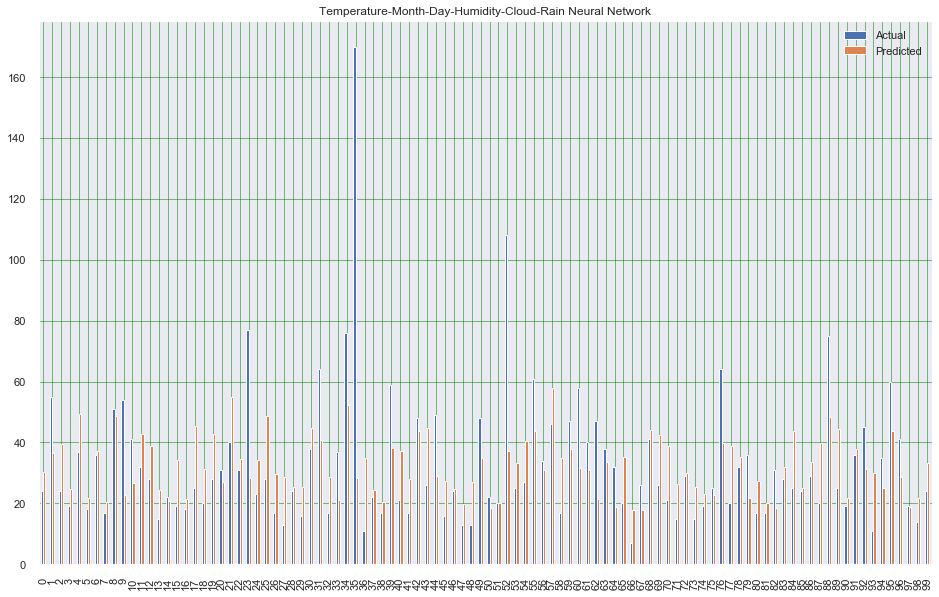

In [967]:
df_test = df.iloc[0:100]
df_test.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.title('Temperature-Month-Day-Humidity-Cloud-Rain Neural Network')
#plt.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_tem_mon_day_hum_clo_rain_nn.png", dpi=600)
plt.show()

In [968]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


Mean Absolute Error: 15.780045106238926
Mean Squared Error: 527.7651555964785
Root Mean Squared Error: 22.973139872391812


In [969]:
mape = []
diff = []
meanMape = 0.0

for i in range(df.shape[0]):
    diff.append(float(df.iloc[i]['Actual']) - round(df.iloc[i]['Predicted'] ) )
    if (float(df['Actual'][i]) > abs(diff[i]) ):
        mape.append( abs(diff[i]) / float(df['Actual'][i]) )
    elif float(df['Actual'][i]) < abs(diff[i]):
        mape.append(1)
    elif diff[i] == 0:
        mape.append(0)   

meanMape = statistics.mean(mape)
meanMape

0.4508106457087592

In [856]:
X_t = pd.get_dummies(df_buy_yo_h_sum['Temp'])
X_m = pd.get_dummies(df_buy_yo_h_sum['Month_Name'])
X_d = pd.get_dummies(df_buy_yo_h_sum['Day_Name'])


y = df_buy_yo_h_sum['FKIMG'].values.reshape(-1,1)
#X1 = pd.merge(X_t, X_m, left_index=True, right_index=True)
#X2 = pd.merge(X1, X_d, left_index=True, right_index=True)
#X3 = pd.merge(X2, X_h, left_index=True, right_index=True)
#X4 = pd.merge(X3, X_c, left_index=True, right_index=True)
#X = pd.merge(X3, X_r, left_index=True, right_index=True)
X_time = pd.concat([X_m], axis=1, join='inner')
X_event = pd.concat([X_t, X_d], axis=1, join='inner')


In [857]:
X_time_1 = X_time.iloc[1,:].values.reshape(12,1)
X_event_1 = X_event.iloc[1,:].values.reshape(1,13)
X_com = np.matmul(X_time_1, X_event_1).reshape(1,156)
pd.DataFrame(np.matmul(X_time_1, X_event_1).reshape(1,156) )


,0,1,2,3,4,5,6,7,8,9,...,146,147,148,149,150,151,152,153,154,155
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [858]:
X = pd.DataFrame()
for i in range(X_time.shape[0]):
    X_time_1 = X_time.iloc[i,:].values.reshape(12,1)
    X_event_1 = X_event.iloc[i,:].values.reshape(1,13)
    X = pd.concat([X, pd.DataFrame(np.matmul(X_time_1, X_event_1).reshape(1,156) )], axis=0, join='outer')
X

,0,1,2,3,4,5,6,7,8,9,...,146,147,148,149,150,151,152,153,154,155
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [859]:
# Regression on only categorical Temp data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [900]:
training_epochs = 25000

# Model parameters
W1 = tf.Variable(tf.random_normal([156, 1], stddev=0.1), name='W1')
b1 = tf.Variable(tf.random_normal([1]), name='b1')

W2 = tf.Variable(tf.random_normal([1, 1], stddev=0.1), name='W2')
b2 = tf.Variable(tf.random_normal([1]), name='b2')

W3 = tf.Variable(tf.random_normal([1, 1], stddev=0.1), name='W3')
b3 = tf.Variable(tf.random_normal([1]), name='b3')


# Model input and output
xd = tf.placeholder(tf.float32, [None, 156])

hidden_out = tf.add(tf.matmul(xd, W1), b1)
hidden_out = tf.nn.relu(hidden_out)

# Dropout on hidden layer: RELU layer
keep_prob = tf.placeholder(tf.float32)
hidden_out_dropout = tf.nn.dropout(hidden_out, keep_prob)

hidden_out2 = tf.add(tf.matmul(hidden_out_dropout, W2), b2)
hidden_out2 = tf.nn.relu(hidden_out2)

# Dropout on hidden layer: RELU layer
keep_prob2 = tf.placeholder(tf.float32)
hidden_out_dropout2 = tf.nn.dropout(hidden_out2, keep_prob2)

hidden_out3 = tf.add(tf.matmul(hidden_out_dropout2, W3), b3)
hidden_out3 = tf.nn.relu(hidden_out3)


#linear_model = W * x + b
#y = 1*(tf.matmul(hidden_out2, W3) + b3)
y = hidden_out_dropout

y_ = tf.placeholder(tf.float32, [None, 1])
# loss
#loss = tf.reduce_sum(tf.square(y - y_)) / (len(X_train)-1)
loss = tf.reduce_mean(tf.square(y - y_)) 


# optimizer
optimizer = tf.train.GradientDescentOptimizer(0.001).minimize(loss)
#optimizer = tf.train.AdamOptimizer(learning_rate=0.0001).minimize(loss)

In [901]:
results = []

#Start session
sess = tf.InteractiveSession()
tf.global_variables_initializer().run()

cost2 = 0

# training loop
for epoch in range(training_epochs):
    _, cost = sess.run([optimizer, loss], feed_dict={xd: X_train, y_: y_train, keep_prob : 0.9, keep_prob2 : 1})
    cost2 = (epoch*cost2 + cost) / (epoch + 1)
        #if cost < 50:
        #   break

    results.append(cost2)

# evaluate training accuracy
correct_prediction = (  abs(tf.argmax(y, 1) - tf.argmax(y_, 1))  )
accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

Text(0.5, 0, 'Epoch')

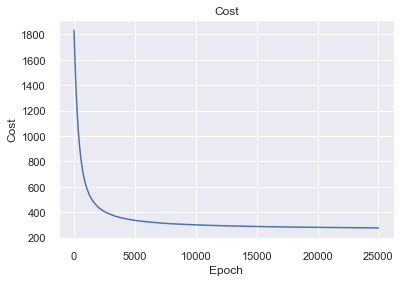

In [902]:
plt.plot(np.arange(0.0, training_epochs, 1), results)
plt.title('Cost')
plt.ylabel('Cost')
plt.xlabel('Epoch')

In [903]:
y_pred = sess.run(y, {xd: X_test, y_: y_test, keep_prob: 1.0, keep_prob2: 1.0})

# Close the session
sess.close()
y_pred

array([[34.904465],
       [35.664913],
       [38.012665],
       [39.877094],
       [41.98195 ],
       [41.835255],
       [40.769905],
       [41.098785],
       [41.038815],
       [34.09817 ],
       [38.81039 ],
       [37.39232 ],
       [39.8414  ],
       [38.072327],
       [35.79303 ],
       [36.25444 ],
       [39.54308 ],
       [37.278355],
       [38.715008],
       [37.363335],
       [36.16736 ],
       [35.79303 ],
       [38.8304  ],
       [38.41891 ],
       [37.391495],
       [38.25236 ],
       [38.25236 ],
       [39.877094],
       [37.1005  ],
       [38.81039 ],
       [35.62457 ],
       [39.042107],
       [36.754414],
       [41.413315],
       [39.435165],
       [35.547855],
       [35.714046],
       [37.466557],
       [37.363335],
       [33.95671 ],
       [32.765926],
       [38.920826],
       [41.98195 ],
       [33.75298 ],
       [36.56482 ],
       [34.09817 ],
       [40.650303],
       [40.110336],
       [34.09817 ],
       [38.157845],


In [905]:
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
df


,Actual,Predicted
0,36.0,34.904465
1,53.0,35.664913
2,38.0,38.012665
3,38.0,39.877094
4,43.0,41.981949
...,...,...
190,42.0,35.643555
191,53.0,37.617474
192,32.0,39.618942
193,31.0,36.545704


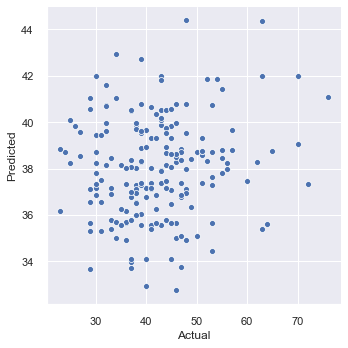

In [906]:
sns_plot = sns.relplot(x = 'Actual', y = 'Predicted', data = df).set(adjustable='datalim', aspect='auto')


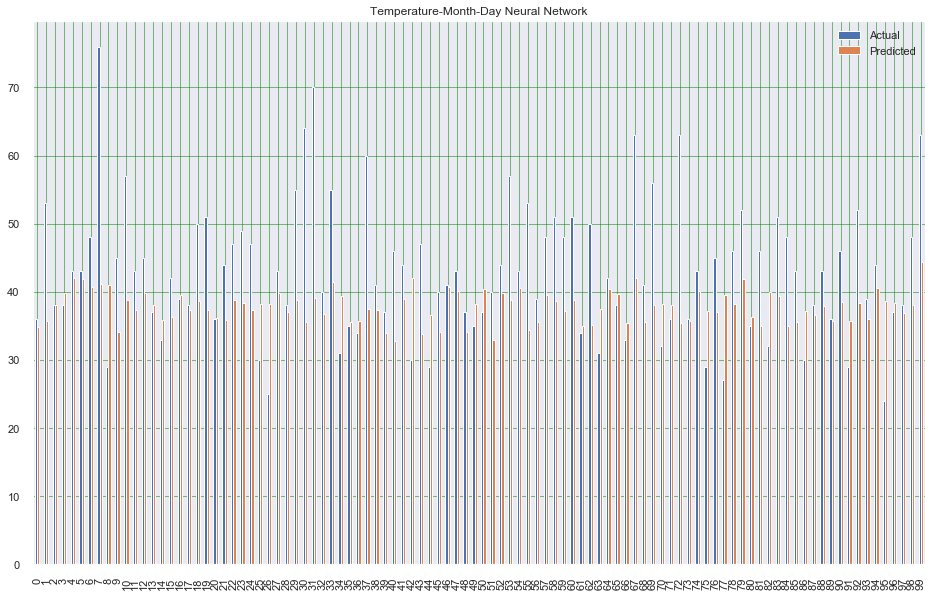

In [907]:
df_test = df.iloc[0:100]
df_test.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.title('Temperature-Month-Day Neural Network')
#plt.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_tem_mon_day_nn.png", dpi=600)
plt.show()

In [908]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


Mean Absolute Error: 7.936295240353315
Mean Squared Error: 109.04905086315263
Root Mean Squared Error: 10.442655354992457


In [909]:
mape = []
diff = []
meanMape = 0.0

for i in range(df.shape[0]):
    diff.append(float(df.iloc[i]['Actual']) - round(df.iloc[i]['Predicted'] ) )
    if (float(df['Actual'][i]) > abs(diff[i]) ):
        mape.append( abs(diff[i]) / float(df['Actual'][i]) )
    elif float(df['Actual'][i]) < abs(diff[i]):
        mape.append(1)
    elif diff[i] == 0:
        mape.append(0)   

meanMape = statistics.mean(mape)
meanMape

0.18325903510399408

In [868]:
X_t = pd.get_dummies(df_buy_ay_sum['Temp'])
X_m = pd.get_dummies(df_buy_ay_sum['Month_Name'])
X_d = pd.get_dummies(df_buy_ay_sum['Day_Name'])


y = df_buy_ay_sum['FKIMG'].values.reshape(-1,1)
#X1 = pd.merge(X_t, X_m, left_index=True, right_index=True)
#X2 = pd.merge(X1, X_d, left_index=True, right_index=True)
#X3 = pd.merge(X2, X_h, left_index=True, right_index=True)
#X4 = pd.merge(X3, X_c, left_index=True, right_index=True)
#X = pd.merge(X3, X_r, left_index=True, right_index=True)
X_time = pd.concat([X_m], axis=1, join='inner')
X_event = pd.concat([X_t, X_d], axis=1, join='inner')


In [771]:
X_time_1 = X_time.iloc[1,:].values.reshape(12,1)
X_event_1 = X_event.iloc[1,:].values.reshape(1,13)
X_com = np.matmul(X_time_1, X_event_1).reshape(1,156)
pd.DataFrame(np.matmul(X_time_1, X_event_1).reshape(1,156) )


,0,1,2,3,4,5,6,7,8,9,...,146,147,148,149,150,151,152,153,154,155
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [772]:
X = pd.DataFrame()
for i in range(X_time.shape[0]):
    X_time_1 = X_time.iloc[i,:].values.reshape(12,1)
    X_event_1 = X_event.iloc[i,:].values.reshape(1,13)
    X = pd.concat([X, pd.DataFrame(np.matmul(X_time_1, X_event_1).reshape(1,156) )], axis=0, join='outer')
X

,0,1,2,3,4,5,6,7,8,9,...,146,147,148,149,150,151,152,153,154,155
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [773]:
# Regression on only categorical Temp data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [804]:
training_epochs = 30000

# Model parameters
W1 = tf.Variable(tf.random_normal([156, 1], stddev=0.1), name='W1')
b1 = tf.Variable(tf.random_normal([1]), name='b1')

W2 = tf.Variable(tf.random_normal([1, 1], stddev=0.1), name='W2')
b2 = tf.Variable(tf.random_normal([1]), name='b2')

W3 = tf.Variable(tf.random_normal([1, 1], stddev=0.1), name='W3')
b3 = tf.Variable(tf.random_normal([1]), name='b3')


# Model input and output
xd = tf.placeholder(tf.float32, [None, 156])

hidden_out = tf.add(tf.matmul(xd, W1), b1)
hidden_out = tf.nn.relu(hidden_out)

# Dropout on hidden layer: RELU layer
keep_prob = tf.placeholder(tf.float32)
hidden_out_dropout = tf.nn.dropout(hidden_out, keep_prob)

hidden_out2 = tf.add(tf.matmul(hidden_out_dropout, W2), b2)
hidden_out2 = tf.nn.relu(hidden_out2)

# Dropout on hidden layer: RELU layer
keep_prob2 = tf.placeholder(tf.float32)
hidden_out_dropout2 = tf.nn.dropout(hidden_out2, keep_prob2)

hidden_out3 = tf.add(tf.matmul(hidden_out_dropout2, W3), b3)
hidden_out3 = tf.nn.relu(hidden_out3)


#linear_model = W * x + b
#y = 1*(tf.matmul(hidden_out2, W3) + b3)
y = hidden_out_dropout

y_ = tf.placeholder(tf.float32, [None, 1])
# loss
#loss = tf.reduce_sum(tf.square(y - y_)) / (len(X_train)-1)
loss = tf.reduce_mean(tf.square(y - y_)) 


# optimizer
optimizer = tf.train.GradientDescentOptimizer(0.001).minimize(loss)
#optimizer = tf.train.AdamOptimizer(learning_rate=0.0001).minimize(loss)

In [805]:
results = []

#Start session
sess = tf.InteractiveSession()
tf.global_variables_initializer().run()

cost2 = 0

# training loop
for epoch in range(training_epochs):
    _, cost = sess.run([optimizer, loss], feed_dict={xd: X_train, y_: y_train, keep_prob : 0.9, keep_prob2 : 1})
    cost2 = (epoch*cost2 + cost) / (epoch + 1)
        #if cost < 50:
        #   break

    results.append(cost2)

# evaluate training accuracy
correct_prediction = (  abs(tf.argmax(y, 1) - tf.argmax(y_, 1))  )
accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

/usr/local/lib/python3.7/site-packages/tensorflow_core/python/client/session.py:1750: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


Text(0.5, 0, 'Epoch')

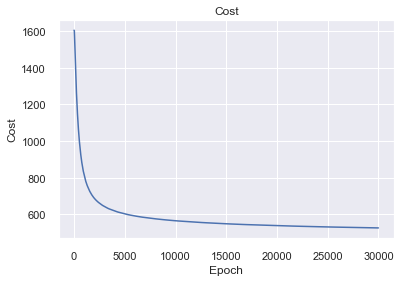

In [806]:
plt.plot(np.arange(0.0, training_epochs, 1), results)
plt.title('Cost')
plt.ylabel('Cost')
plt.xlabel('Epoch')

In [807]:
y_pred = sess.run(y, {xd: X_test, y_: y_test, keep_prob: 1.0, keep_prob2: 1.0})

# Close the session
sess.close()

In [808]:
y_pred

array([[34.221226],
       [34.86676 ],
       [30.909296],
       [20.89546 ],
       [39.843918],
       [21.387466],
       [34.60601 ],
       [21.47262 ],
       [37.476242],
       [28.476786],
       [32.871304],
       [33.060993],
       [31.031479],
       [30.459496],
       [19.0097  ],
       [37.881462],
       [38.452366],
       [37.476242],
       [30.542658],
       [32.986805],
       [27.252308],
       [40.84647 ],
       [23.4423  ],
       [35.19474 ],
       [32.447304],
       [38.229076],
       [21.228653],
       [25.89161 ],
       [26.558529],
       [23.001507],
       [35.383686],
       [33.412727],
       [21.032404],
       [24.244164],
       [36.968876],
       [35.19474 ],
       [29.289497],
       [21.09597 ],
       [21.47262 ],
       [33.51956 ],
       [35.602192],
       [25.89161 ],
       [32.341656],
       [34.991497],
       [28.986269],
       [21.609562],
       [20.89546 ],
       [21.47262 ],
       [27.252308],
       [32.447304],


In [809]:
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
df


,Actual,Predicted
0,24.0,34.221226
1,55.0,34.866760
2,24.0,30.909296
3,19.0,20.895460
4,37.0,39.843918
...,...,...
189,14.0,32.447304
190,13.0,34.510426
191,41.0,31.432154
192,56.0,38.351555


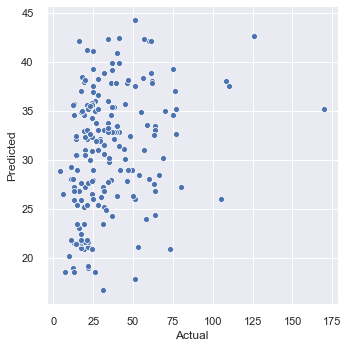

In [810]:
sns_plot = sns.relplot(x = 'Actual', y = 'Predicted', data = df).set(adjustable='datalim', aspect='auto')


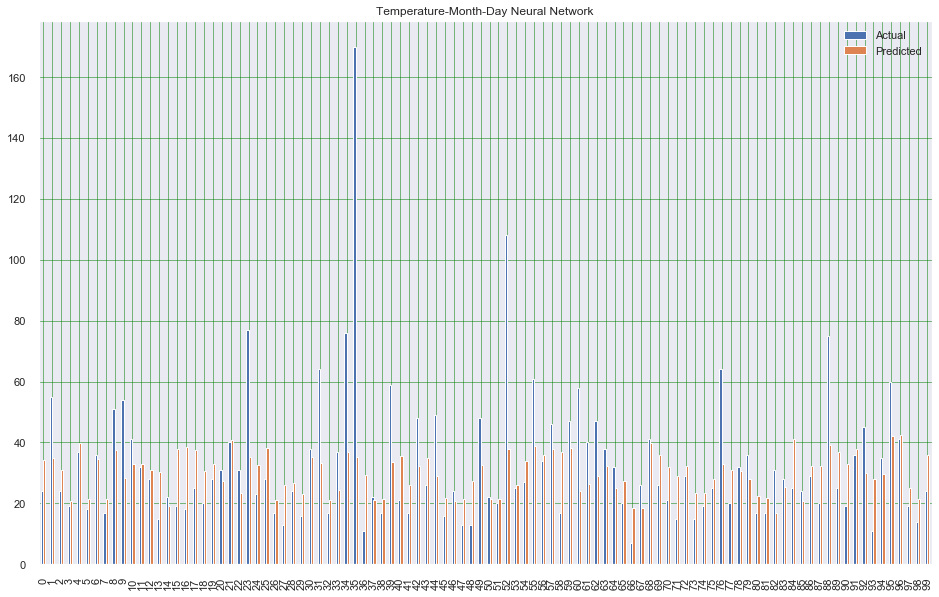

In [811]:
df_test = df.iloc[0:100]
df_test.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.title('Temperature-Month-Day Neural Network')
#plt.savefig("/Users/alperoner/Desktop/workspace/arctic/data/Figures/newyork_tem_mon_day_nn.png", dpi=600)
plt.show()

In [812]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))


Mean Absolute Error: 14.785419306804224
Mean Squared Error: 490.6429558536958
Root Mean Squared Error: 22.15046175260678


In [813]:
mape = []
diff = []
meanMape = 0.0

for i in range(df.shape[0]):
    diff.append(float(df.iloc[i]['Actual']) - round(df.iloc[i]['Predicted'] ) )
    if (float(df['Actual'][i]) > abs(diff[i]) ):
        mape.append( abs(diff[i]) / float(df['Actual'][i]) )
    elif float(df['Actual'][i]) < abs(diff[i]):
        mape.append(1)
    elif diff[i] == 0:
        mape.append(0)   

meanMape = statistics.mean(mape)
meanMape

0.40636123542782787